In [1]:

import tensorflow as tf
import numpy as np
import csv
import os
import sys
sys.path.append("../")
import time

from data_read import *
from evaluation import *

## Statistic Error

In [2]:
threshold_list=[0.1,0.2,0.5,1.0,2.0,5.0,10.0,20.0,50.0]
threshold_count=[0,0,0,0,0,0,0,0,0]

for i in range(1000):
    print (i)
    img_batch,lidar_batch,ground_truth,semantic= read_one_val(i)
    lidar=np.squeeze(lidar_batch)
    gt=np.squeeze(ground_truth)
    mask=np.logical_and(lidar>0.1,gt>0.1)
    
    rse=np.abs(lidar- gt)[mask]
    for j in range(9):
        if j==0:
            threshold_count[0]+=np.sum(rse<threshold_list[0])/len(rse)
        if j==8:
            threshold_count[8]+=np.sum(rse>threshold_list[8])/len(rse)
        else:
            threshold_count[j]+=np.sum(np.logical_and(rse>threshold_list[j-1],rse<threshold_list[j]))/len(rse)
  
    print (threshold_count)


0
[0.8928149772305617, 0.055068308315061563, 0.027744982290436836, 0.0037949063923089898, 0.0026142688480350817, 0.005228537696070163, 0.004132231404958678, 0.0032889188733344578, 0.00016866250632484398]
1
[1.7716711432108243, 0.1186319107705748, 0.05408735543520333, 0.00993368951454071, 0.008053696931025214, 0.016806748901292017, 0.008017537178523057, 0.004998453413702785, 0.00016866250632484398]
2
[2.5439493792837444, 0.2207808057700656, 0.14859799806683588, 0.030506049225305552, 0.013247708541168813, 0.019760206483530534, 0.008730440732856493, 0.0052021401435123375, 0.00016866250632484398]
3
[3.3221891575235225, 0.3159199009091607, 0.2332430827119205, 0.05387007258932892, 0.01849471378817406, 0.02500721173053578, 0.011700443702859463, 0.008271143212515406, 0.001158663496325834]
4
[4.249076861364623, 0.34745247684238584, 0.24947308503049226, 0.05889364473555351, 0.02089057127329656, 0.029412498074148113, 0.018888016158226956, 0.01337200108406653, 0.001158663496325834]
5
[5.1055266784

[37.68497867851953, 3.2807031603714867, 2.38855097787569, 0.6679582511335771, 0.2819329538913878, 0.23795512636714342, 0.20032913562674545, 0.14312722270814832, 0.002924900690615152]
45
[38.663070768611, 3.2890051051789277, 2.3949311761999272, 0.6692650387421558, 0.2833934812186228, 0.23880069481975313, 0.20163592323532412, 0.14435714045739884, 0.002924900690615152]
46
[39.54940886461357, 3.337247198612866, 2.4249520463235426, 0.6816265734989386, 0.29158099125233605, 0.24570388955406042, 0.20645210560809663, 0.14668496193757222, 0.002924900690615152]
47
[40.398466649625774, 3.424081231042591, 2.4722819154777405, 0.6921443221998714, 0.29571296395627394, 0.24632994602435404, 0.20757900725462514, 0.14693538452568966, 0.002924900690615152]
48
[41.26723784712121, 3.4907392013008742, 2.5042412162865064, 0.7003624281221256, 0.30106125511202664, 0.2506346681741062, 0.21162283715287716, 0.1505878760466915, 0.002924900690615152]
49
[42.122601831795535, 3.5454965448513214, 2.5545285726083455, 0.7

[75.99907133651963, 6.312693795940853, 4.426871269344257, 1.3135043114942135, 0.5919736331802331, 0.4736516737373391, 0.36371078680554364, 0.29263341739583043, 0.009407220769088998]
90
[76.75886772530181, 6.4016296391986325, 4.529541265502536, 1.3396280149133453, 0.6013858498533027, 0.4811430298648842, 0.3667841636783827, 0.2945542779413548, 0.009407220769088998]
91
[77.59659003657576, 6.4851347151470335, 4.5851858727844235, 1.3526804536584793, 0.6067289534331821, 0.4846542122173764, 0.36739480408751174, 0.29478326809477823, 0.009407220769088998]
92
[78.40685555186911, 6.575926418802913, 4.655236716138471, 1.366803607560505, 0.6154449569841465, 0.4882051766270286, 0.3689281750825888, 0.29526749051427625, 0.009407220769088998]
93
[79.23514937231218, 6.66453893337734, 4.708559685435012, 1.3758203195698326, 0.6201865038166378, 0.4957450133934491, 0.3714932741886906, 0.2989208134835728, 0.009407220769088998]
94
[80.11221859729336, 6.72492268055567, 4.73884561470514, 1.3857902217519245, 0.6

[114.60216277430072, 9.11996232614741, 6.475784235111644, 1.874166412289771, 0.8944560771208213, 0.735154373929261, 0.5428936808808906, 0.43963372746815615, 0.013673995530758444]
135
[115.53756601071699, 9.152326488757593, 6.491966316416735, 1.8770607682955598, 0.8989291727661312, 0.7397590312111976, 0.5432883657907709, 0.44160715201755757, 0.013673995530758444]
136
[116.38237631851942, 9.22061567988143, 6.532624870461116, 1.8918066523327823, 0.9086643195091519, 0.7472035551911547, 0.5487285948530471, 0.4470473810798339, 0.01424665122152437]
137
[117.22934479062937, 9.288117700900024, 6.585252194632498, 1.9046603305866223, 0.9184460495010679, 0.7524582035339195, 0.5519622246024408, 0.4481791514921217, 0.01424665122152437]
138
[118.09339352054124, 9.358361350459381, 6.621540426877185, 1.9085483554699816, 0.9235004818494349, 0.7573830350528412, 0.5574054594391438, 0.45193757554603564, 0.01424665122152437]
139
[118.94641641984181, 9.429262950536032, 6.658140982592428, 1.9140096949353451, 

[153.87671810250555, 12.078266257049643, 8.59138044002656, 2.48215799373518, 1.2508698096319957, 0.9824179704136048, 0.7100732244974073, 0.5965371687495176, 0.02240132808096519]
181
[154.7751081790429, 12.131314554753523, 8.616057135724633, 2.4875683922572174, 1.255488442516662, 0.9873005251773947, 0.712712443288645, 0.6024754110298026, 0.02240132808096519]
182
[155.59714688036263, 12.208393333799753, 8.672489813240624, 2.5035185177531285, 1.2668235570822841, 0.9958018611016114, 0.7183800005714561, 0.6043376084227263, 0.02240132808096519]
183
[156.44869507744932, 12.286638975764252, 8.71698555470365, 2.514741951646307, 1.2727934687275917, 0.9991450116229836, 0.7217231510928284, 0.6060091836834125, 0.02240132808096519]
184
[157.22151792658195, 12.37170994124524, 8.807751281004684, 2.5417263567628305, 1.2831316499085974, 1.0060663363119622, 0.7268046299784074, 0.6066224656178789, 0.02240132808096519]
185
[158.13320782382482, 12.421358939108705, 8.821079188218032, 2.5443715902555564, 1.28

[193.32063825570262, 14.916103095582889, 10.581710702277316, 3.0716625678916003, 1.5941201652093475, 1.3019636281389653, 0.905072862914305, 0.7430653243453614, 0.03375926117968543]
227
[194.22466197446585, 14.960236937175434, 10.607038953018527, 3.0797947152867717, 1.59911804746263, 1.3067073807861487, 0.911087263591984, 0.7445053921132564, 0.03375926117968543]
228
[195.12858246038522, 14.999717886926952, 10.63078274098098, 3.0847643453254245, 1.6033974511070255, 1.3100204674785838, 0.9166090747460425, 0.749751112709612, 0.03375926117968543]
229
[195.9803951651733, 15.07074631943937, 10.672215993279892, 3.099033450071223, 1.6086823047165806, 1.315305321088139, 0.9203084722727309, 0.7534505102363005, 0.03397065532406763]
230
[196.7793792000064, 15.151297843387121, 10.754364033918499, 3.1167402715516292, 1.617100301813823, 1.319659457517747, 0.9220501268445742, 0.757078957260974, 0.03411579320505457]
231
[197.61773353531476, 15.205457903472242, 10.820624569677491, 3.1385211277645975, 1.6

[232.62662666921565, 17.96350618076728, 12.662334711786624, 3.6537517478597947, 1.8945694734416858, 1.540565917968042, 1.0804231274920446, 0.8858683855941527, 0.03844290380797302]
273
[233.48417717714852, 18.021033860255923, 12.695892524821666, 3.667677098847125, 1.9068968333321092, 1.5574589667067704, 1.0846463896767267, 0.8882653722395129, 0.038785330471595894]
274
[234.33590927876514, 18.066391827923358, 12.750026474013351, 3.694559315937194, 1.9197374799833795, 1.5613388743280174, 1.086216828475803, 0.8901129472972495, 0.038785330471595894]
275
[235.16309232589703, 18.152763768003737, 12.799642842299797, 3.7065432399415785, 1.9293100046454184, 1.5684269269403668, 1.092647226722058, 0.8912090379074067, 0.038785330471595894]
276
[235.86307421979527, 18.253614754786284, 12.932903751226105, 3.7323444349442942, 1.94243692841873, 1.5835455219068706, 1.0985317097928529, 0.8945586667323207, 0.038785330471595894]
277
[236.6414490234656, 18.35669816389598, 12.991843984341754, 3.7500347713913

[270.6524200576902, 20.796146716051155, 14.986303408934464, 4.365498782546903, 2.2521304754258296, 1.8543916682070423, 1.2616503265372372, 1.0179901813117334, 0.043886879670107924]
318
[271.4390353344947, 20.8988096452733, 15.053402217624022, 4.3838940173051375, 2.2647443506886185, 1.8593846604985629, 1.2641906208609934, 1.0201800902115232, 0.043886879670107924]
319
[272.24604825302885, 20.976189028347385, 15.125376907842845, 4.398921699878299, 2.2738400532986898, 1.8671621453390586, 1.2676179870618898, 1.0236074564124196, 0.043886879670107924]
320
[273.0605898757897, 21.020897744288977, 15.181074634773449, 4.423759875401406, 2.294011662511395, 1.8892907017141902, 1.2775532572711326, 1.0297793666939188, 0.043886879670107924]
321
[273.9720812804668, 21.060622074473272, 15.203066271756567, 4.4322003276238, 2.303226468148688, 1.894246563569541, 1.279489140808379, 1.031173202840736, 0.043886879670107924]
322
[274.8655693303456, 21.10547832663815, 15.230949887967167, 4.442418547228926, 2.31

[309.46882993978403, 23.563441026101614, 16.88096223877897, 4.918449074646631, 2.5724302377509893, 2.1162434924820634, 1.4127208806599156, 1.1503582703905975, 0.04629776131260457]
363
[310.3300513267255, 23.625439505702932, 16.921083870673556, 4.932132662787521, 2.584255560835709, 2.123592086113282, 1.4144102125291613, 1.1517942024794563, 0.04629776131260457]
364
[311.18468556468207, 23.69577474844873, 16.96540728132244, 4.937015750401382, 2.5896081761047487, 2.129695945630608, 1.4207957886395943, 1.156207762438138, 0.04629776131260457]
365
[312.0708990162979, 23.748820824306428, 16.99165875231004, 4.943442834677656, 2.597755184342279, 2.1335884051218725, 1.4251408596996107, 1.167160962401929, 0.04629776131260457]
366
[312.9614853086183, 23.789696133967865, 17.01756709252474, 4.954280984966673, 2.6083868936734103, 2.1472135083423516, 1.4295793402941606, 1.1693285924597325, 0.04629776131260457]
367
[313.8411722991628, 23.84830389399395, 17.056611761582452, 4.962758324386302, 2.611402870

[347.97226467664456, 26.517687978549013, 18.902711606501683, 5.498238688169689, 2.8566080087302446, 2.360742836486522, 1.5893620345927726, 1.292997093274693, 0.048850153873525634]
408
[348.83869066942435, 26.5795000768144, 18.93652335256138, 5.505899161886339, 2.8660295108875045, 2.3692838244234773, 1.592267731519778, 1.3002173098811913, 0.050258976626013085]
409
[349.7098986867591, 26.64504720574181, 18.976068314641555, 5.515514546501724, 2.867790074267786, 2.371179815756088, 1.5964659980419882, 1.3040092925464135, 0.05066526048300117]
410
[350.5146628472788, 26.741819216298758, 19.05179410472073, 5.529928838983284, 2.8734069112441682, 2.372397924979882, 1.5968720344499194, 1.3046183471583104, 0.05066526048300117]
411
[351.2776799289829, 26.803045806132058, 19.14975664845401, 5.580042030998102, 2.890797320793458, 2.378366231215733, 1.5991358747462767, 1.305235758148226, 0.050768162314653774]
412
[352.1492926827851, 26.86913088294824, 19.188820957880395, 5.590078316028596, 2.8980543268

[387.6263518979386, 29.716912832450873, 21.333845003073197, 6.191418020612041, 3.2092452740513115, 2.6206574648526884, 1.7577551758629433, 1.4225357294092078, 0.05531810976961318]
455
[388.53001808752356, 29.75412520721692, 21.34870793382295, 6.1980237676119305, 3.2156308294845384, 2.6357405871691038, 1.7653517849128166, 1.4281506143591143, 0.05531810976961318]
456
[389.33440007076376, 29.850493922300718, 21.405010308124627, 6.212863153086791, 3.228986276411913, 2.6445569279512267, 1.7683196620077888, 1.4297218434093937, 0.05531810976961318]
457
[390.22055186836695, 29.91091336304639, 21.433389136353654, 6.22409817306016, 3.23481184232403, 2.6478026003879775, 1.7703169988919432, 1.4313862908128556, 0.05531810976961318]
458
[391.03600205483474, 29.97015683667452, 21.499878214670115, 6.250842978600916, 3.241737787981995, 2.657605477319251, 1.7795871107726038, 1.4345828811165318, 0.055637768799980794]
459
[391.87524049914344, 30.034298559337927, 21.562289128944194, 6.267947437977825, 3.24

[426.7023822586948, 32.66399734012444, 23.60921364824845, 6.860189942659939, 3.5543923297618387, 2.8975681808945666, 1.9466340998690081, 1.5446095216808302, 0.06101595760647941]
501
[427.53779309563197, 32.74531676690304, 23.65890414260951, 6.877657932145227, 3.563126324504483, 2.9006208392512187, 1.9479908369164092, 1.546220646924619, 0.06101595760647941]
502
[428.35233502486125, 32.83702786724235, 23.71493904323966, 6.898307471650801, 3.5665194413246475, 2.9036261712919362, 1.9509961689571267, 1.5515526876420207, 0.06111290380134126]
503
[429.0877265044237, 32.950657688773724, 23.824754817563207, 6.9225590548402085, 3.574795204134089, 2.9088794815970602, 1.9522195425898268, 1.552704098119856, 0.06111290380134126]
504
[429.9743776792236, 33.008235793602026, 23.8549639577646, 6.9336615593586695, 3.580905884915568, 2.91180572309805, 1.9535105314873222, 1.553909021090852, 0.06111290380134126]
505
[430.8120504064963, 33.09441761178385, 23.906818503219146, 6.942025195722306, 3.585196794006

[465.4274965149884, 35.94759523777571, 26.001102238432836, 7.481978792942983, 3.8597289533324135, 3.145256568307494, 2.13211177834078, 1.671193032357432, 0.06487467613630715]
547
[466.13294884517416, 36.043467915204886, 26.13489754760128, 7.528354059467503, 3.871608331949532, 3.148378712687634, 2.1343962742286875, 1.671497631809153, 0.06487467613630715]
548
[466.9999958984804, 36.10709148875499, 26.17577608441541, 7.53984382029289, 3.879346334138058, 3.1536155424515857, 2.1372882548446013, 1.6724355714683683, 0.06487467613630715]
549
[467.86135695377874, 36.162564538462334, 26.212204843042127, 7.556966210438779, 3.89236284501427, 3.163312406258697, 2.1409573384472917, 1.673483881069137, 0.06531147180329414]
550
[468.69426183809753, 36.25432714045183, 26.25959502969687, 7.567919602637281, 3.8960512321831535, 3.168006717200912, 2.1460987266220988, 1.6758310365402447, 0.06542324111144211]
551
[469.5624432111266, 36.318865383523026, 26.293969723654367, 7.58045510356765, 3.9045714554717637,

[504.1828061290243, 38.93237405776208, 28.395490818626833, 8.269201894808758, 4.255905842871862, 3.4338455203504967, 2.2945327491132383, 1.8008511511798455, 0.07498880664314066]
593
[505.0685422520777, 38.982436157695204, 28.4306489346104, 8.28104865128148, 4.263262296487989, 3.4392912067936035, 2.2963479779276073, 1.8026663799942144, 0.07527542171909365]
594
[505.91844760782874, 39.05425444073718, 28.467615864796347, 8.293519422910475, 4.2722813366839585, 3.4459719773091364, 2.301135863463739, 1.8074542655303463, 0.07527542171909365]
595
[506.77681399801986, 39.10555267369787, 28.52008611362433, 8.307583613317975, 4.282468859222726, 3.452553297179313, 2.304020825598611, 1.8085361263309232, 0.07536557678580841]
596
[507.67381647717247, 39.16354981891611, 28.547056288667527, 8.316072832760542, 4.286300276847246, 3.45570858228186, 2.3058238456572093, 1.8092122588528976, 0.07536557678580841]
597
[508.47631037323106, 39.2510977784557, 28.640359392957727, 8.320607189230719, 4.28839305675655

[545.3237134593447, 41.96432662717252, 30.608539617856362, 8.8910606574259, 4.555391290756836, 3.676207023658358, 2.4841846504381055, 1.9459517733844685, 0.0779240247184899]
641
[546.1951243150158, 42.04674578199461, 30.638588268051915, 8.89592567698137, 4.5582530669659365, 3.678973407327155, 2.486855641566599, 1.9476688391099288, 0.07801941725879324]
642
[547.0131899306955, 42.14133461880756, 30.693552051605387, 8.903453016847866, 4.563934078185934, 3.6860746713521517, 2.489128046054598, 1.9503673194394275, 0.07801941725879324]
643
[547.8553986512102, 42.176002238535936, 30.745910879339483, 8.929721780250297, 4.576264314068707, 3.700727995154868, 2.496633407026721, 1.9555495924916078, 0.07801941725879324]
644
[548.7319891471852, 42.25416375502516, 30.779213917511388, 8.936408355165904, 4.57834169656676, 3.7020263592161506, 2.497672098275747, 1.956198774522249, 0.07801941725879324]
645
[549.5767038338082, 42.34770912452937, 30.822010924059565, 8.946620391336781, 4.583408737414905, 3.70

[584.7365638075238, 45.29950864689944, 33.05659174977284, 9.642603078782141, 4.922609818901174, 3.9401564719642144, 2.646106669292631, 2.0865010764660283, 0.0817245329508812]
688
[585.5901660105974, 45.36959836885023, 33.09301353177515, 9.652197109163238, 4.928828171925959, 3.9513495074088265, 2.6529468576198942, 2.0904985891248185, 0.08225753463871988]
689
[586.3692292477085, 45.464847161392065, 33.179164267482214, 9.666686607085287, 4.93444425639187, 3.956067018360191, 2.6571027601246677, 2.0964516386586833, 0.08293146477462912]
690
[587.2886194248127, 45.51533100291115, 33.19176240514882, 9.671068568012803, 4.938095890498132, 3.962183505488181, 2.6590198680304558, 2.0974558380379054, 0.08293146477462912]
691
[588.1414821128283, 45.58216749005331, 33.23579442843849, 9.68222819925977, 4.944767409178384, 3.964609512281, 2.665812687050349, 2.100852247547852, 0.08293146477462912]
692
[588.918290898358, 45.67443708522988, 33.30825351543246, 9.709898311232207, 4.958117969040572, 3.97365343

[625.1520276226569, 48.256243397645676, 35.11376433780648, 10.244836154662783, 5.253147213887845, 4.16476136197018, 2.8301002573721745, 2.2220247102350608, 0.0881084174044954]
735
[625.9196590091369, 48.34672506100374, 35.21688835828501, 10.26782225851818, 5.260565456495723, 4.169045135870505, 2.8315630094357, 2.222442639396068, 0.0881084174044954]
736
[626.6357838586322, 48.441658838905006, 35.346739242789965, 10.295607754489284, 5.274643441121081, 4.17571365490357, 2.8365643987104985, 2.2268883187514446, 0.0881084174044954]
737
[627.5141298065738, 48.50737787157992, 35.376552792725356, 10.30649939192698, 5.278058615571884, 4.177467393135063, 2.838871949015095, 2.230672701250983, 0.0881084174044954]
738
[628.412831321473, 48.56888944141511, 35.40452016412539, 10.310577966922818, 5.279806576284386, 4.177966810481492, 2.8404534372787875, 2.231838008392651, 0.0881084174044954]
739
[629.2591878353744, 48.651119213307226, 35.45041907558625, 10.322226029045815, 5.2824412570026835, 4.1840681

[664.3504330353983, 51.826558297170486, 37.71145701122529, 10.946334518183138, 5.58509337515912, 4.395694075978297, 2.9824980462745097, 2.3489523868183233, 0.09339364669756499]
782
[665.1069769316225, 51.904737588344915, 37.814769496747644, 10.985945359044846, 5.5970229558864775, 4.4007902075511485, 2.985393575577266, 2.349763135023095, 0.09339364669756499]
783
[665.9327548801434, 51.98608603244787, 37.87700537842264, 10.990363338299552, 5.598655687350173, 4.406456746160446, 2.9948057922503355, 2.358118878396126, 0.09339364669756499]
784
[666.7728941647272, 52.069023670941064, 37.928050012800604, 11.005320603256818, 5.604037137176068, 4.409068332105365, 2.9953597650265307, 2.3591476849804884, 0.09339364669756499]
785
[667.6492482516076, 52.11005660671084, 37.96952063321859, 11.01538735016567, 5.607538614361755, 4.412350966966947, 3.003238088694328, 2.369433274213446, 0.09361248902167046]
786
[668.5327279004504, 52.16143330264061, 38.01551025811883, 11.025463168202382, 5.609833107578036

[703.9560872426281, 54.869594626711006, 40.13753356485723, 11.733046688821661, 5.967288218293912, 4.688315641986404, 3.1855667641395264, 2.4933051052568254, 0.09648604385283922]
829
[704.8365038318042, 54.92390000145529, 40.16896373037704, 11.746437055196964, 5.973332480893874, 4.693615995343294, 3.188449412456432, 2.4969316628168032, 0.09648604385283922]
830
[705.7033495724028, 54.990924815985856, 40.20759253569809, 11.757309401065472, 5.978320968998249, 4.696941654079544, 3.1915192512898933, 2.500257321553053, 0.09648604385283922]
831
[706.58907978422, 55.05484157555479, 40.24020123135026, 11.763626755208913, 5.982966082339014, 4.699821624350819, 3.1933772966261995, 2.5012792464880214, 0.09648604385283922]
832
[707.3721931883275, 55.1292537196167, 40.31699456402215, 11.798749287206135, 5.994971241581002, 4.708651865446166, 3.1988341871907395, 2.50316435413759, 0.09658526004492177]
833
[708.2081569223772, 55.19809186602368, 40.367363939441894, 11.809662651880414, 6.002190852057832, 4.

[743.6210724562358, 58.10542422176707, 42.55056591757416, 12.40919035520481, 6.292262708845433, 4.964237972492283, 3.3786134032396324, 2.617866260019204, 0.09889305556003693]
876
[744.4902623120902, 58.16354493401559, 42.59411791017418, 12.422294494571187, 6.300510608328976, 4.96894004602963, 3.3800009003490135, 2.618791258092125, 0.09889305556003693]
877
[745.3535048863477, 58.200983052827475, 42.641972695652726, 12.445293669488679, 6.312680575325675, 4.97430308233326, 3.381960471306109, 2.6260107300393196, 0.09889305556003693]
878
[746.2537383177898, 58.263908050290176, 42.65760245308701, 12.448541411293206, 6.314913397816287, 4.982320944913185, 3.3872380517384646, 2.627533109010191, 0.09889305556003693]
879
[747.0982120020003, 58.3393466467814, 42.70830420747297, 12.462927376205487, 6.320878310096989, 4.986180594035992, 3.3912731394577627, 2.627620828308437, 0.09889305556003693]
880
[747.9484756223869, 58.4206588904838, 42.752358103196464, 12.46796545470578, 6.3232216024227075, 4.98

[783.8081168850327, 61.16373552020427, 44.703667541487576, 13.026891939318892, 6.632500937937784, 5.237024671832722, 3.540308722663808, 2.7381944479734193, 0.10347580791820254]
923
[784.6335285482239, 61.253474500573866, 44.76097681020117, 13.044005623075273, 6.638253436679425, 5.238750421455214, 3.5412435037093246, 2.7397763851273704, 0.10347580791820254]
924
[785.429319948041, 61.33673159115026, 44.829503800137125, 13.065140115298512, 6.653806959094795, 5.249180430604345, 3.544262716884073, 2.7413317373689075, 0.10347580791820254]
925
[786.2220432115471, 61.40991240702678, 44.90833511215477, 13.090636256423098, 6.666210487209459, 5.25868980215892, 3.547432507402265, 2.743674626012788, 0.10347580791820254]
926
[787.062199461547, 61.46053740702678, 44.934897612154764, 13.109855006423098, 6.685429237209459, 5.27837730215892, 3.563995007402265, 2.749768376012788, 0.10347580791820254]
927
[787.9048154608947, 61.54102342186817, 44.98537465692358, 13.124288668659092, 6.688609535668237, 5.28

[822.4512287845216, 64.1356210426739, 47.09804675611247, 13.845277510573693, 7.054489844527977, 5.579768502537291, 3.728494130599003, 2.859479364633115, 0.10490789364259978]
969
[823.3272333769442, 64.19034741083311, 47.13009803816375, 13.85570613667396, 7.0617611801575215, 5.591823611607325, 3.7332779040394932, 2.8604361193212133, 0.10490789364259978]
970
[824.0129675332512, 64.27589031268481, 47.26336762001196, 13.90021626446671, 7.077843941176386, 5.600430062098502, 3.740580346880491, 2.86921643749908, 0.10490789364259978]
971
[824.9166372580219, 64.31725662985387, 47.286303399828476, 13.910537365384142, 7.089311831084643, 5.6060001800539405, 3.7442664543510022, 2.869871745493837, 0.10490789364259978]
972
[825.757673184077, 64.40986214084097, 47.32859499382917, 13.921350061582258, 7.094456581695037, 5.608092959963253, 3.7470568275634193, 2.8713541312629336, 0.10551828778281604]
973
[826.5909941267579, 64.49513461128926, 47.38123048561417, 13.930271331376325, 7.101221877955538, 5.615

In [3]:
threshold_count_ratio=threshold_count/np.sum(threshold_count)
print (threshold_count_ratio)

[8.50509981e-01 6.63811915e-02 4.87695763e-02 1.43379848e-02
 7.30405724e-03 5.75916201e-03 3.86834119e-03 2.96350761e-03
 1.06198385e-04]


In [2]:
def nearest_point(refined_lidar):   
    value_mask=np.asarray(1.0-np.squeeze(refined_lidar)>0.1).astype(np.uint8)
    dt,lbl = cv2.distanceTransformWithLabels(value_mask, cv2.DIST_L1, 5, labelType=cv2.DIST_LABEL_PIXEL)
    return dt,lbl


def outlier_removal_batch(lidar_batch, lidar_mask):

    lidar_single=np.squeeze(lidar_batch)
                

    dt,lbl=nearest_point(lidar_single)
    with_value=np.squeeze(lidar_single)>0.1
        
    height_index=[j for j in range(352)]
    height_index=np.reshape(height_index,[352,1])
    height_index=np.tile(height_index,[1,1216])
        
    width_index=[j for j in range(1216)]
    width_index=np.reshape(width_index,(1,1216))
    width_index=np.tile(width_index,[352,1])
        

    depth_list=np.squeeze(lidar_single)[with_value]
    lidar_mask_list=np.squeeze(lidar_mask)[with_value]
    height_list=height_index[with_value]
    width_list=width_index[with_value]
        
    label_list=np.reshape(lbl,[1,1216*352])
    depth_list_all=depth_list[label_list-1]
    lidar_mask_list_all=lidar_mask_list[label_list-1]
    height_list_all= height_list[label_list-1]
    width_list_all= width_list[label_list-1]
        
    height_list_all=np.reshape(height_list_all,(352,1216))
    width_list_all=np.reshape(width_list_all,(352,1216))
    depth_map=np.reshape(depth_list_all,(352,1216))
    mask_map=np.reshape(lidar_mask_list_all,(352,1216))    

    height_list_offset=height_list_all-height_index
    width_list_offset=width_list_all-width_index
        

       
    return depth_map,mask_map,height_list_offset,width_list_offset



# Distace ratio

In [15]:

distace=[i for i in range(0,25)]
distace_ratio=[0 for i in range(0,25)]



evaluate=Result()
rmse_total=0
mae_total=0
irmse_total=0
imae_total=0
ratio_total=0.0
indi_ratio=0.0
for i in range(1000):
    print (i)
    img_batch,lidar_batch,ground_truth,semantic= read_one_val(i)
    
    lidar_mask=np.logical_and(np.squeeze(lidar_batch)>0.1,np.squeeze(ground_truth)>0.1)
    

    depth_map,mask_map,height_list_offset,width_list_offset=outlier_removal_batch(lidar_batch, lidar_mask)
    depth_map=depth_map[96:,:]
    mask_map=mask_map[96:,:]
    height_list_offset= height_list_offset[96:,:]
    width_list_offset=width_list_offset[96:,:]
    ground_truth=np.squeeze(ground_truth)[96:,:]

    rmse_ind=np.sqrt(np.sum(((depth_map*1000.-ground_truth*1000.)*(ground_truth>0.1))**2)/np.sum(ground_truth>0.1))
    print (rmse_ind)
    irmse_total+=rmse_ind
print (irmse_total/1000.0)
'''
    distace_map=np.abs(height_list_offset)+np.abs(width_list_offset)

    for j in range(25):

        if j==29:
             distace_ratio[15]+=np.mean(distace_map>(distace[j]))
        else:
            distace_ratio[j]+=np.mean(np.logical_and(distace_map>distace[j]-1,distace_map<distace[j]+1))


    
    evaluate.evaluate(np.squeeze(lidar_processed)*mask,np.squeeze(gt))
    irmse, imae, mse, rmse, mae=evaluate.irmse, evaluate.imae, evaluate.mse, evaluate.rmse, evaluate.mae
    rmse_total+=rmse
    mae_total+=mae
    irmse_total+=irmse
    imae_total+=imae
    
    
    
    ratio_total+=np.sum(lidar_processed>0.1)/(256.0*1216.0)
    
print ("rmse:")
print (rmse_total/1000.0)
print ("mae:")
print (mae_total/1000.0)      
print ("irmse:")
print (irmse_total/1000.0)      
print ("imae:")
print (imae_total/1000.0) 

print ("ratio:")
print (ratio_total/1000.0)
print (indi_ratio/1000.0)
'''

0
2638.513970416644
1
1767.1261155330917
2
2142.81768272148
3
2408.90270271702
4
1592.4735054065038
5
2373.1700753062632
6
1860.4100917658063
7
1647.733619374059
8
1609.008708457516
9
2181.2612003222716
10
1627.6913368309743
11
2542.6784443955935
12
1801.6330611203598
13
2660.20117937565
14
3576.2631034924357
15
2428.654270004188
16
1944.0941650313796
17
4352.750805742331
18
1711.8220170491356
19
1428.0608115421135
20
1809.8743958515024
21
2225.822522658769
22
2211.4708724473735
23
1976.7165803610553
24
1788.9126214310547
25
2838.768052487529
26
1589.5372689427545
27
1420.0863191892931
28
1300.0185676957062
29
1298.199213387058
30
1193.0541621217835
31
1032.9212006737023
32
3115.6971062622824
33
2396.7610715012434
34
2863.342815687964
35
1288.1255727832245
36
907.8431579969805
37
1753.80380888541
38
2685.72175168184
39
1745.1248119946376
40
1981.6410609371394
41
1841.5842353587625
42
1576.6022007968631
43
1306.355284181904
44
1652.3838338963117
45
1472.3511485012707
46
1619.76693013706

1339.123427703864
372
2054.3904191923784
373
936.9475601317981
374
1108.5097018348351
375
1429.833034293546
376
1272.1554139517611
377
1618.493691365524
378
2536.8540604234963
379
2703.5288116039114
380
2673.2311988784927
381
1635.371227375341
382
1234.535431542746
383
1828.5034162310617
384
1217.690124868106
385
1609.2720431916614
386
2323.693334729207
387
1599.1626591598022
388
2069.167922503875
389
1694.7120642195569
390
2310.2458239416733
391
1562.8663695866874
392
1920.4130254750805
393
2407.1315522014843
394
2812.2928222237488
395
1807.4141769431994
396
1041.6745251052375
397
1509.7444522816575
398
1923.9742628525871
399
1732.3418065740698
400
3823.741896534298
401
3237.242422244731
402
2343.827063007176
403
1662.1012431466431
404
2011.32425326361
405
1522.9269650159529
406
2200.387137071835
407
1461.7348581934166
408
2776.902119231369
409
3056.2397618291507
410
876.7139887379158
411
1866.3902535269517
412
880.6059115471352
413
2654.421496781876
414
2646.9283183058137
415
1807.04

2185.059320734466
736
1695.4047230835904
737
2480.5147601237477
738
1678.8343765615032
739
1241.0401266988927
740
1752.1382660740771
741
1037.3477650836817
742
1678.3932851395962
743
2243.172070536723
744
1821.9951111195626
745
2504.0367528883235
746
890.5809317025208
747
1276.534163514324
748
3439.9389555407683
749
2034.5945666933749
750
1756.6666119129568
751
1653.6803505830508
752
1366.6401081435326
753
1018.809748069627
754
1709.236724377144
755
1852.572401662411
756
1475.5829352085002
757
1899.912848894186
758
1581.4981620089939
759
2785.9403410876516
760
2063.6679096324488
761
1126.0548006360693
762
2518.784685259519
763
1688.213863947805
764
1765.9153886299216
765
1809.2177196054733
766
1047.755726827412
767
1941.6209629003938
768
1159.4218734212038
769
1939.9130929952498
770
2593.306466738841
771
2624.5067323201956
772
1671.7783929501848
773
2196.271756546661
774
980.0238830013851
775
2816.6112490315745
776
1572.2070822356836
777
2935.0473516845873
778
2123.3534406854865
779
27

'\n    distace_map=np.abs(height_list_offset)+np.abs(width_list_offset)\n\n    for j in range(25):\n\n        if j==29:\n             distace_ratio[15]+=np.mean(distace_map>(distace[j]))\n        else:\n            distace_ratio[j]+=np.mean(np.logical_and(distace_map>distace[j]-1,distace_map<distace[j]+1))\n\n\n    \n    evaluate.evaluate(np.squeeze(lidar_processed)*mask,np.squeeze(gt))\n    irmse, imae, mse, rmse, mae=evaluate.irmse, evaluate.imae, evaluate.mse, evaluate.rmse, evaluate.mae\n    rmse_total+=rmse\n    mae_total+=mae\n    irmse_total+=irmse\n    imae_total+=imae\n    \n    \n    \n    ratio_total+=np.sum(lidar_processed>0.1)/(256.0*1216.0)\n    \nprint ("rmse:")\nprint (rmse_total/1000.0)\nprint ("mae:")\nprint (mae_total/1000.0)      \nprint ("irmse:")\nprint (irmse_total/1000.0)      \nprint ("imae:")\nprint (imae_total/1000.0) \n\nprint ("ratio:")\nprint (ratio_total/1000.0)\nprint (indi_ratio/1000.0)\n'

In [5]:
depth_map

array([[14.1875   , 14.1875   , 14.1875   , ..., 32.878906 , 32.878906 ,
        32.878906 ],
       [14.1875   , 14.1875   , 14.1875   , ..., 32.878906 , 32.878906 ,
        32.878906 ],
       [14.1875   , 14.1875   , 14.1875   , ..., 32.878906 , 32.878906 ,
        32.878906 ],
       ...,
       [ 6.2421875,  6.2421875,  6.2578125, ...,  6.5      ,  6.5      ,
         6.5      ],
       [ 6.2421875,  6.2421875,  6.2421875, ...,  6.5      ,  6.5      ,
         6.5      ],
       [ 6.2421875,  6.2421875,  6.2421875, ...,  6.2382812,  6.5      ,
         6.5      ]], dtype=float32)

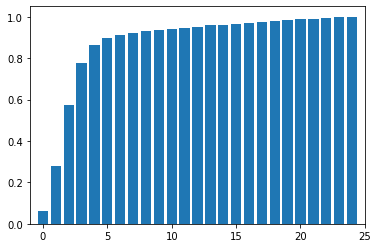

In [13]:
distace_ratio_total=np.asarray(distace_ratio/np.sum(distace_ratio))
x_axis=[]
y_axis=[]
pre=0
for i in range(len(distace_ratio_total)):
    x_axis.append(i)
    pre=pre+distace_ratio_total[i]
    y_axis.append(pre)
    
plt.bar(x_axis,y_axis)


plt.xlim(-1, 25)


plt.savefig('second.eps')

# distace error

0
145.18989100614192


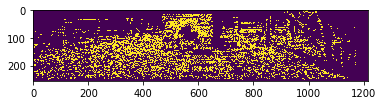

1
190.12711339354556


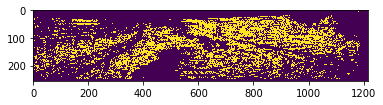

2
280.00835945325184


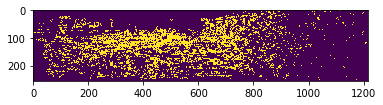

3
330.73218407964634


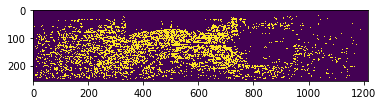

4
173.11585526562033


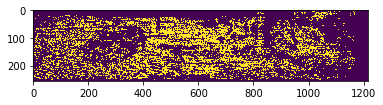

5
247.84339857840018


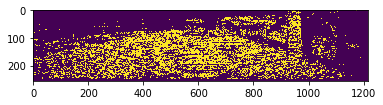

6
205.10551380636142


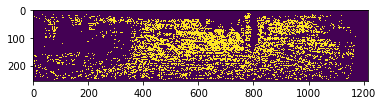

7
178.7475459527097


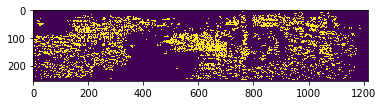

8
248.88413507684479


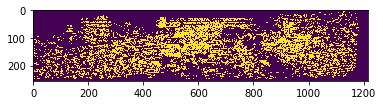

9
89.26017928196781


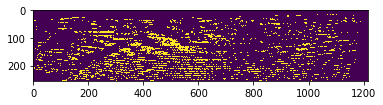

10
191.6127045257118


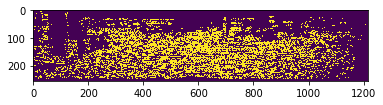

11
224.27025481781308


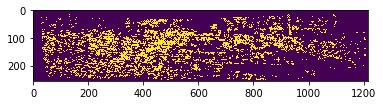

12
183.32667808191533


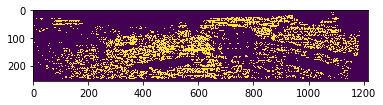

13
204.8885588425477


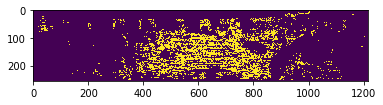

14
287.3607520622015


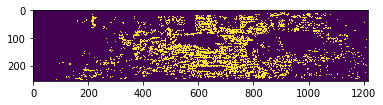

15
330.2342344072335


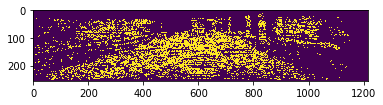

16
250.0246688618485


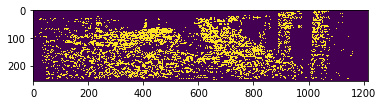

17
175.62117668912728


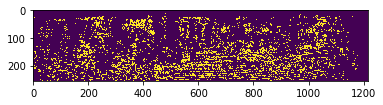

18
252.14993419266276


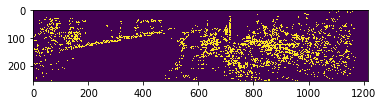

19
232.67191556820453


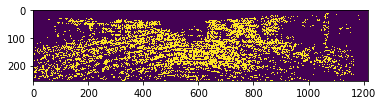

20
181.38919921470435


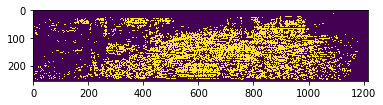

21
153.45543026221355


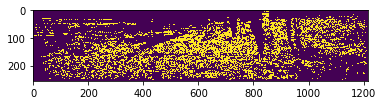

22
190.49980513329257


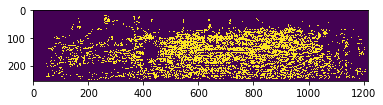

23
193.24171814684934


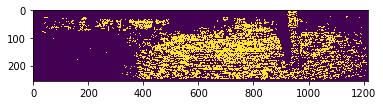

24
273.49473014231177


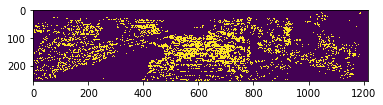

25
198.2813488393268


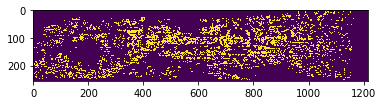

26
167.47585821158452


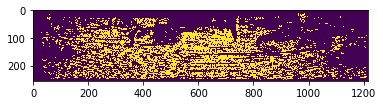

27
197.6228279158485


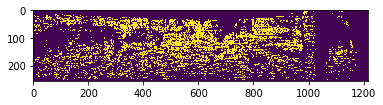

28
194.04641529016146


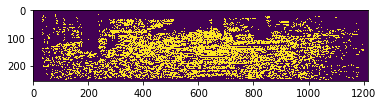

29
249.9519845063916


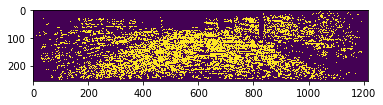

30
198.09332807617474


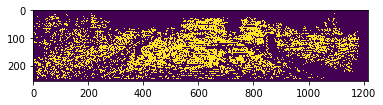

31
111.37728249437876


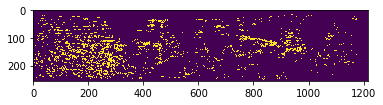

32
259.63456316834527


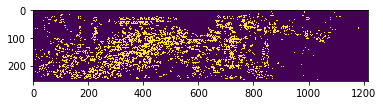

33
509.20235033252493


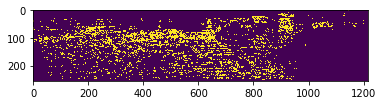

34
161.07913605179832


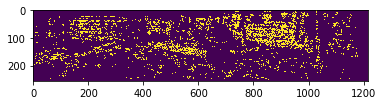

35
149.71477768521015


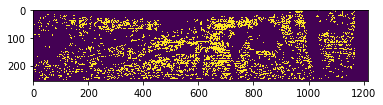

36
178.1816501034041


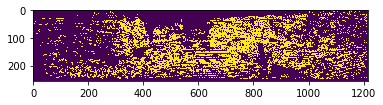

37
194.83343201448872


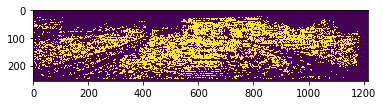

38
227.03013336222935


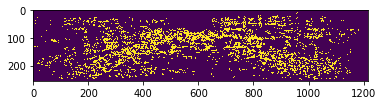

39
275.0390575577928


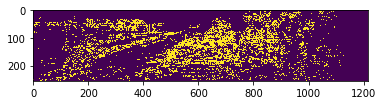

40
190.83381383686


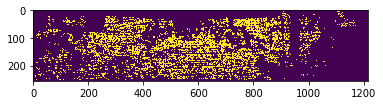

41
166.34272415867542


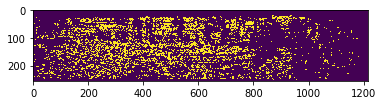

42
220.31444572856606


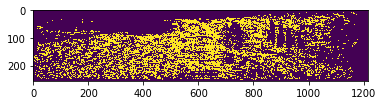

43
156.4385983711959


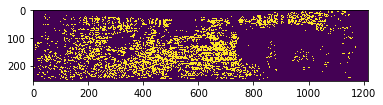

44
237.79480332316038


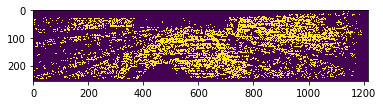

45
31.08873997995992


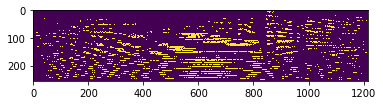

46
183.4560288092018


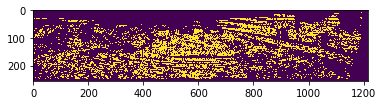

47
214.46937811886008


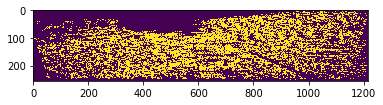

48
193.87154148804152


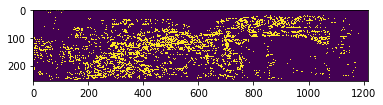

49
193.33466999837313


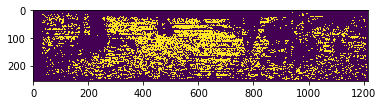

50
160.54652827859758


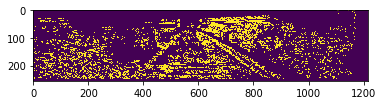

51
173.5512560746801


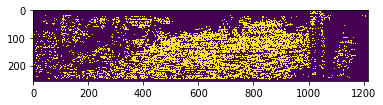

52
231.01127422039838


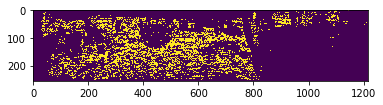

53
115.6085813810978


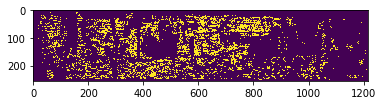

54
234.65545770697778


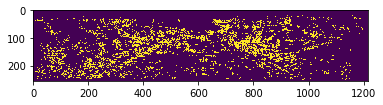

55
218.28981870902385


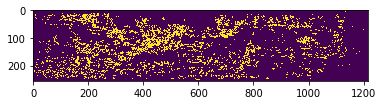

56
143.7117614815043


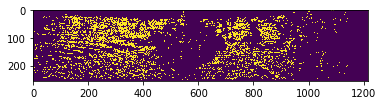

57
270.18132175973494


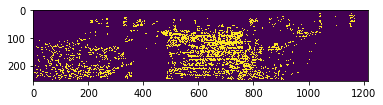

58
213.93811884044592


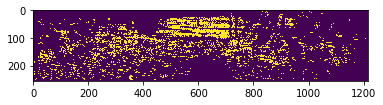

59
237.0221886000673


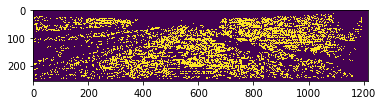

60
214.3793628020631


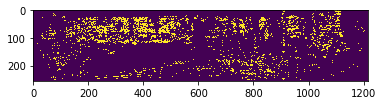

61
293.6688997049575


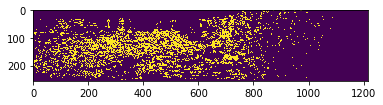

62
201.62819988408353


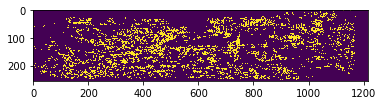

63
226.6401947208662


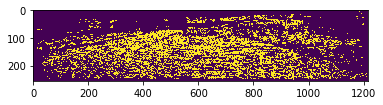

64
174.06965772552854


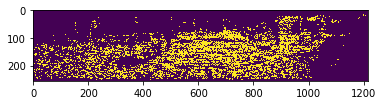

65
196.66257687788456


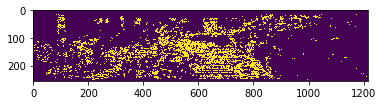

66
322.72746638273577


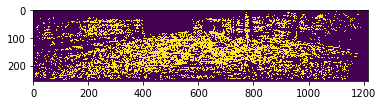

67
163.68593504019177


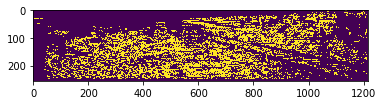

68
218.28282362426378


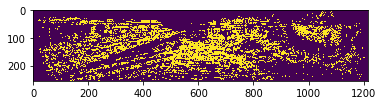

69
187.08538737448487


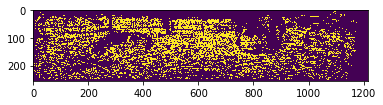

70
150.19653443828471


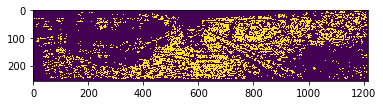

71
193.06516469757287


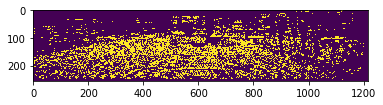

72
233.4959561517218


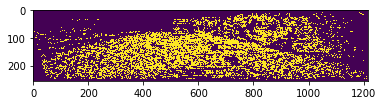

73
183.9196803217246


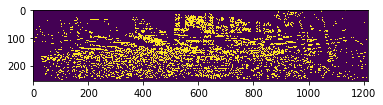

74
284.4013861377829


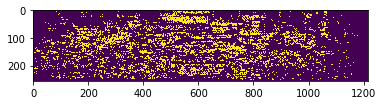

75
224.97731058559665


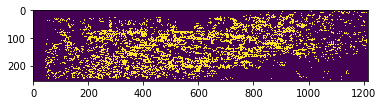

76
252.00548013330578


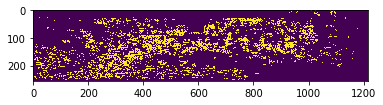

77
279.76072951531205


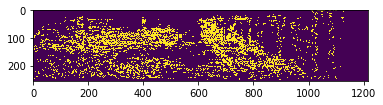

78
106.89755424285346


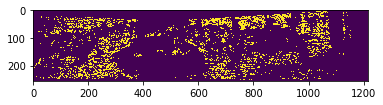

79
180.45837234155303


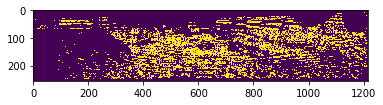

80
125.73762248476109


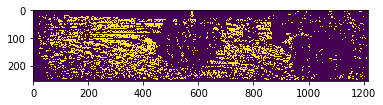

81
234.17046985321443


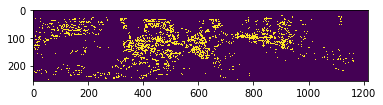

82
199.62853290114282


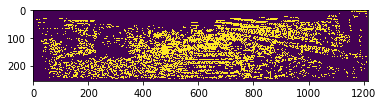

83
190.76448985042734


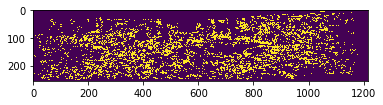

84
218.2748176661264


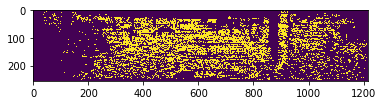

85
189.33923209734309


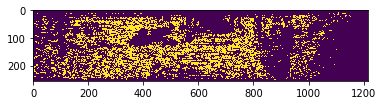

86
107.05592105263158


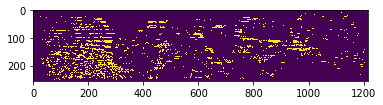

87
228.26206595020196


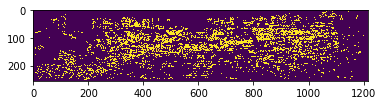

88
216.4986478971209


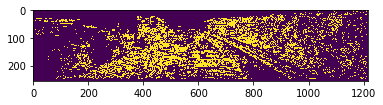

89
131.36173483981693


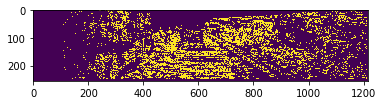

90
286.0234936111575


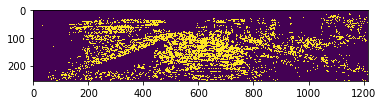

91
185.3403582663509


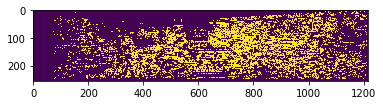

92
210.70934406617863


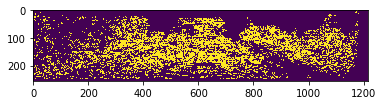

93
220.68918171738255


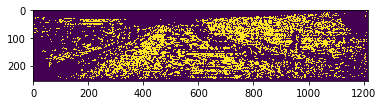

94
137.79404472788846


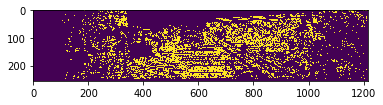

95
197.29331900401198


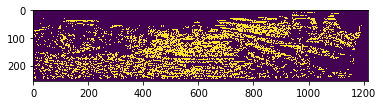

96
226.0886071293455


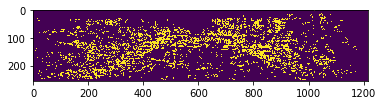

97
277.8210251452806


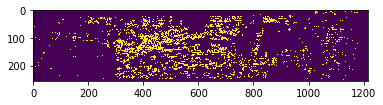

98
214.73828305104283


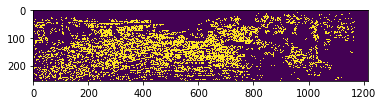

99
246.03471240621943


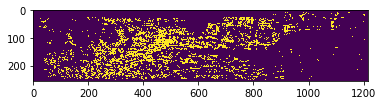

100
189.41830458550353


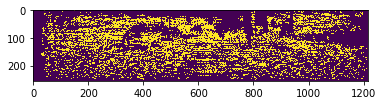

101
231.71759263252935


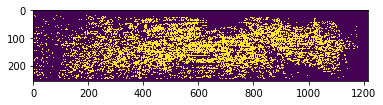

102
265.7723751483454


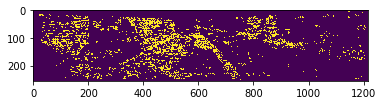

103
400.0917658000765


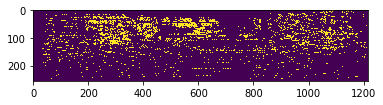

104
193.0927602816682


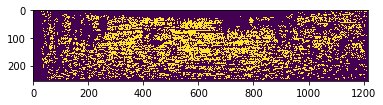

105
140.497693624576


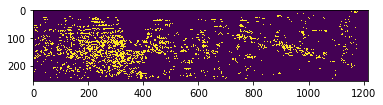

106
260.38789822768297


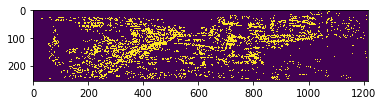

107
52.67405366469853


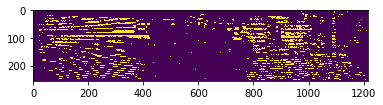

108
105.3634379215829


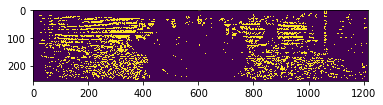

109
191.20079267523954


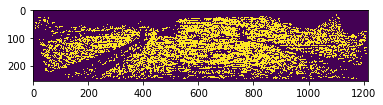

110
284.1738946123277


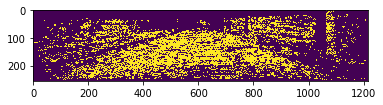

111
214.52835445325505


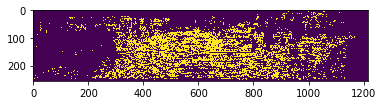

112
189.02774812490716


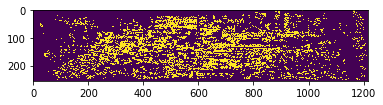

113
331.26789938190024


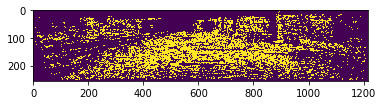

114
242.66450141249373


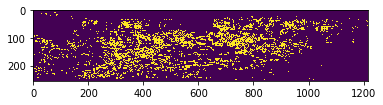

115
384.4337793978893


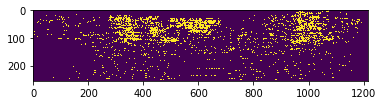

116
189.130492697664


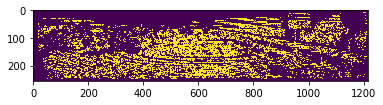

117
166.8749894475586


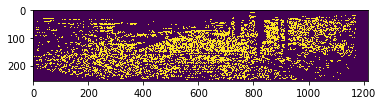

118
204.42941842265384


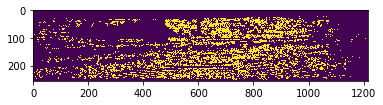

119
191.87552978346304


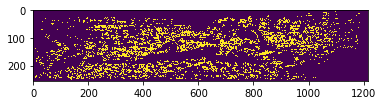

120
153.27808258270264


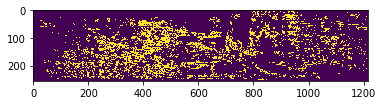

121
152.2075514826693


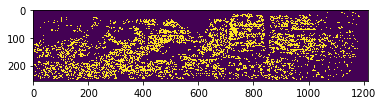

122
290.96482329842934


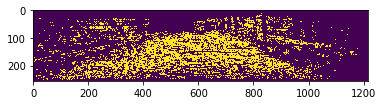

123
222.47225791467594


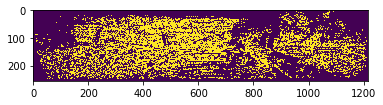

124
169.98832713597565


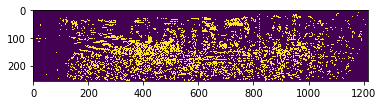

125
187.8735148869167


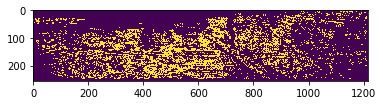

126
294.4578995547439


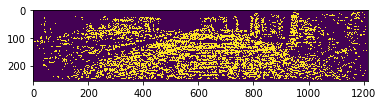

127
217.46309558952842


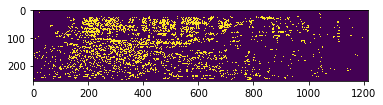

128
216.78065711338132


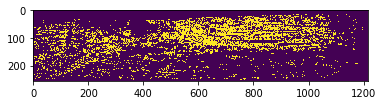

129
144.978260105882


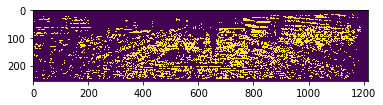

130
185.00833471722305


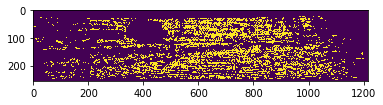

131
182.22901990201194


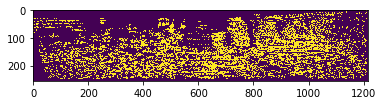

132
175.4682775888133


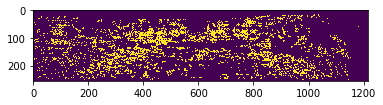

133
210.58109542943424


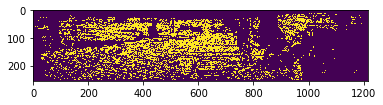

134
229.01726599767073


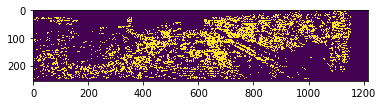

135
105.37578488627382


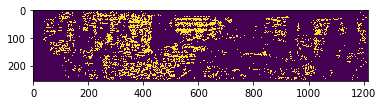

136
216.5087347334105


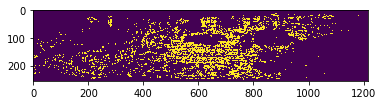

137
241.38786619388924


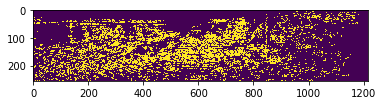

138
195.26433817076915


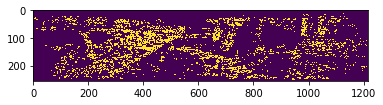

139
160.3972644793987


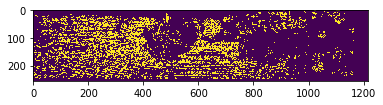

140
421.5077422840302


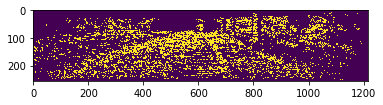

141
217.54752630386628


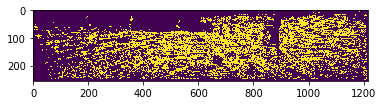

142
271.78562888570065


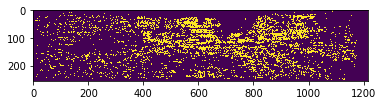

143
202.71428833654693


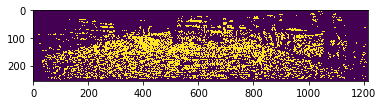

144
173.57616010355878


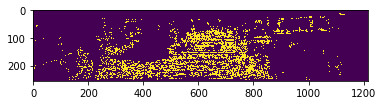

145
186.03734277592415


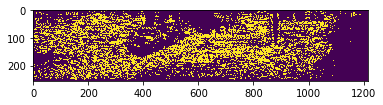

146
177.26234116927003


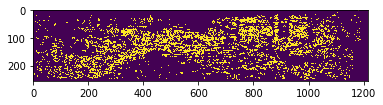

147
214.61891086676087


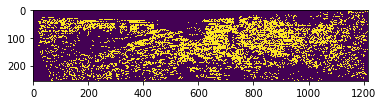

148
358.4713130395363


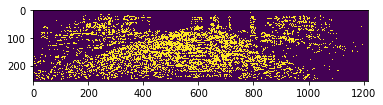

149
211.74098160639855


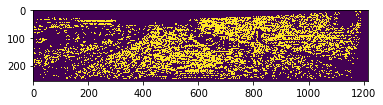

150
322.18747661978153


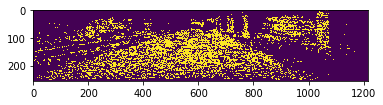

151
245.72945593476373


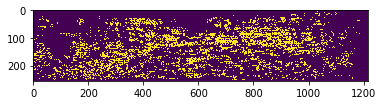

152
252.9981109371995


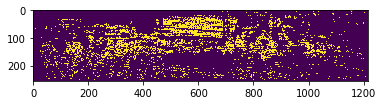

153
169.3265671812234


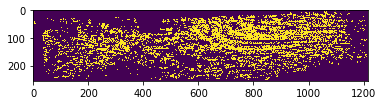

154
150.59501627524946


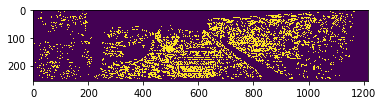

155
242.0235008781467


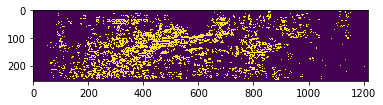

156
223.07223617116907


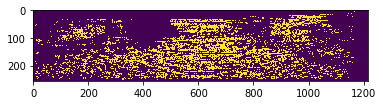

157
271.3525418031824


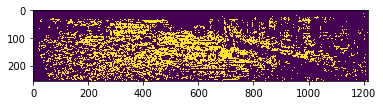

158
39.843916258778464


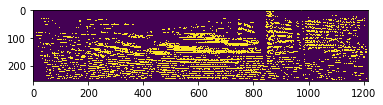

159
232.38258668016027


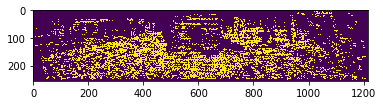

160
325.72763480392155


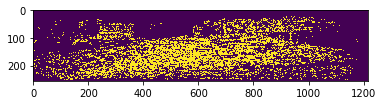

161
157.0005844837458


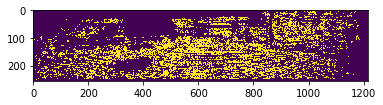

162
203.35108644744625


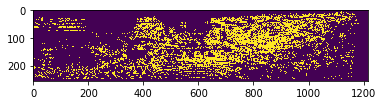

163
268.7745172744114


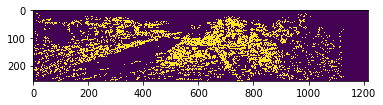

164
137.8235946745562


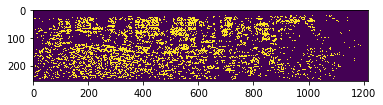

165
165.65754583413323


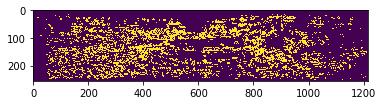

166
190.93221148751948


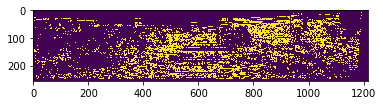

167
274.2279051789529


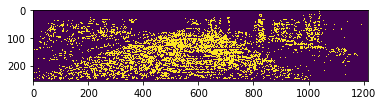

168
227.49171461422642


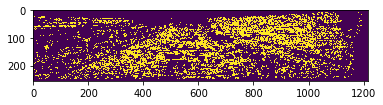

169
233.7839478767703


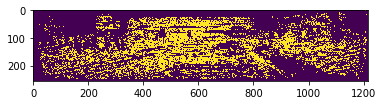

170
196.2513059078246


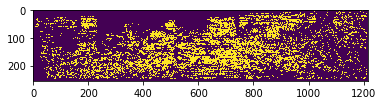

171
183.86588273150682


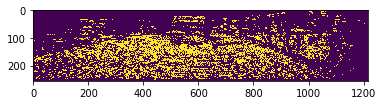

172
180.43686755642543


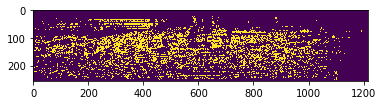

173
185.47545571491133


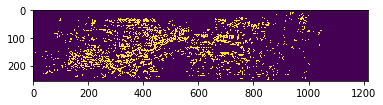

174
141.64789939413265


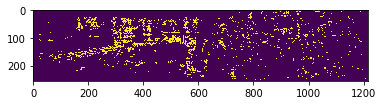

175
171.22240694933691


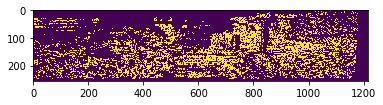

176
278.1041144527987


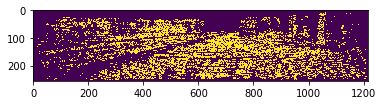

177
146.07131431367384


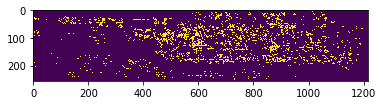

178
156.67787706205814


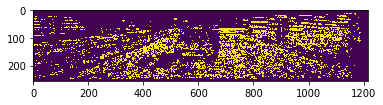

179
217.93714640573495


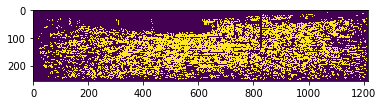

180
170.2606226720132


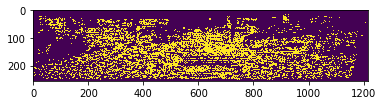

181
165.84021118590988


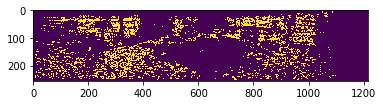

182
213.73701679188338


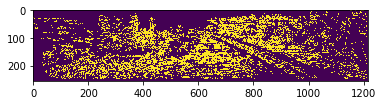

183
237.99061003071958


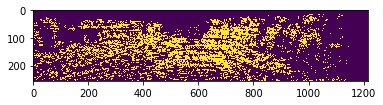

184
236.0365187407838


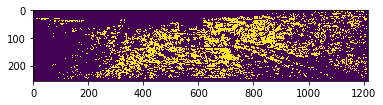

185
211.46578115164095


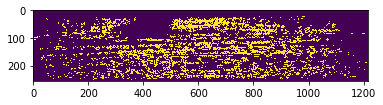

186
203.09933965881467


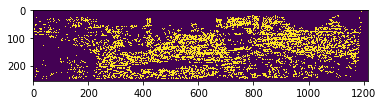

187
187.07495844038084


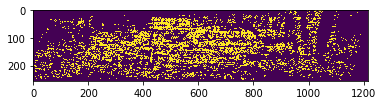

188
163.06745126503526


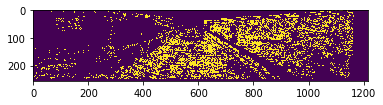

189
209.37586373033062


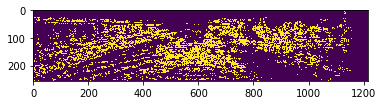

190
197.80065091971318


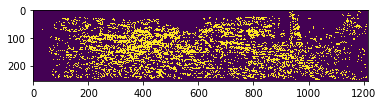

191
134.56658709814633


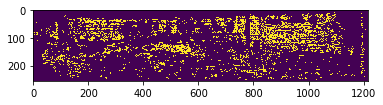

192
179.26115978700102


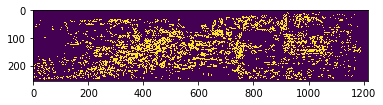

193
335.301248155746


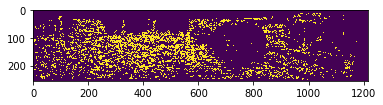

194
236.5593844516635


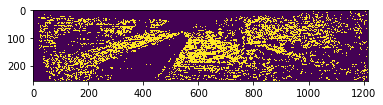

195
191.3958744979269


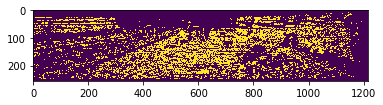

196
196.6258839183089


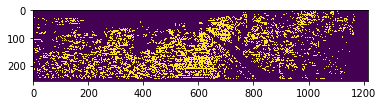

197
157.5399313950677


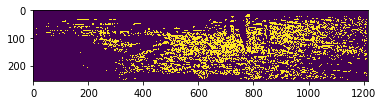

198
227.4864962200651


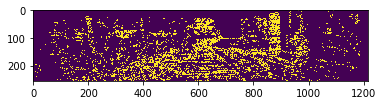

199
223.45500117153043


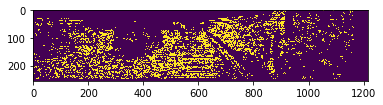

200
271.8213294163223


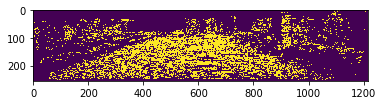

201
204.00703197621988


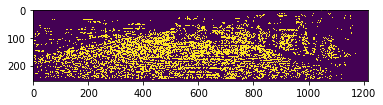

202
182.2850494853946


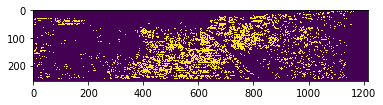

203
158.30894028042803


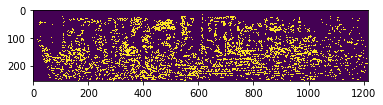

204
213.3370200959808


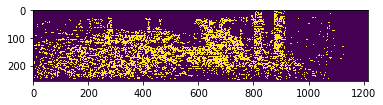

205
217.48532448063636


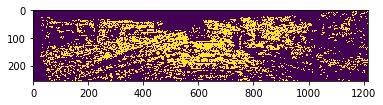

206
189.20949676645245


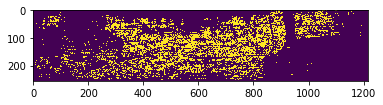

207
303.428030877491


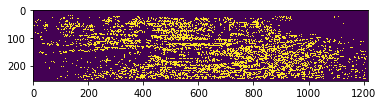

208
235.17126559914377


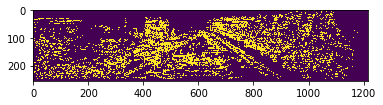

209
198.11757856810448


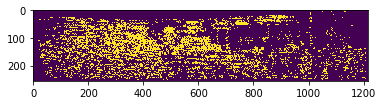

210
331.3284948482317


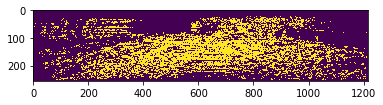

211
153.40311471954504


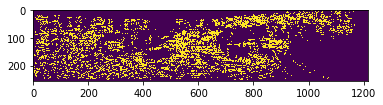

212
188.41740093698118


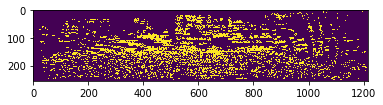

213
127.33000830176931


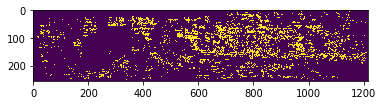

214
232.32077205882354


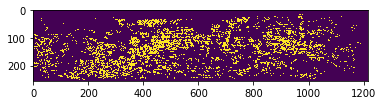

215
309.88995130007845


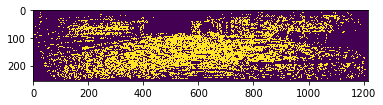

216
169.8219452072363


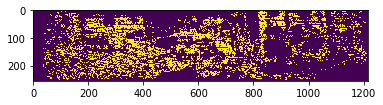

217
281.3983707463879


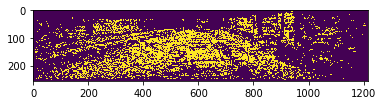

218
184.10447689330772


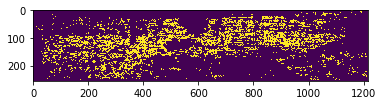

219
115.30034066516316


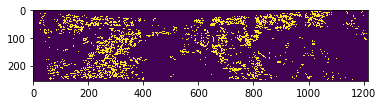

220
157.89537629464144


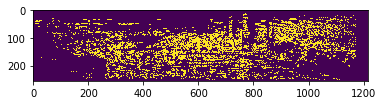

221
295.0393533084166


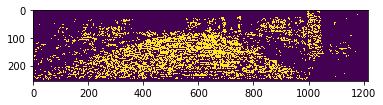

222
128.60125883142973


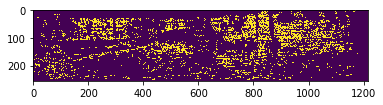

223
278.0576784286353


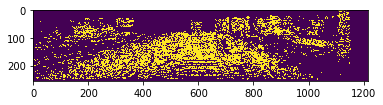

224
280.36668300153684


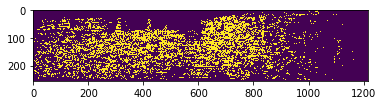

225
186.34176184829192


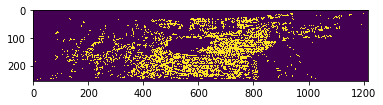

226
535.5408036990057


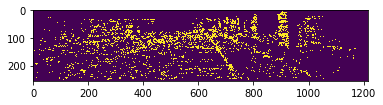

227
151.56562660672847


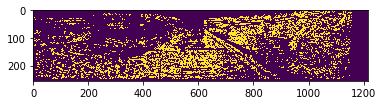

228
236.70180584259788


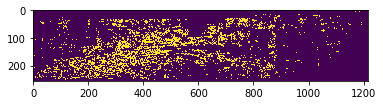

229
182.580989199521


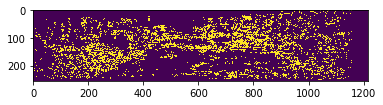

230
240.14933402255187


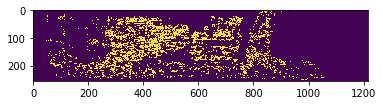

231
243.50395379933605


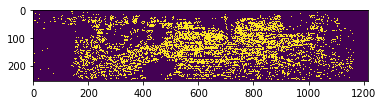

232
201.81623880126995


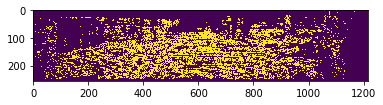

233
315.09870023989805


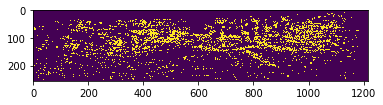

234
176.76268363512128


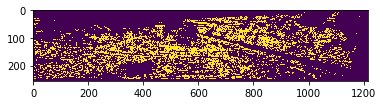

235
157.9886322023411


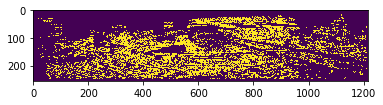

236
260.24533419163447


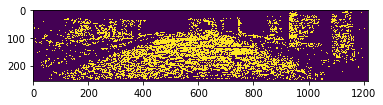

237
172.292078624375


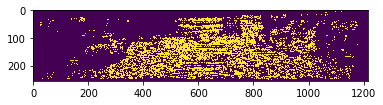

238
252.46424872530275


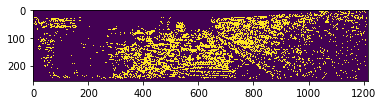

239
178.83352412562763


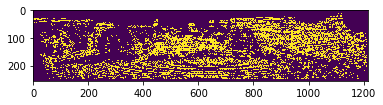

240
184.00685317132996


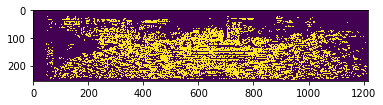

241
279.9695183554535


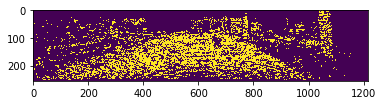

242
32.30500181712086


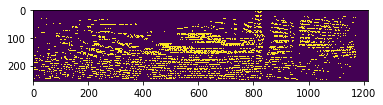

243
210.75223843698598


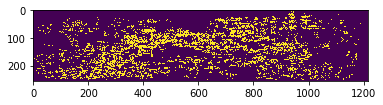

244
122.62943137703917


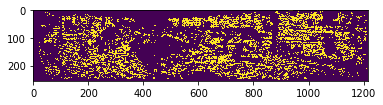

245
240.31765785402536


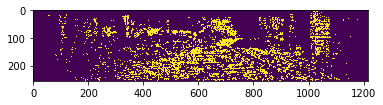

246
203.59632112721224


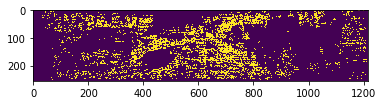

247
296.5729338891931


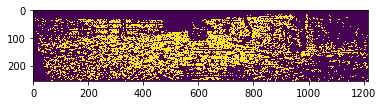

248
182.45350421943724


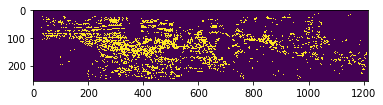

249
209.17404451093867


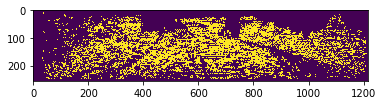

250
156.83325575386735


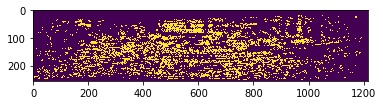

251
252.13862536890468


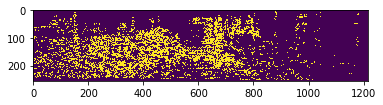

252
178.08506028666173


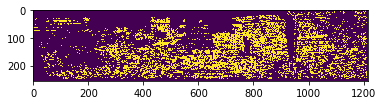

253
255.5955725602695


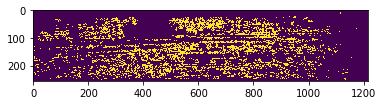

254
127.48832479413244


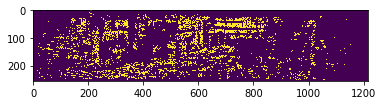

255
204.2310120368438


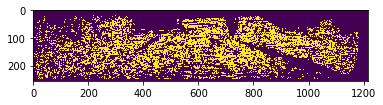

256
248.11153577482975


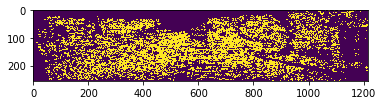

257
230.8646500417653


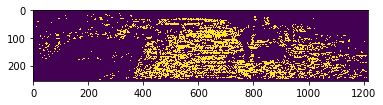

258
147.57059909689164


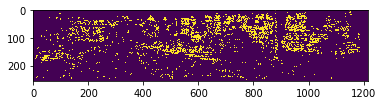

259
184.58626725740734


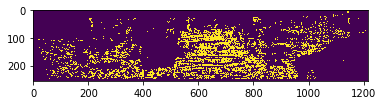

260
204.44526595129287


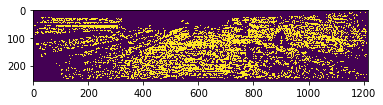

261
148.0036090531736


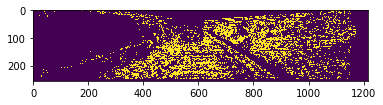

262
206.26441814028172


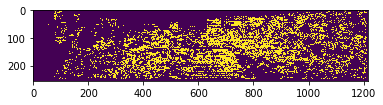

263
235.26618740219092


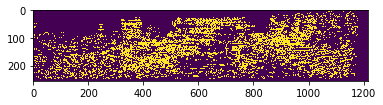

264
236.99548011342574


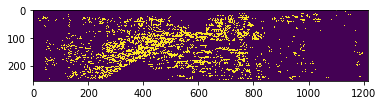

265
191.40791443340584


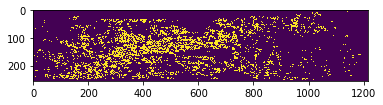

266
193.38624300240107


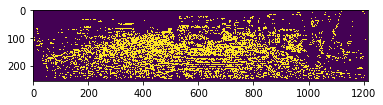

267
218.14645269257295


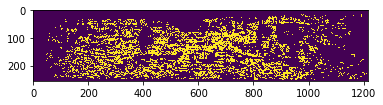

268
245.3334586630676


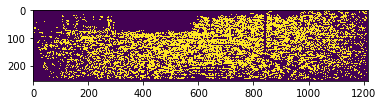

269
229.7771842818628


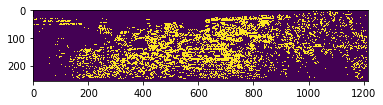

270
193.13910804611493


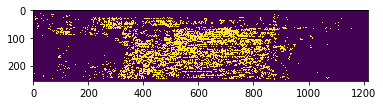

271
209.97088156377507


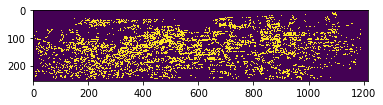

272
107.60753972368707


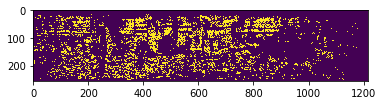

273
171.21546599319768


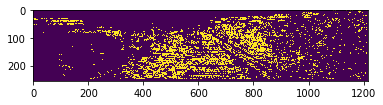

274
210.3377855314579


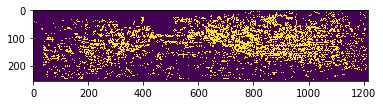

275
258.45141497757584


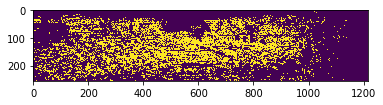

276
267.90354295919894


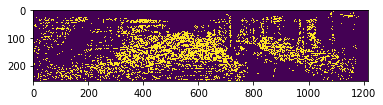

277
344.59883042830296


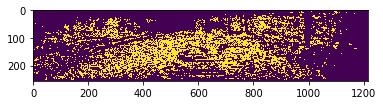

278
274.82166896506436


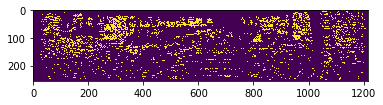

279
201.13633933699091


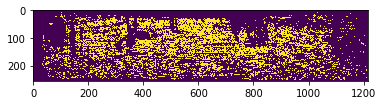

280
211.99545566077776


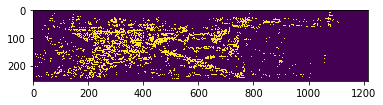

281
126.51810679372323


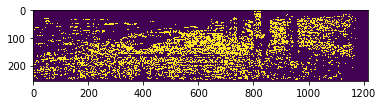

282
240.34048862483084


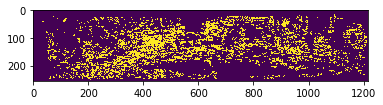

283
207.70269330613758


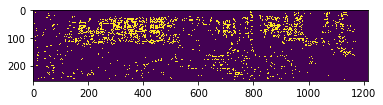

284
152.09018986232616


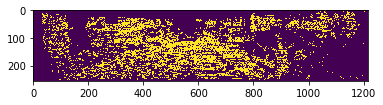

285
175.52260324271398


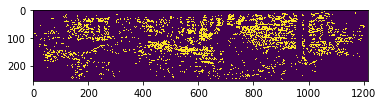

286
319.7621301089392


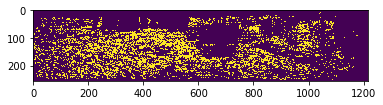

287
163.92407950968015


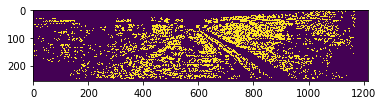

288
175.71171240885954


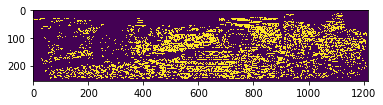

289
174.35349686464494


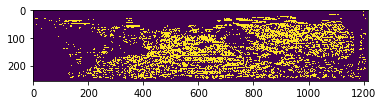

290
196.78102181014603


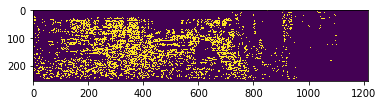

291
243.0328828878097


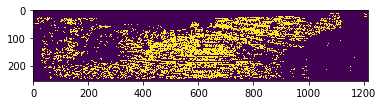

292
161.2900108495115


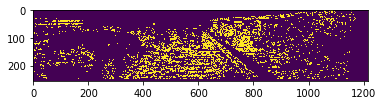

293
279.116373593445


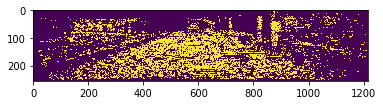

294
311.5836485277371


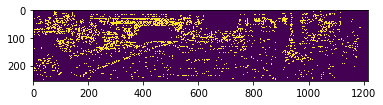

295
214.48828146688135


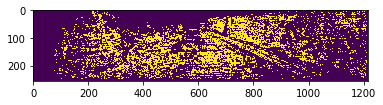

296
165.51138538078837


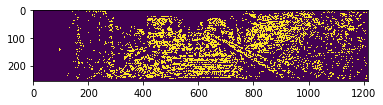

297
192.922407939386


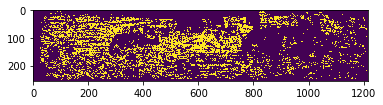

298
219.34767374877708


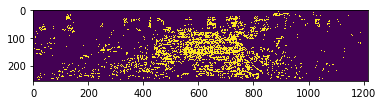

299
204.56095041322314


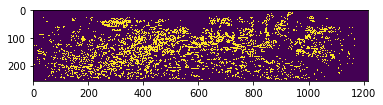

300
209.2025937919375


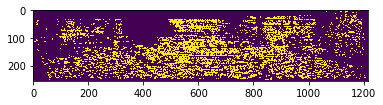

301
181.57570605787245


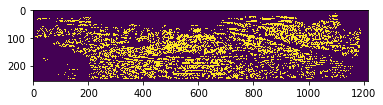

302
350.73329540033393


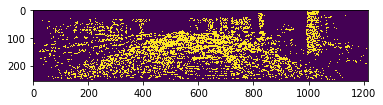

303
130.9060861013986


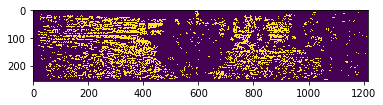

304
206.95931881096186


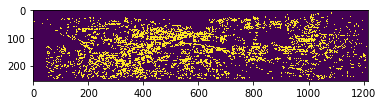

305
324.9718102327126


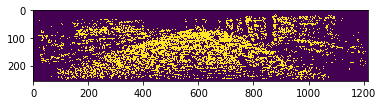

306
246.27894854393713


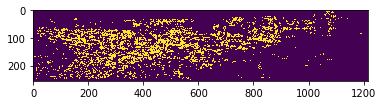

307
192.6740815623039


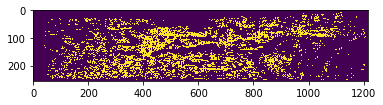

308
333.8430768993396


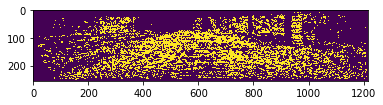

309
135.8628057588598


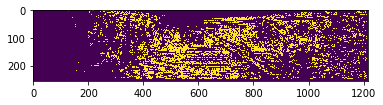

310
168.02171835550766


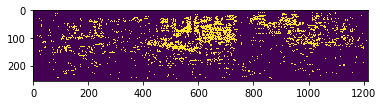

311
159.80182980332347


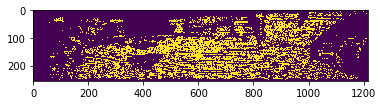

312
208.1364972924502


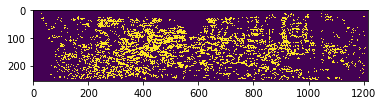

313
487.740480986619


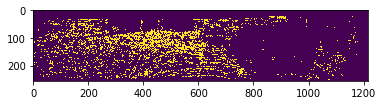

314
183.29467373400254


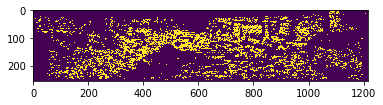

315
245.369038967895


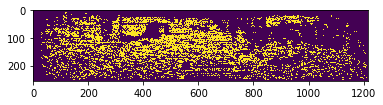

316
162.51607604032156


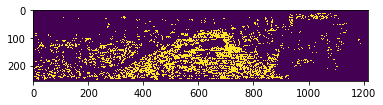

317
220.31509910867098


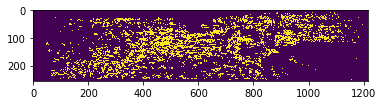

318
195.17435087163932


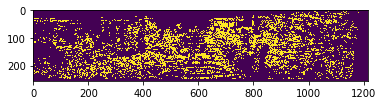

319
206.85067062608974


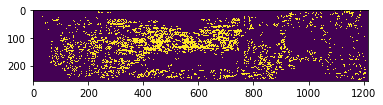

320
134.30751073046974


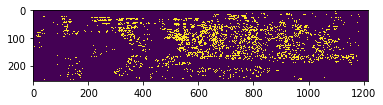

321
251.77923558441864


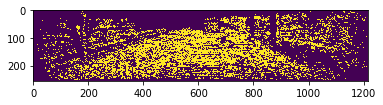

322
229.45645960365854


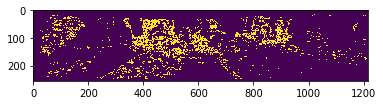

323
206.92141184383254


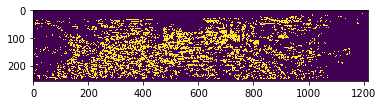

324
220.98631669473863


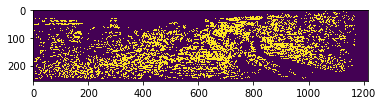

325
75.6092049828025


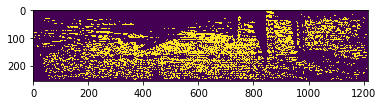

326
188.86243765665222


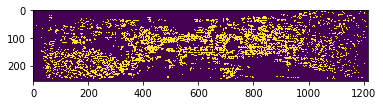

327
238.70301167898123


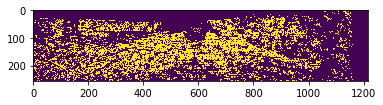

328
169.39610429716762


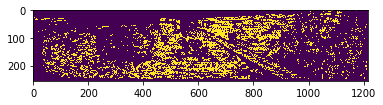

329
237.60909193222744


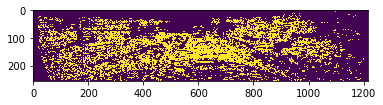

330
171.33179062486155


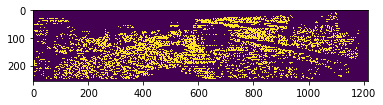

331
163.73955590194407


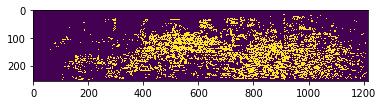

332
177.8829744205069


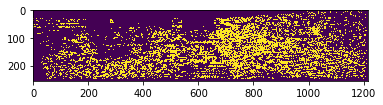

333
248.6381680744743


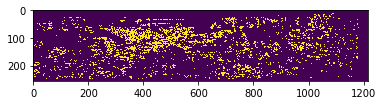

334
223.27119446852737


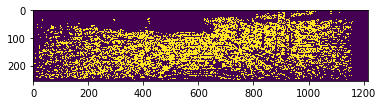

335
145.5942522138406


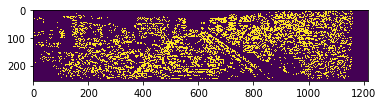

336
223.87953519947732


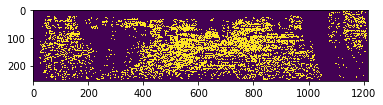

337
211.4896876561211


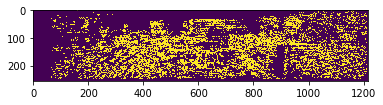

338
219.6224255256445


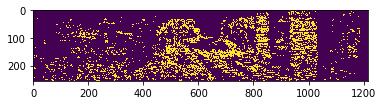

339
178.3312342775536


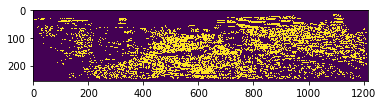

340
179.67322753340005


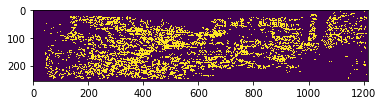

341
184.71815773284933


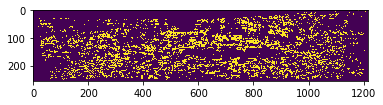

342
173.9452015935538


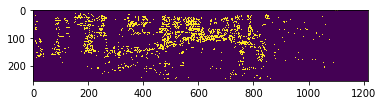

343
117.76239479930945


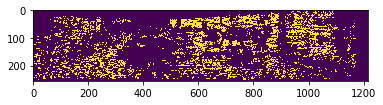

344
185.069661277639


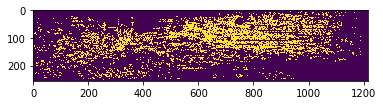

345
188.56266619647968


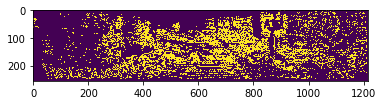

346
221.44924793272358


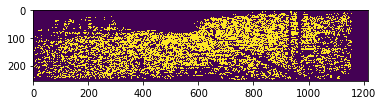

347
151.7476520185162


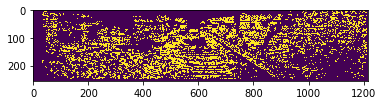

348
185.65978954822452


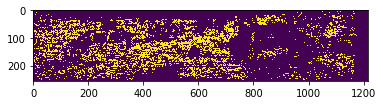

349
142.9226383191511


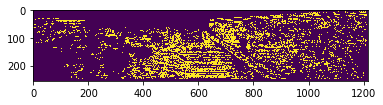

350
304.5090870925425


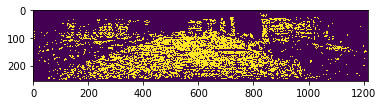

351
178.3247537678477


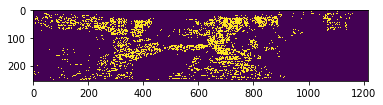

352
170.7909704571024


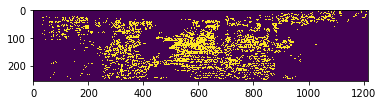

353
246.08299565153973


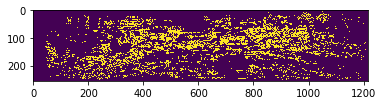

354
46.31164755654252


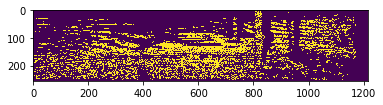

355
181.9822079924633


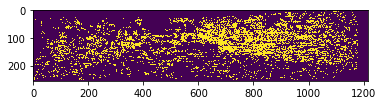

356
103.17556205088253


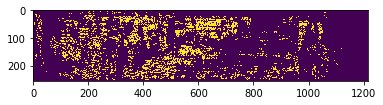

357
207.72198083778966


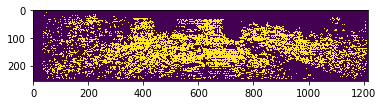

358
233.84135722277807


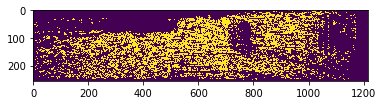

359
258.96547488899915


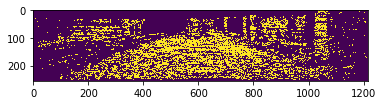

360
189.8634611574489


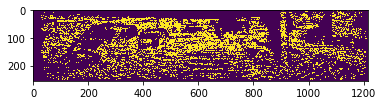

361
324.3983079864182


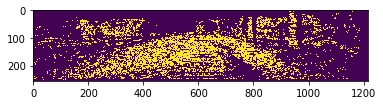

362
269.9386686854333


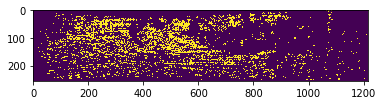

363
265.8224372633325


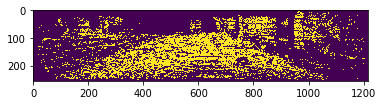

364
166.46244530724107


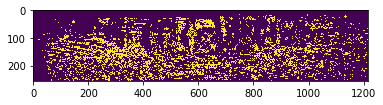

365
269.620072651033


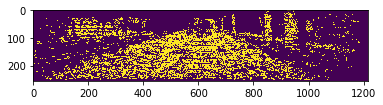

366
157.55635541180436


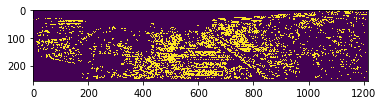

367
168.39971009921527


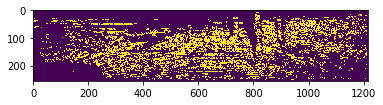

368
207.69288267493903


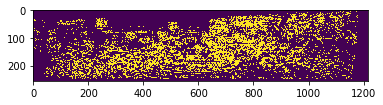

369
225.50420269679176


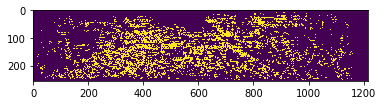

370
185.32688797871396


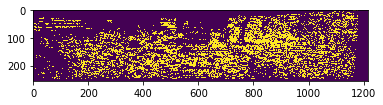

371
154.90626161879052


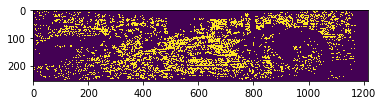

372
244.7378966862812


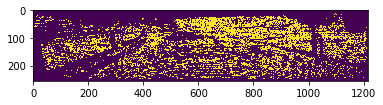

373
211.2731886481758


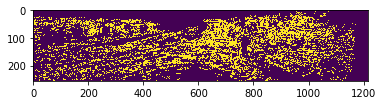

374
207.51191855359508


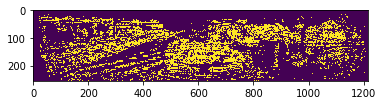

375
179.5892856493667


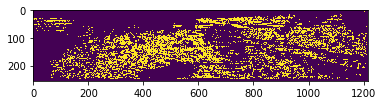

376
190.10232652628605


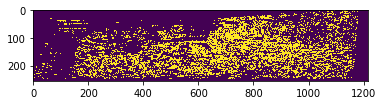

377
217.78099310928434


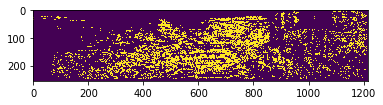

378
303.6409904838007


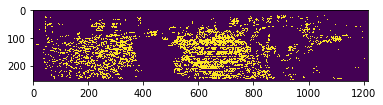

379
215.6105542082627


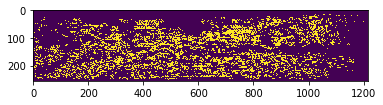

380
326.3298325524652


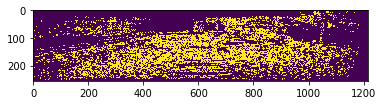

381
182.63302746009438


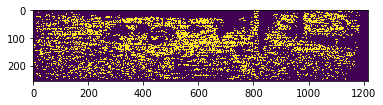

382
216.4144196937532


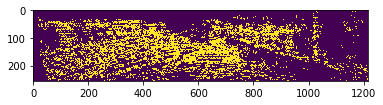

383
180.53042155077134


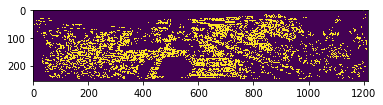

384
233.92983486777857


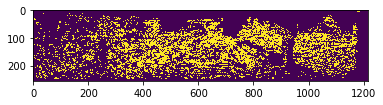

385
234.5387426143426


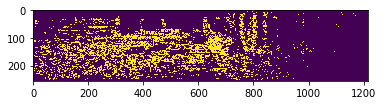

386
153.94048764184166


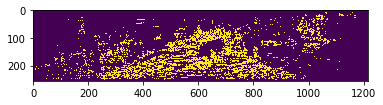

387
210.37469212854367


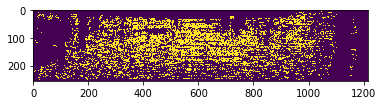

388
181.1238453553658


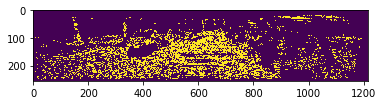

389
127.47572537242507


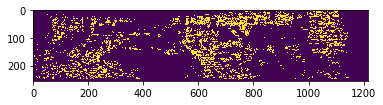

390
208.61567057144


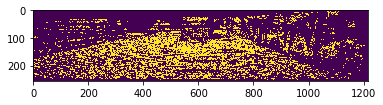

391
264.07133543339614


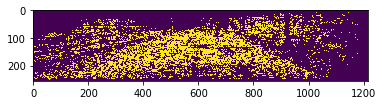

392
125.91583706912418


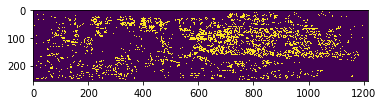

393
303.61285994807304


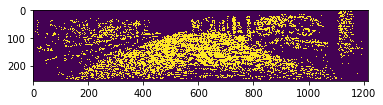

394
265.6031679922614


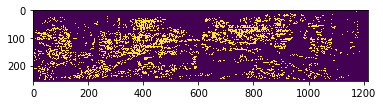

395
314.29186681909715


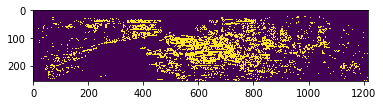

396
184.28767073068545


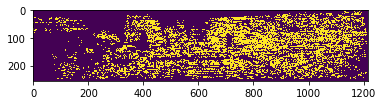

397
241.1569874440743


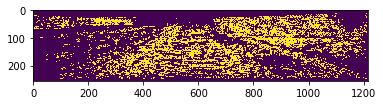

398
187.08973122124323


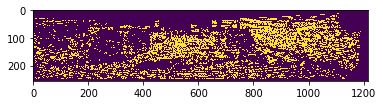

399
187.98226079753402


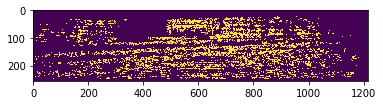

400
171.26028004534044


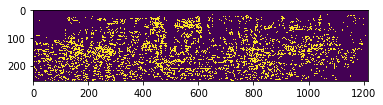

401
235.99816549976742


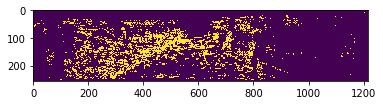

402
222.5161185500446


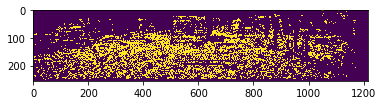

403
215.01153379430352


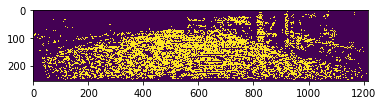

404
252.73776507579802


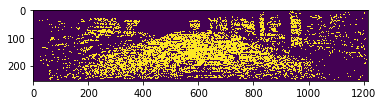

405
232.42231708352196


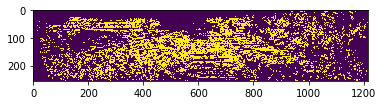

406
150.44001322170993


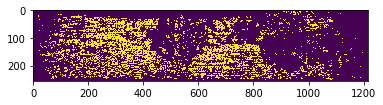

407
251.35991724128166


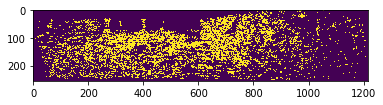

408
269.0217005508547


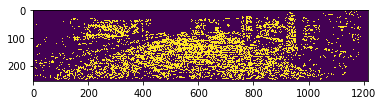

409
242.92291871250774


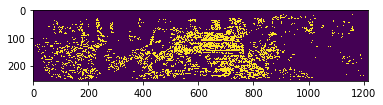

410
201.1248540511362


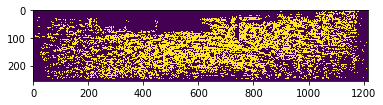

411
419.24539819684446


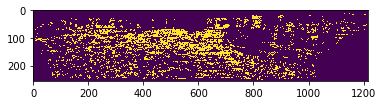

412
230.29593305680137


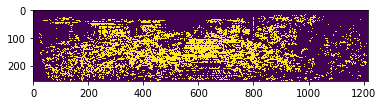

413
533.5570640496406


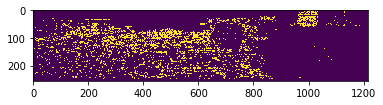

414
178.51589903405105


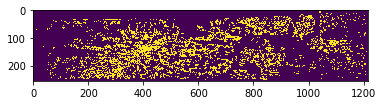

415
191.06494870138056


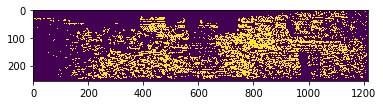

416
195.18357133029326


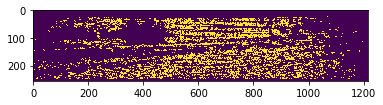

417
231.52819271761456


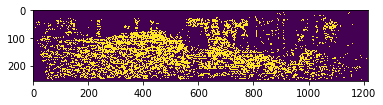

418
260.04362125300474


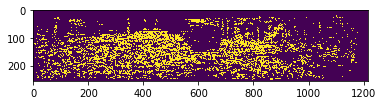

419
146.43136803851587


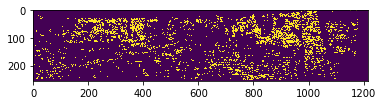

420
211.3303630235363


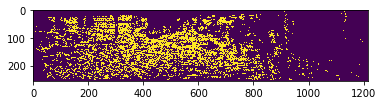

421
175.37933622598544


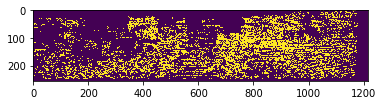

422
224.77353539929268


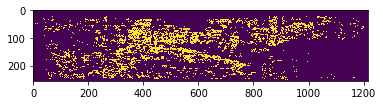

423
302.5693409452598


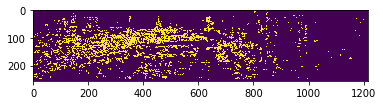

424
257.12165306967086


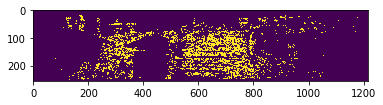

425
179.23030744122804


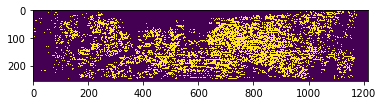

426
317.80542243215496


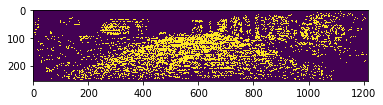

427
279.2185049863708


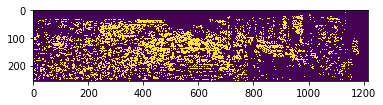

428
171.6927209565358


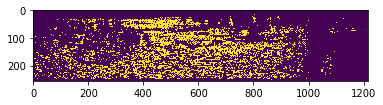

429
156.74222485381534


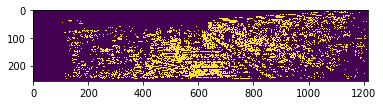

430
248.3476992674237


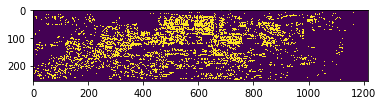

431
239.41460137762525


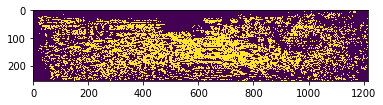

432
276.15302933162366


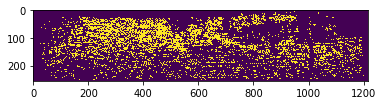

433
192.71854460365532


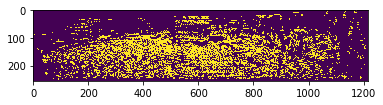

434
227.42303011811575


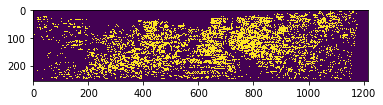

435
255.09764388617754


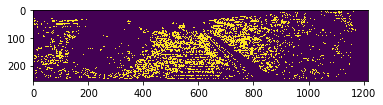

436
152.13071532956735


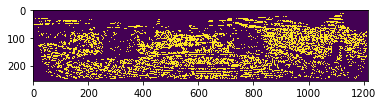

437
257.4228884404728


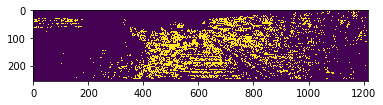

438
30.631231157939464


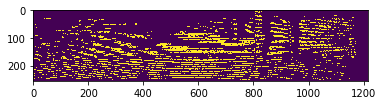

439
196.88071629260696


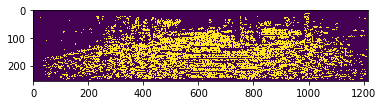

440
162.37284545981075


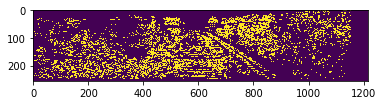

441
112.37654335850219


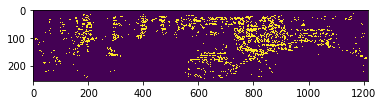

442
122.7655553305723


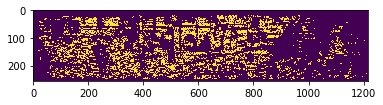

443
201.8612888952914


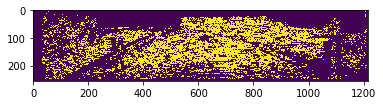

444
229.06096125416153


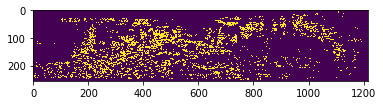

445
262.3082059865077


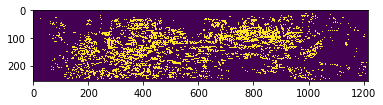

446
231.62933252610867


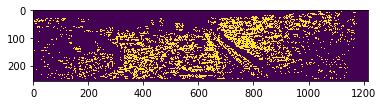

447
172.9058518231417


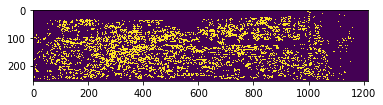

448
172.92812952744163


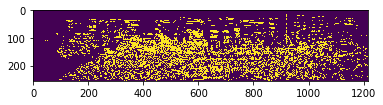

449
184.92859303240658


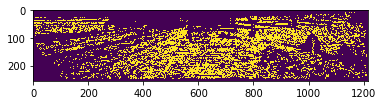

450
223.5988543425954


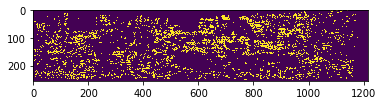

451
214.7262874657735


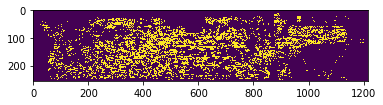

452
208.5423096707819


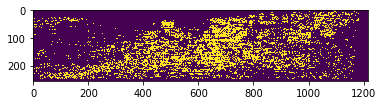

453
204.25620888827982


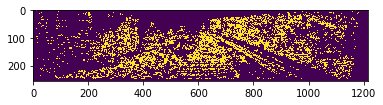

454
223.48217006482355


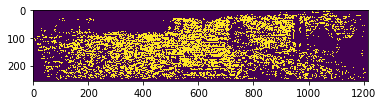

455
209.51157393999074


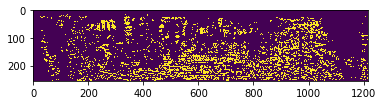

456
214.38213461182733


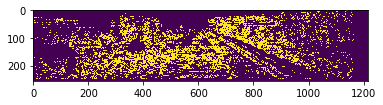

457
176.13786413028518


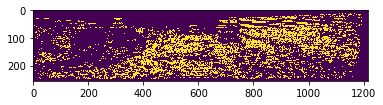

458
235.09294871794873


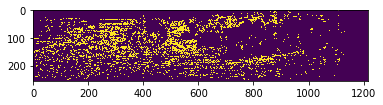

459
191.89642344990983


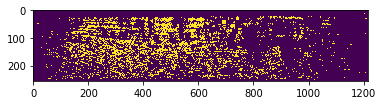

460
188.52364055238525


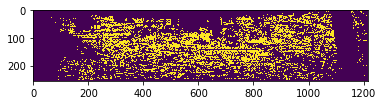

461
232.44694709342164


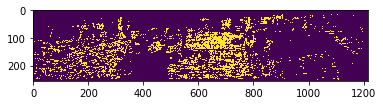

462
166.60667823795382


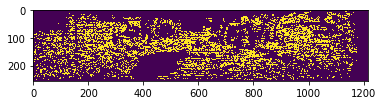

463
126.59349599629809


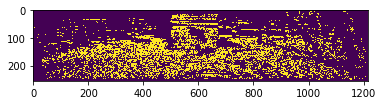

464
153.98957960397675


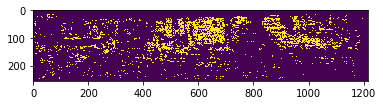

465
180.39876895971955


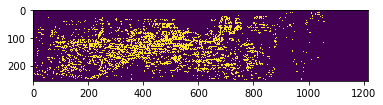

466
131.97404855267035


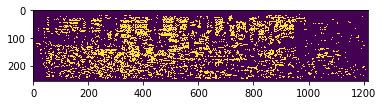

467
201.62746069889045


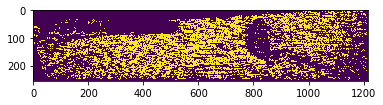

468
162.59220181482655


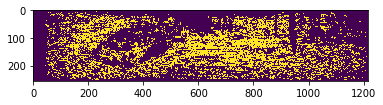

469
158.55829868112875


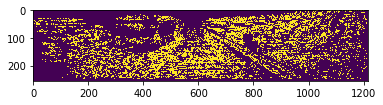

470
295.7917621045944


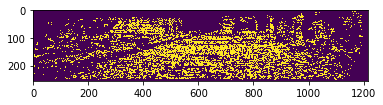

471
166.9546568627451


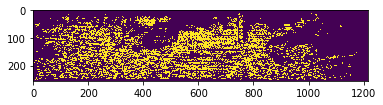

472
185.95192419942887


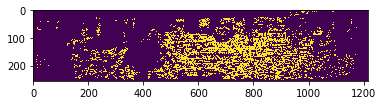

473
404.838501342817


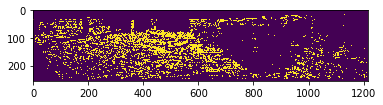

474
349.2532021852199


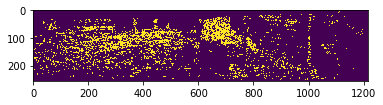

475
211.82108532866573


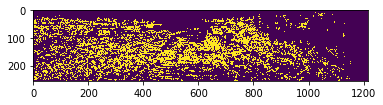

476
212.22373442971406


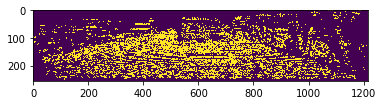

477
184.7543926213075


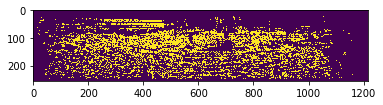

478
243.53392826256163


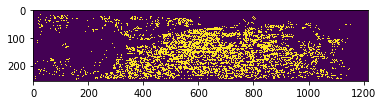

479
159.14600919387954


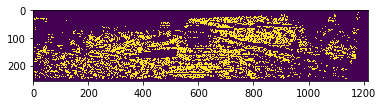

480
147.7271610456292


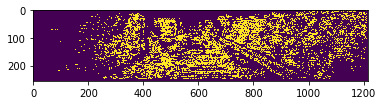

481
190.24626836941218


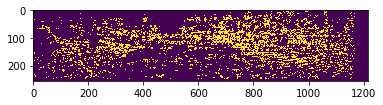

482
228.3998160326755


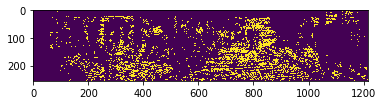

483
213.92209881333463


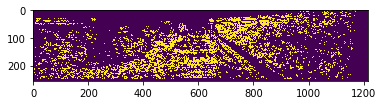

484
194.26965634295206


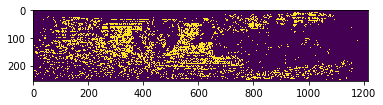

485
401.4880577803204


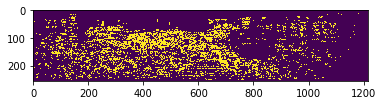

486
176.23475389485853


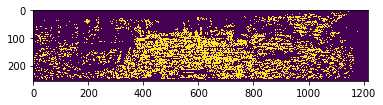

487
328.764888570102


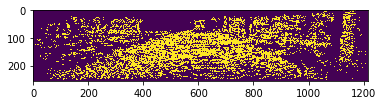

488
176.4535206725349


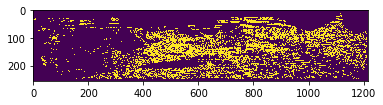

489
219.20076865317736


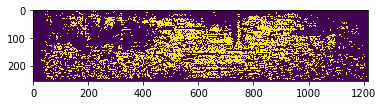

490
325.14165816046915


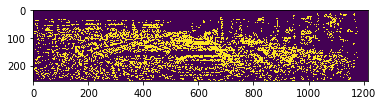

491
176.7073274227485


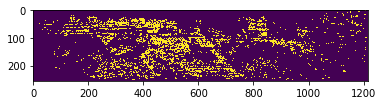

492
209.82840063336107


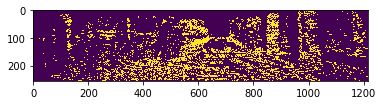

493
100.72343674250294


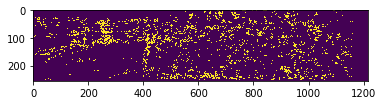

494
177.11328865893117


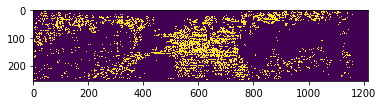

495
198.37920122267988


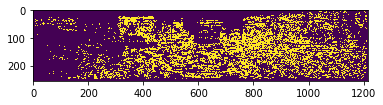

496
185.95961224092346


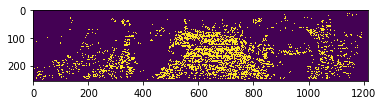

497
241.13524268002692


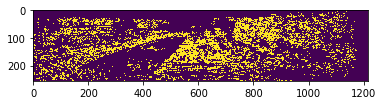

498
335.3741966051417


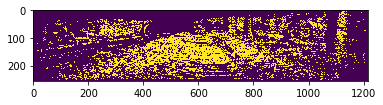

499
256.05160107093434


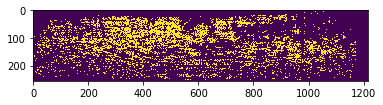

500
189.18882730177313


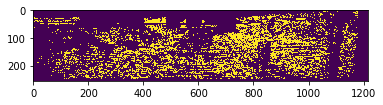

501
181.1025613293974


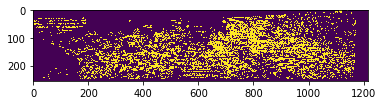

502
171.74578430940525


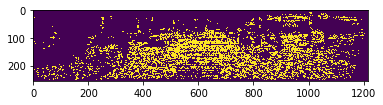

503
246.97262130355574


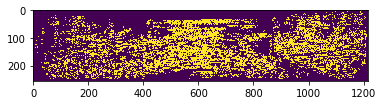

504
194.1173929724524


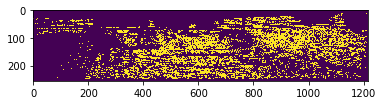

505
194.72537023752813


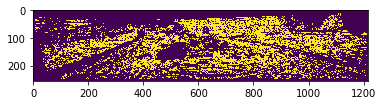

506
147.6493098430719


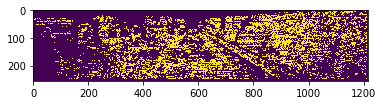

507
123.61615426614996


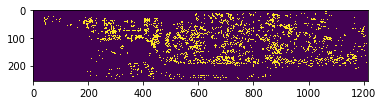

508
197.62359877641097


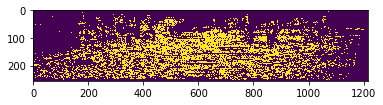

509
222.6958082973265


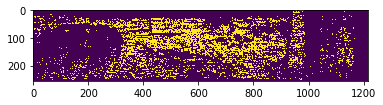

510
223.35334171139777


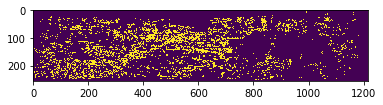

511
246.00981272721066


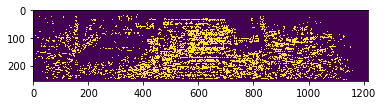

512
183.16698807086775


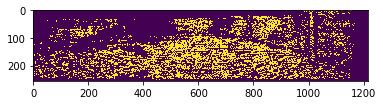

513
245.537111977085


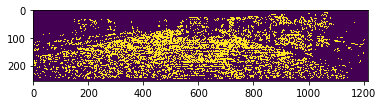

514
214.36771428028985


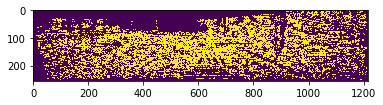

515
223.03229548910707


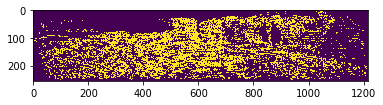

516
201.0388514825342


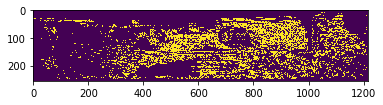

517
199.86648751717163


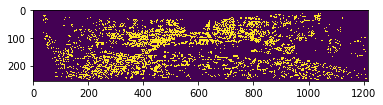

518
149.08115385807145


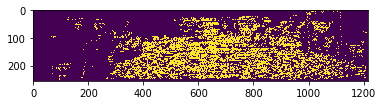

519
344.33391450407663


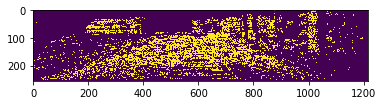

520
217.40271943400398


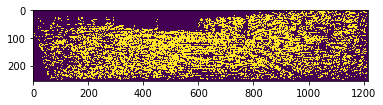

521
219.9349110854636


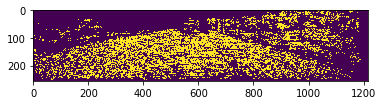

522
226.75355520247913


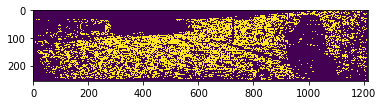

523
186.7125307108832


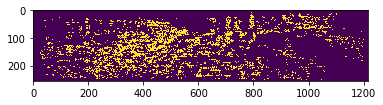

524
217.10839018153683


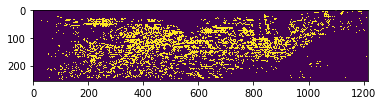

525
116.23688352250528


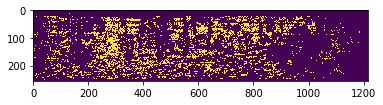

526
219.37224101216214


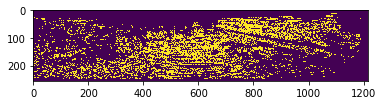

527
180.26426174496643


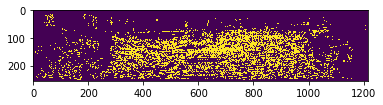

528
220.11879191634588


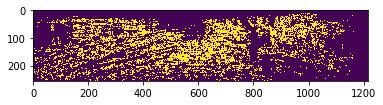

529
243.2309382644116


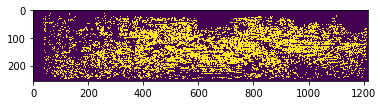

530
148.53281543968748


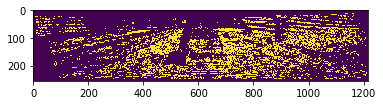

531
224.92541516257828


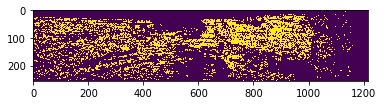

532
242.69293661958963


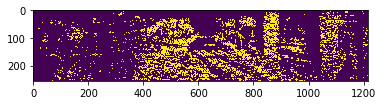

533
217.3788722924281


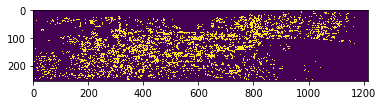

534
169.7399242585005


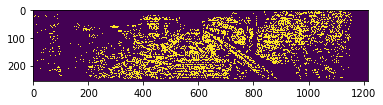

535
178.8090868995209


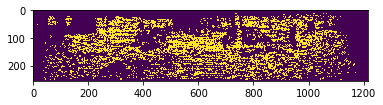

536
190.5205277276271


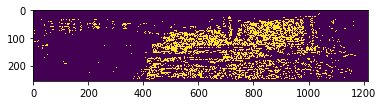

537
156.13185015041873


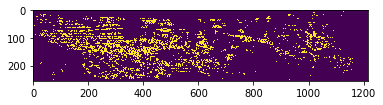

538
170.76873285322358


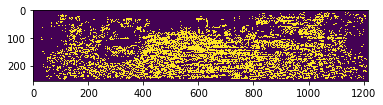

539
152.91991049207698


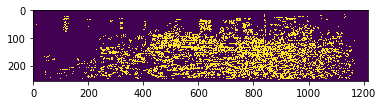

540
188.38541918313445


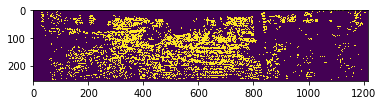

541
145.79439568434725


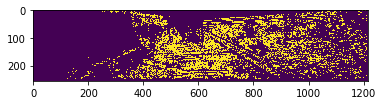

542
220.6019687279605


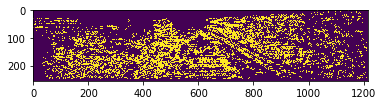

543
153.50312472195859


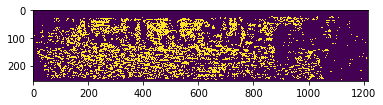

544
120.4628376769729


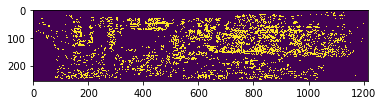

545
203.0902909112473


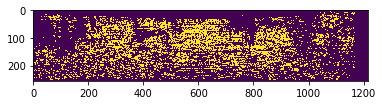

546
242.172679137646


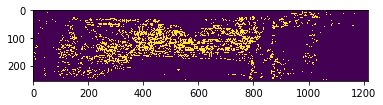

547
236.6673366648693


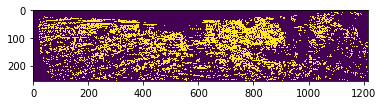

548
244.62072670223185


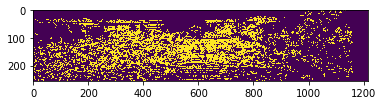

549
202.9592175066313


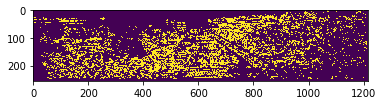

550
208.16169994967518


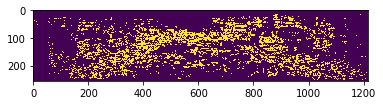

551
138.9304770356736


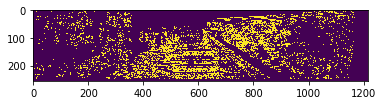

552
247.94018200733848


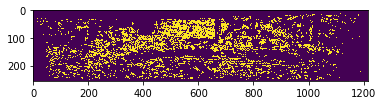

553
349.31943490743544


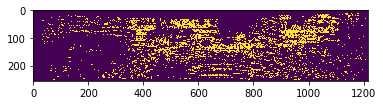

554
137.7434863523573


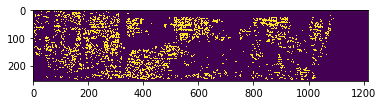

555
325.18886428959837


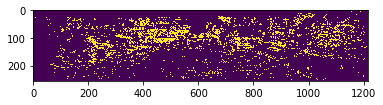

556
225.66263989299563


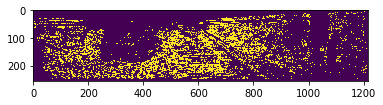

557
186.18366920254667


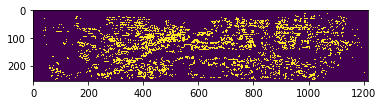

558
179.01461242391693


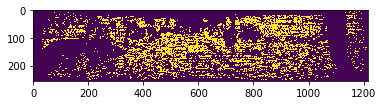

559
128.80951529057634


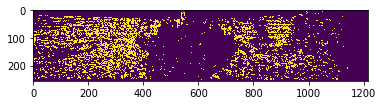

560
278.42556083684417


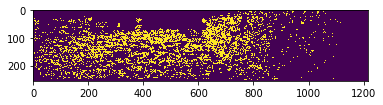

561
238.8845899843947


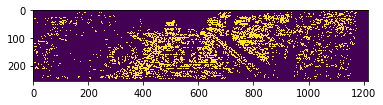

562
245.97057603384056


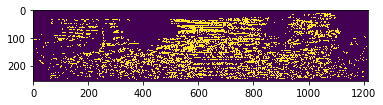

563
269.16316137083663


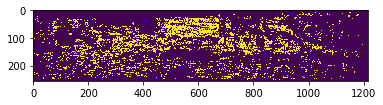

564
215.4276401275587


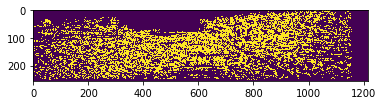

565
175.07224155216136


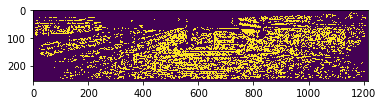

566
175.1463550713289


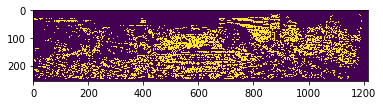

567
144.45888518643497


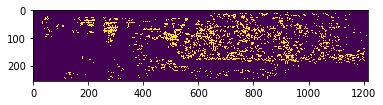

568
172.62245709206158


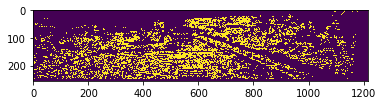

569
29.713372846206337


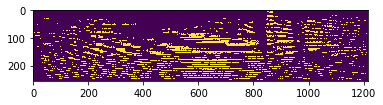

570
242.43236940298507


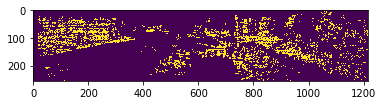

571
168.4961782294603


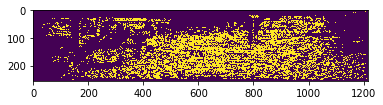

572
234.44815604360807


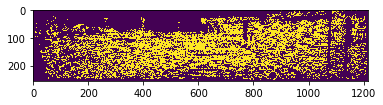

573
186.73778088118883


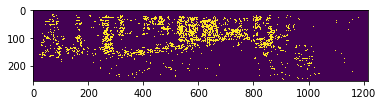

574
205.0174241801227


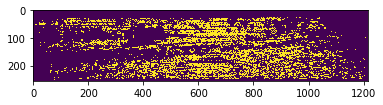

575
219.27270491101984


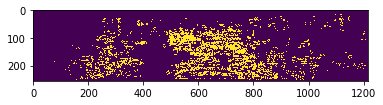

576
101.44636798555005


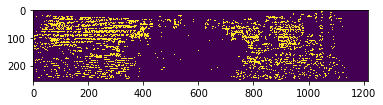

577
180.15325334720464


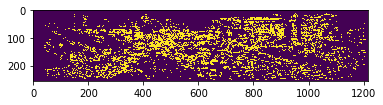

578
214.33158861370634


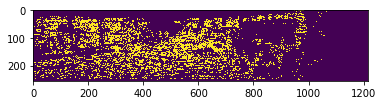

579
270.40587320710074


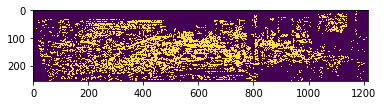

580
214.96375964982377


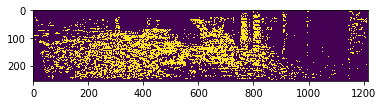

581
272.8536119637376


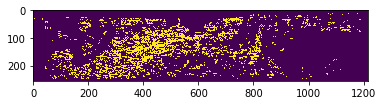

582
192.52506444905518


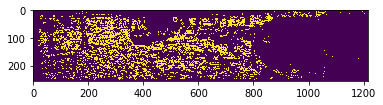

583
297.39973772929056


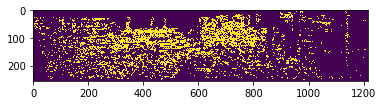

584
231.2506461527858


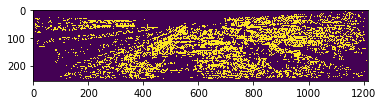

585
159.3502552729966


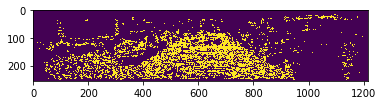

586
128.8791054451167


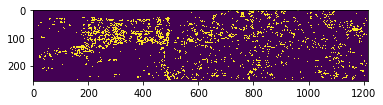

587
180.78142168778976


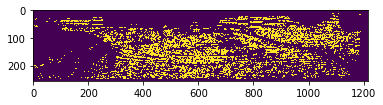

588
157.1688153619741


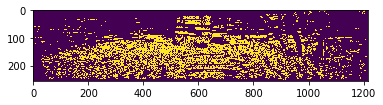

589
198.04663900449756


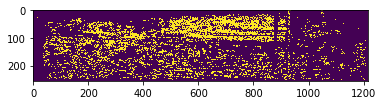

590
396.76389385713884


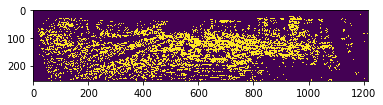

591
365.4220875985504


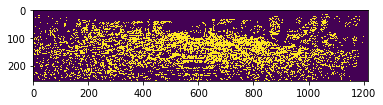

592
182.5793490950139


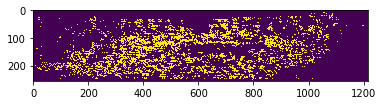

593
217.76678827802613


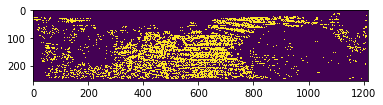

594
191.5429014732027


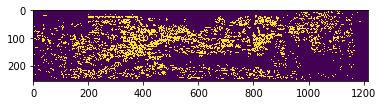

595
304.2132143492968


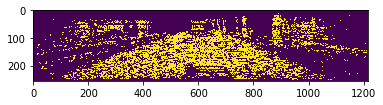

596
218.28885650927077


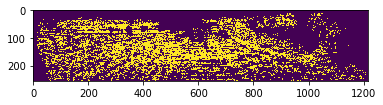

597
198.09238713847702


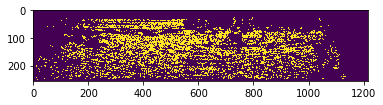

598
225.79795787244254


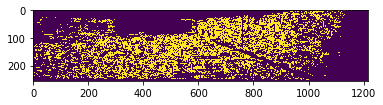

599
206.1285473976906


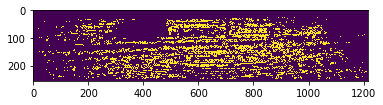

600
231.0098017347297


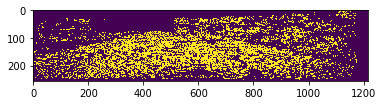

601
241.7808217238004


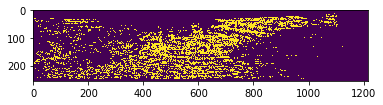

602
190.10063425655747


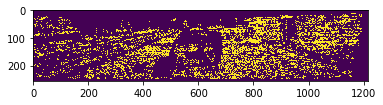

603
206.08517511780875


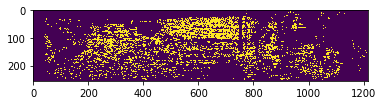

604
166.41857786925414


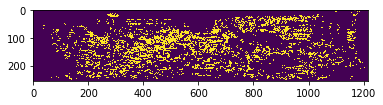

605
176.51436431126444


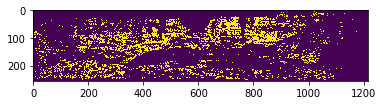

606
175.02512878218653


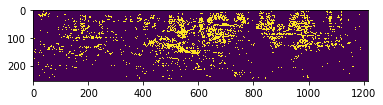

607
160.38832454876066


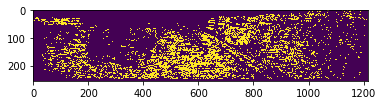

608
172.22800351563507


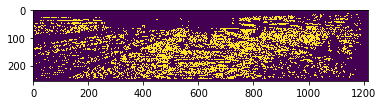

609
203.94146198994576


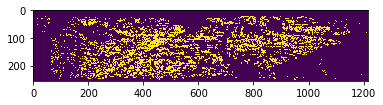

610
288.6670996843485


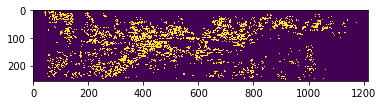

611
205.2386244499317


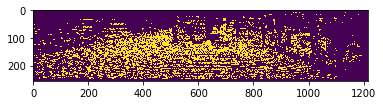

612
187.45666608491464


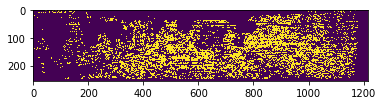

613
250.9151946618947


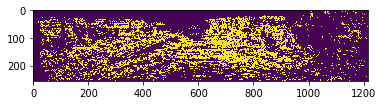

614
327.1441999154981


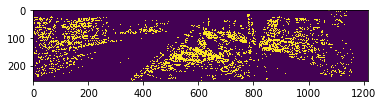

615
365.31187742208397


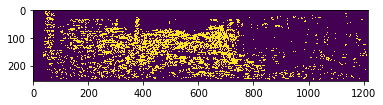

616
180.874149090286


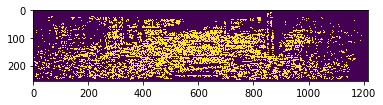

617
165.18592834472656


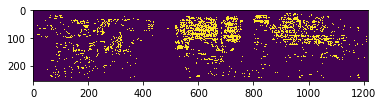

618
201.41017028249544


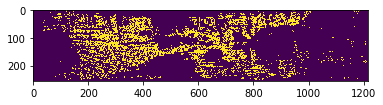

619
154.8303848343982


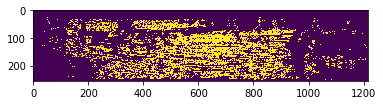

620
97.93754070513444


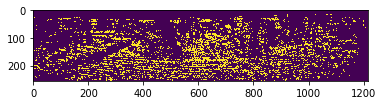

621
201.75673998668427


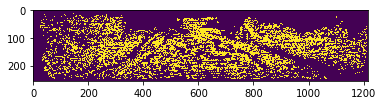

622
154.0885649896811


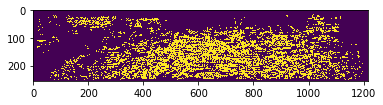

623
242.181002296232


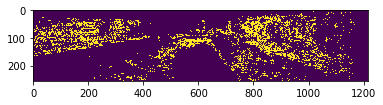

624
199.10556799934633


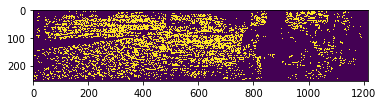

625
170.17887515107802


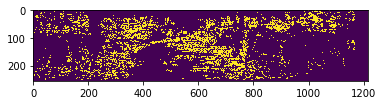

626
159.3938759564986


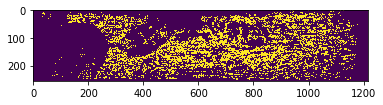

627
185.92730858751253


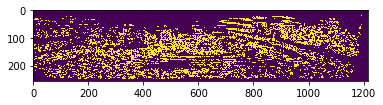

628
166.82383620313544


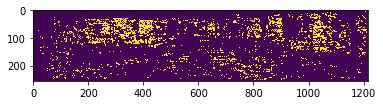

629
194.06900448781633


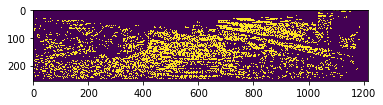

630
192.1724951543985


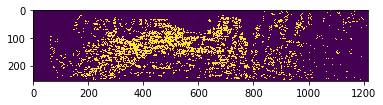

631
186.5261717101983


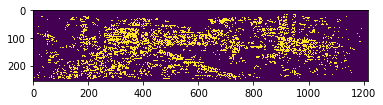

632
233.31407495794016


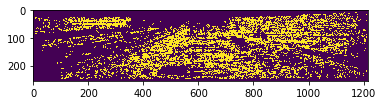

633
205.68316365333425


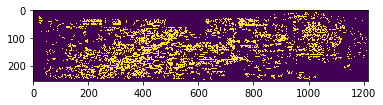

634
211.98705795441805


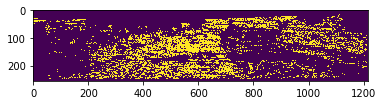

635
234.56847173067146


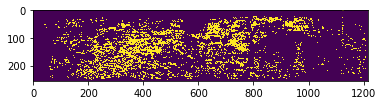

636
183.6886577891381


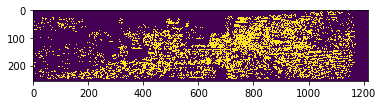

637
222.9696776333543


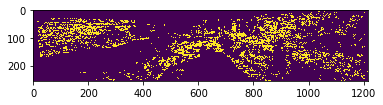

638
184.23614081526085


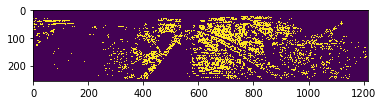

639
233.38702956248622


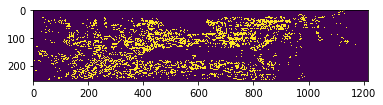

640
203.95293286473677


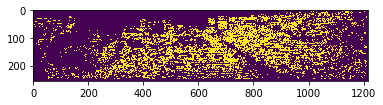

641
305.7119441277081


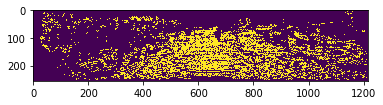

642
241.3359014238071


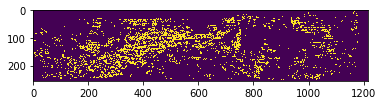

643
230.32874703272756


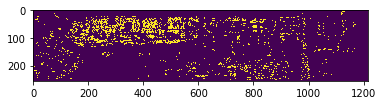

644
210.17544070475245


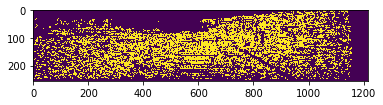

645
184.96964899803493


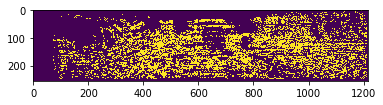

646
203.4108661637466


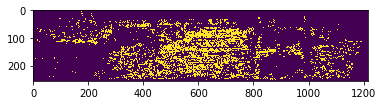

647
242.85975617759266


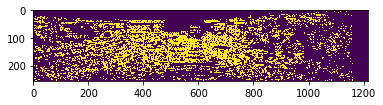

648
130.9943068151507


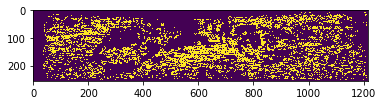

649
316.090681610263


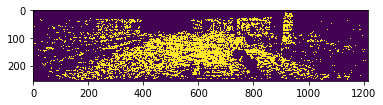

650
289.8619973776224


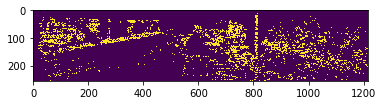

651
162.9477143124577


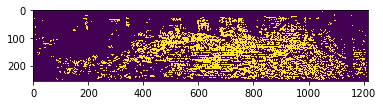

652
358.24203671709625


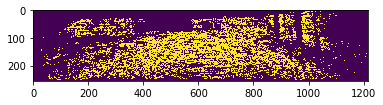

653
198.42473802527442


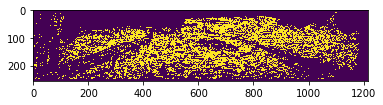

654
196.88644149550316


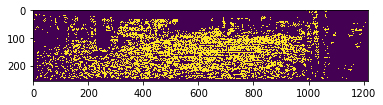

655
259.611697350501


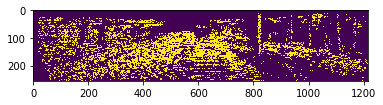

656
190.7473512103726


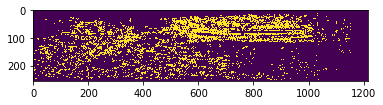

657
354.99927016021684


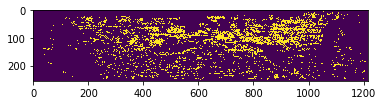

658
240.72997581084763


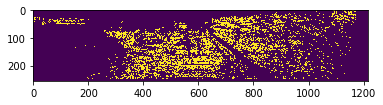

659
181.16116792600312


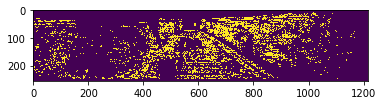

660
189.70238805833088


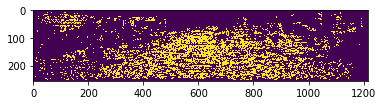

661
210.12665573502946


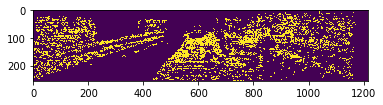

662
177.69506091409949


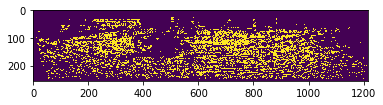

663
157.67491296703076


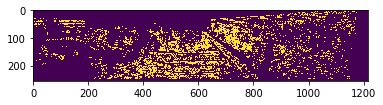

664
181.9317041348856


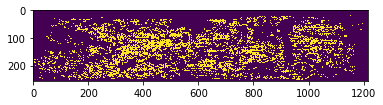

665
340.2965607629363


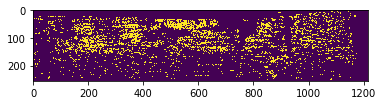

666
205.07491161382754


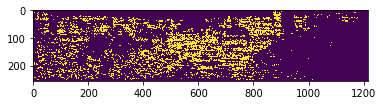

667
243.95067542951372


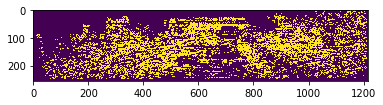

668
232.2826625544486


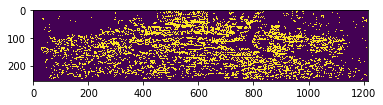

669
259.49769797183603


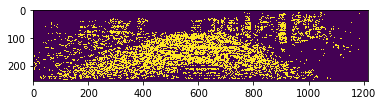

670
231.22094418540865


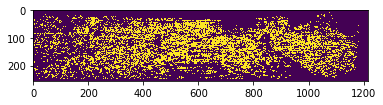

671
102.93900904547374


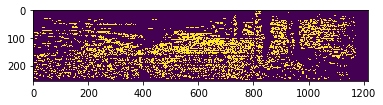

672
207.4434087744887


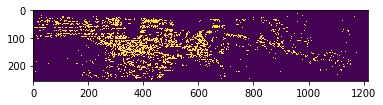

673
188.5008321005917


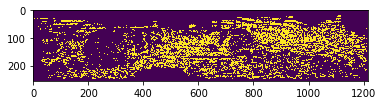

674
164.42421581264514


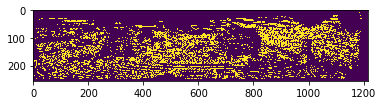

675
204.36133850576226


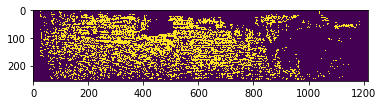

676
170.74012756347656


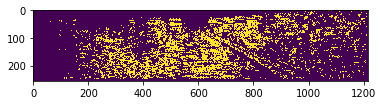

677
178.37267939680365


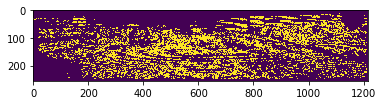

678
207.28284943256548


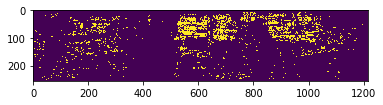

679
194.4652478448276


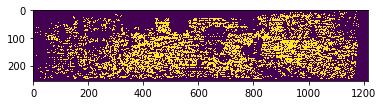

680
195.69942773137555


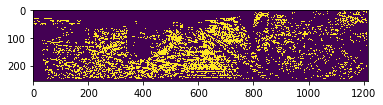

681
305.93583021164125


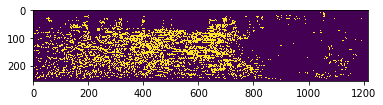

682
233.2388099602811


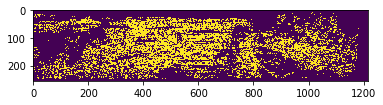

683
276.00409647161854


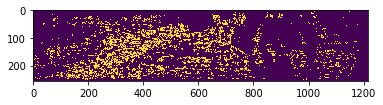

684
190.28743378736286


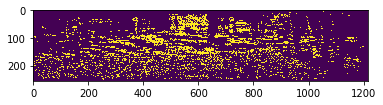

685
289.53762491893167


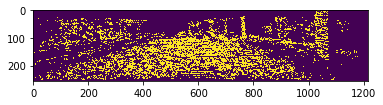

686
274.9482584457407


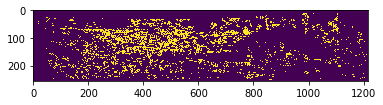

687
153.00429413125252


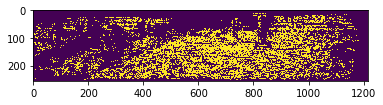

688
175.1623853211009


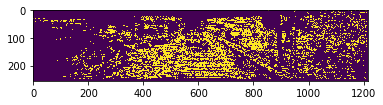

689
229.90318545464683


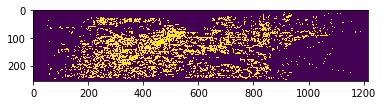

690
118.73857430934021


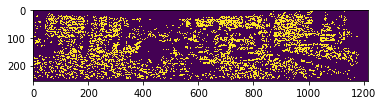

691
199.13034519538448


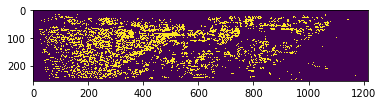

692
216.0945143822711


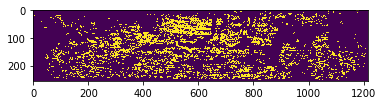

693
278.1806011691565


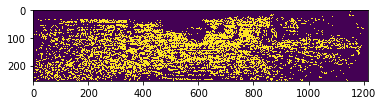

694
168.5765435090109


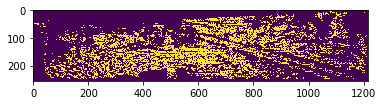

695
156.21767872243544


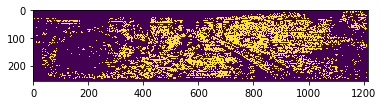

696
193.47461587554056


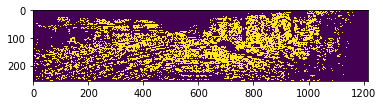

697
196.69938811049477


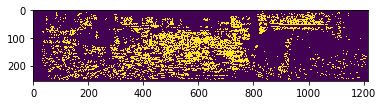

698
238.7535005145783


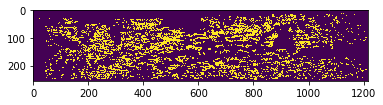

699
198.2216684601008


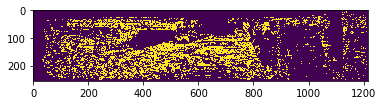

700
165.08932642297475


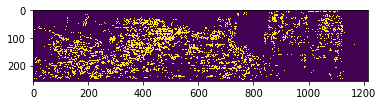

701
192.13361499992456


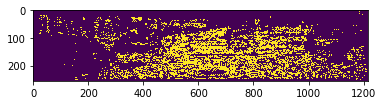

702
142.96269728652646


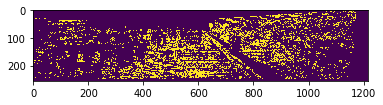

703
176.97182782938324


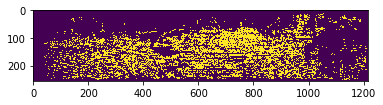

704
31.11434209776393


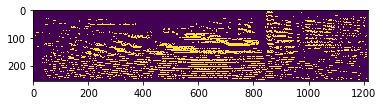

705
229.66855856267082


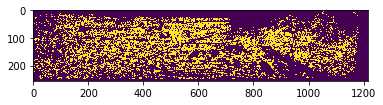

706
250.08394117915435


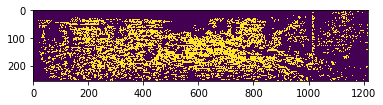

707
121.8445118833347


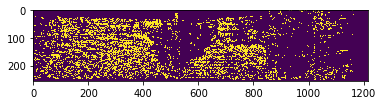

708
251.8307049868953


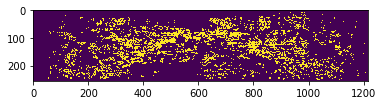

709
166.5798709123114


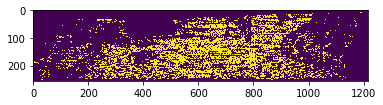

710
149.5564649142001


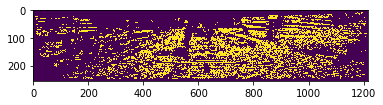

711
204.67836893722307


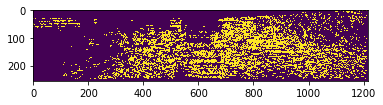

712
260.6614272557261


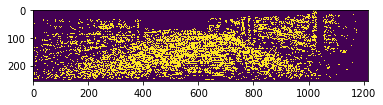

713
264.0305113103246


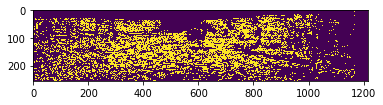

714
226.5030528964163


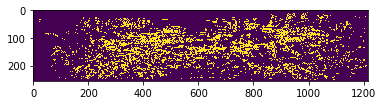

715
199.34449419805327


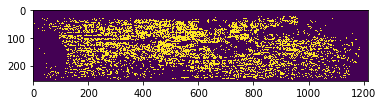

716
188.3439480822948


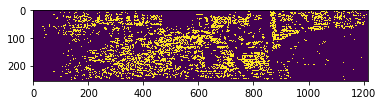

717
196.86467722971838


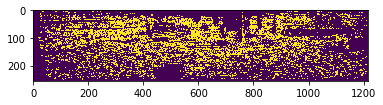

718
147.72403285343972


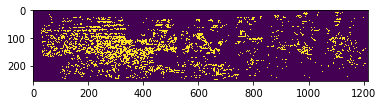

719
187.1558330888253


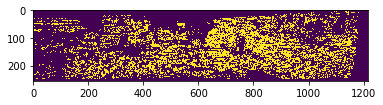

720
196.449772724381


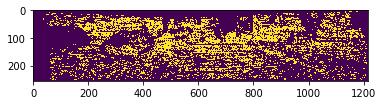

721
217.2363672043342


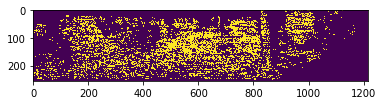

722
221.04363911634255


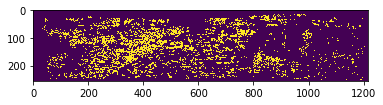

723
222.08006631441552


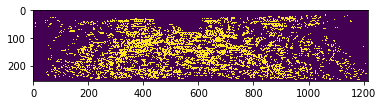

724
131.24537277260302


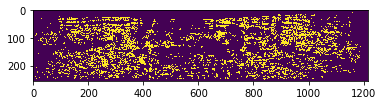

725
164.78655100276825


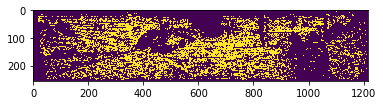

726
130.21331954409868


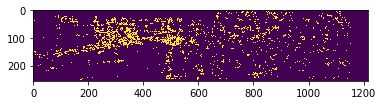

727
166.49835223908505


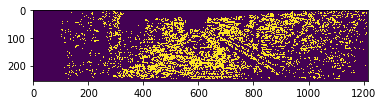

728
206.24330858104705


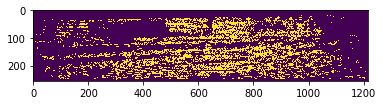

729
139.22807170279268


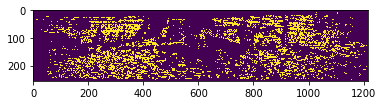

730
182.60564527809964


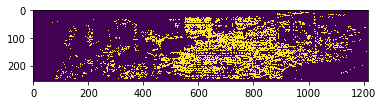

731
223.23735489220564


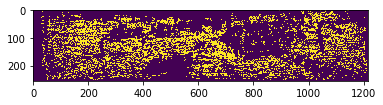

732
235.88960602445826


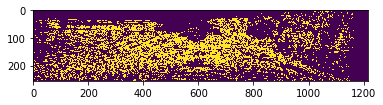

733
236.6323787201355


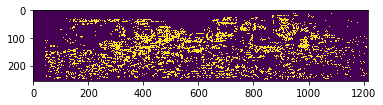

734
186.99389632477119


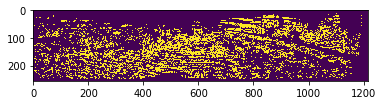

735
283.34673810247574


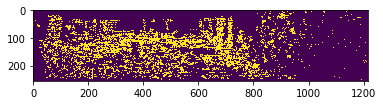

736
274.8760166377673


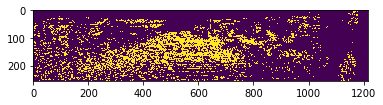

737
214.36934160989603


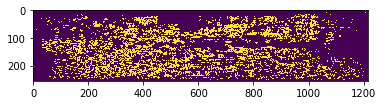

738
181.2842702460522


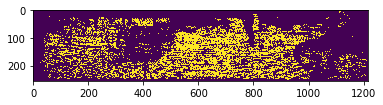

739
222.45736709154528


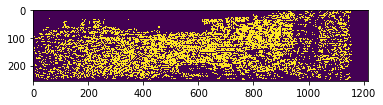

740
271.327109361428


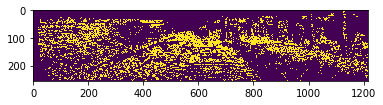

741
213.61582406329345


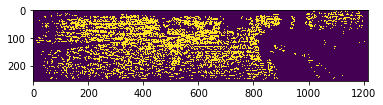

742
228.83188640868792


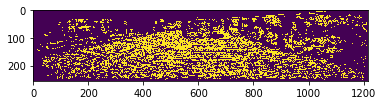

743
225.14479419787259


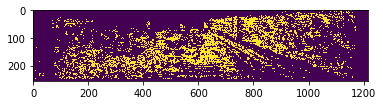

744
170.80927985310464


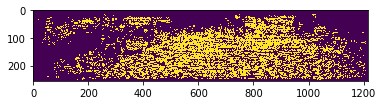

745
196.92900066781525


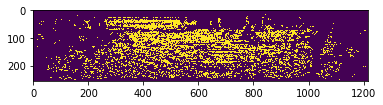

746
233.41733162032068


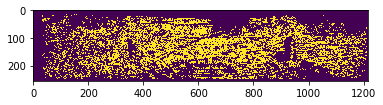

747
198.37047746332564


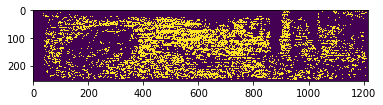

748
183.20145059513953


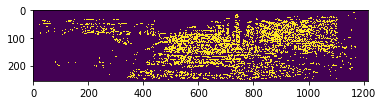

749
172.956674090978


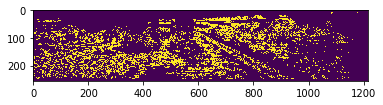

750
200.34801878170694


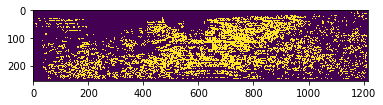

751
200.91260406628646


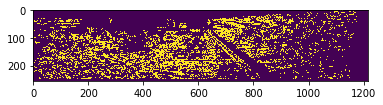

752
189.42712365318476


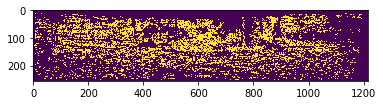

753
212.22985608685835


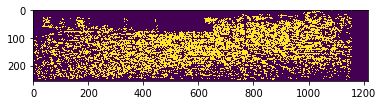

754
245.05922877055445


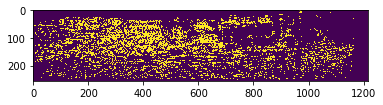

755
283.5017614014583


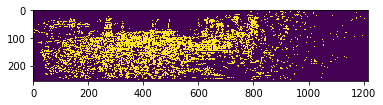

756
177.65012773147365


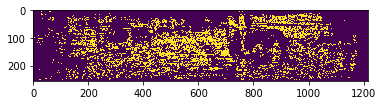

757
190.5437168246312


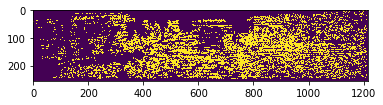

758
227.84085926376824


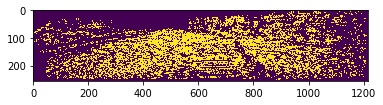

759
323.3614053672316


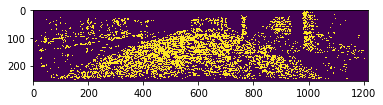

760
264.6067892529919


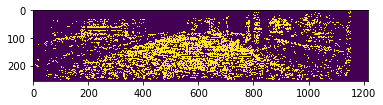

761
138.07225645169436


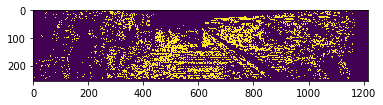

762
232.4335080239992


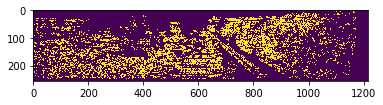

763
148.00748122070567


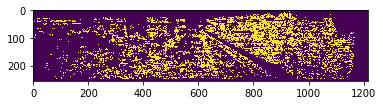

764
106.27003887790804


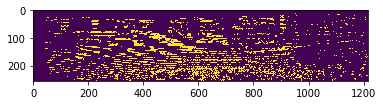

765
162.27747780104542


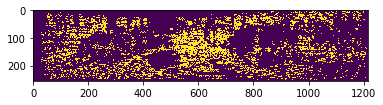

766
120.4957507905506


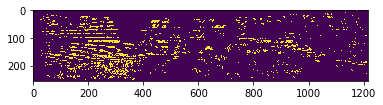

767
193.32922805680553


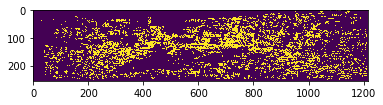

768
293.2864304564377


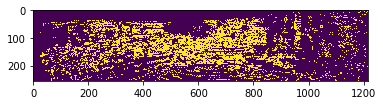

769
157.47819944542084


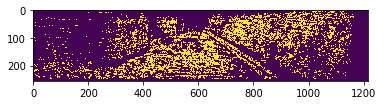

770
153.9339398325902


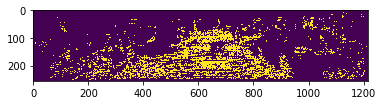

771
148.44386394083827


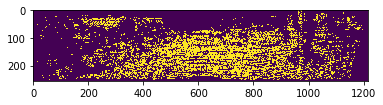

772
163.66057819718188


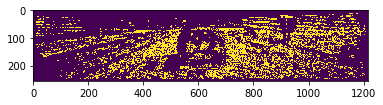

773
207.71988188976377


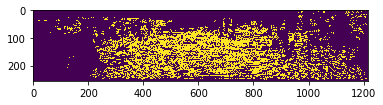

774
127.87554853489517


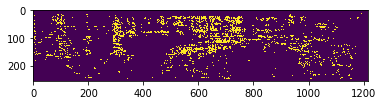

775
226.2319270178916


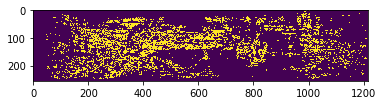

776
170.29550867164198


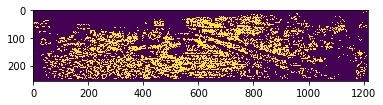

777
189.73942819570314


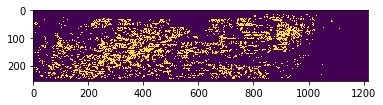

778
133.2782745361328


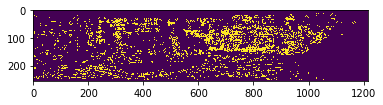

779
266.31618504202714


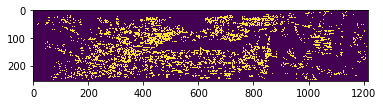

780
266.9740968793751


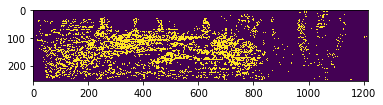

781
179.71306987623947


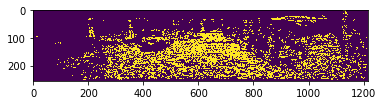

782
222.48048066656497


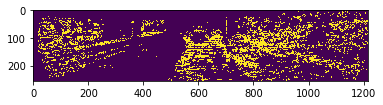

783
246.45076348640214


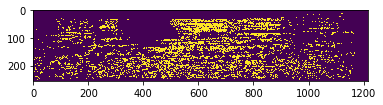

784
172.6312107197467


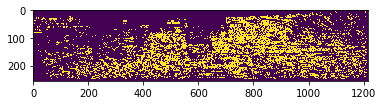

785
186.47734202411635


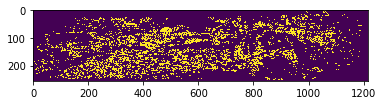

786
162.94433016921516


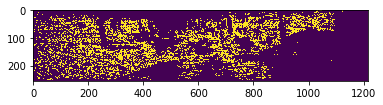

787
167.9600670071131


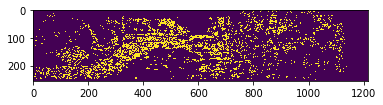

788
171.63966521663096


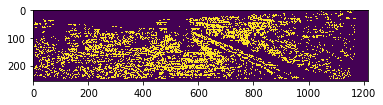

789
231.7234973458854


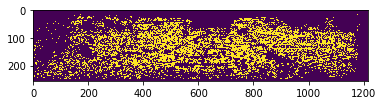

790
241.71160531985612


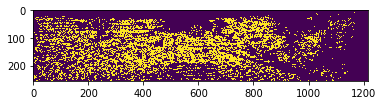

791
381.48410092825435


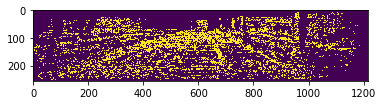

792
209.32843515804623


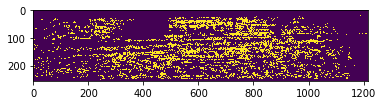

793
253.0103342119267


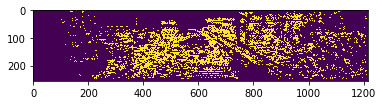

794
204.66935050269754


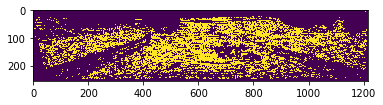

795
182.0235589750667


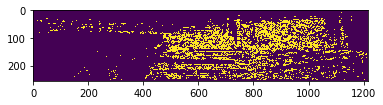

796
196.2093366566901


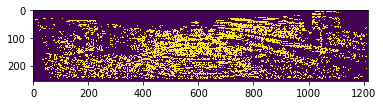

797
169.54336926060125


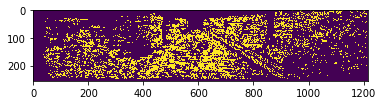

798
185.87821248567712


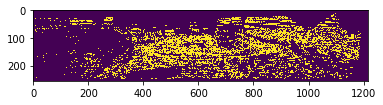

799
216.48535802208187


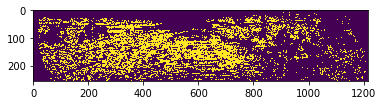

800
270.8974091503493


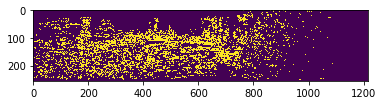

801
179.88270231754194


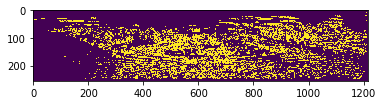

802
516.5784714378668


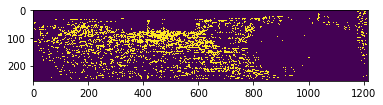

803
231.4570291293431


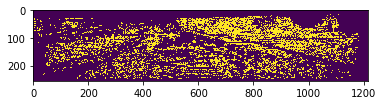

804
153.10438898939444


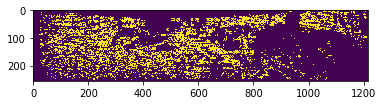

805
271.70523074330265


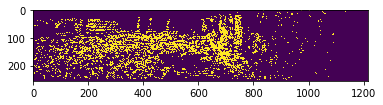

806
225.05564547947685


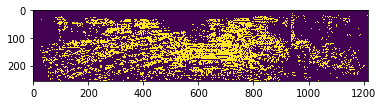

807
164.40627933583667


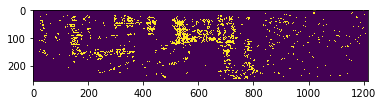

808
208.10612928607733


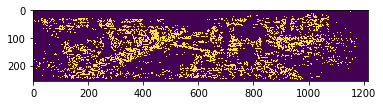

809
230.2650885371923


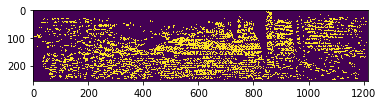

810
182.20855349335315


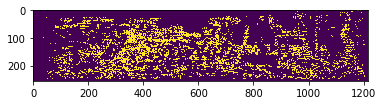

811
323.9503042596349


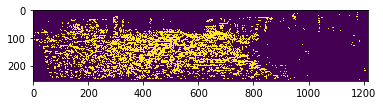

812
430.6895573212259


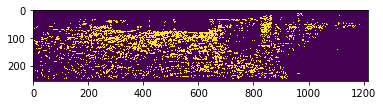

813
218.03883403730268


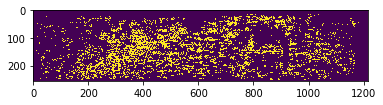

814
220.46018802639688


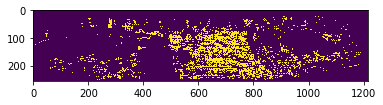

815
230.10689820271065


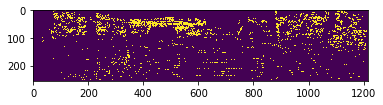

816
282.9531936680023


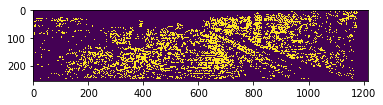

817
191.13046978976044


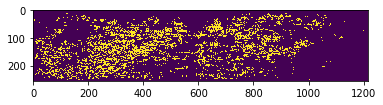

818
166.49018508073343


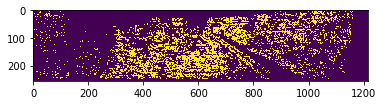

819
101.28747321478265


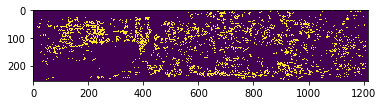

820
221.4994666635409


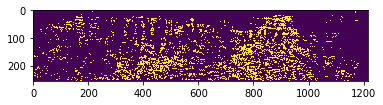

821
218.6372579858258


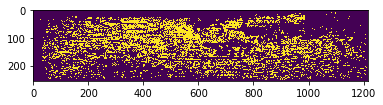

822
346.1818882687709


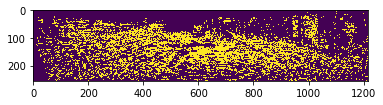

823
142.79355873589668


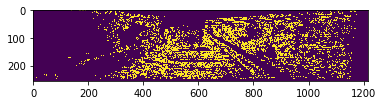

824
174.46301025822962


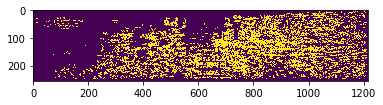

825
335.6577694725289


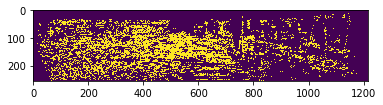

826
230.4373174106914


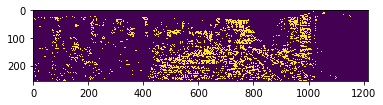

827
253.22616248438965


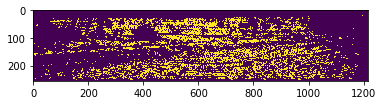

828
113.09852178127494


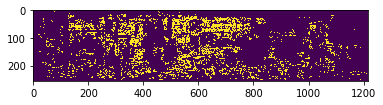

829
195.49037030126476


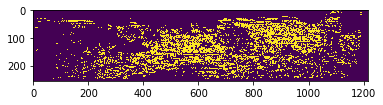

830
231.03352123054003


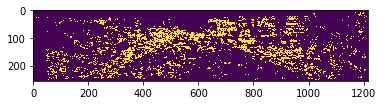

831
211.21233496592845


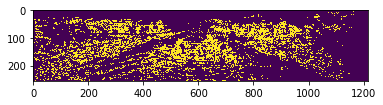

832
222.11619899623471


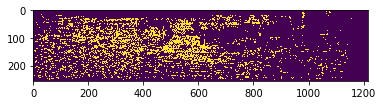

833
294.78277454965


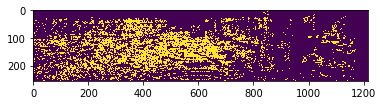

834
124.97324875113533


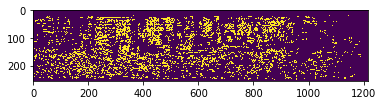

835
117.95850902924191


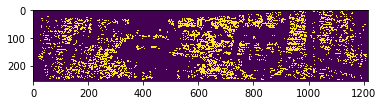

836
176.47627923911296


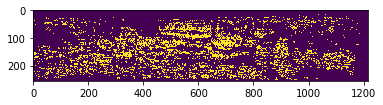

837
222.85284549291904


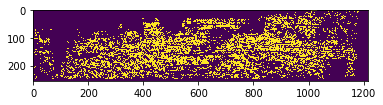

838
168.67352219504787


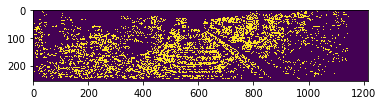

839
236.133325729927


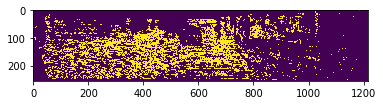

840
218.84315808198116


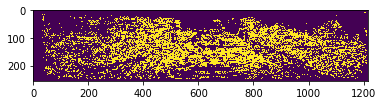

841
31.710530725008937


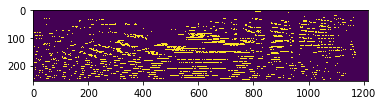

842
159.02546346882284


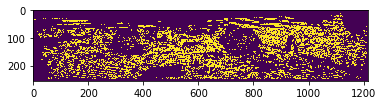

843
275.02301260763176


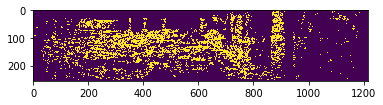

844
295.3308495858236


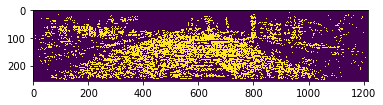

845
207.087497133904


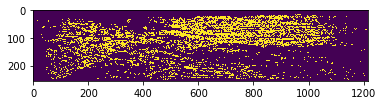

846
198.43060777774826


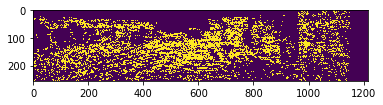

847
212.1176822205061


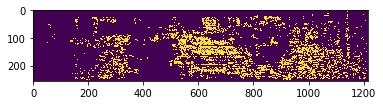

848
159.62439671323258


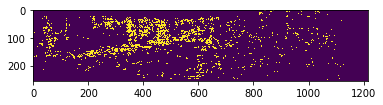

849
230.50580460688045


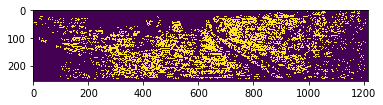

850
146.92250188816422


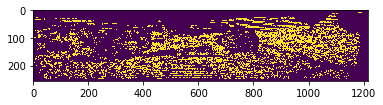

851
232.44690363719334


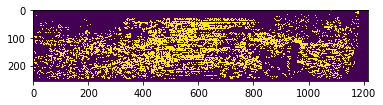

852
317.7351066142784


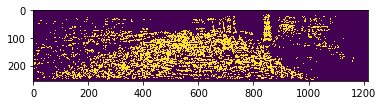

853
174.03708283022576


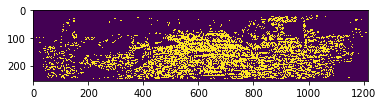

854
200.3565646296085


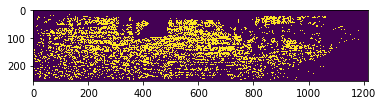

855
232.1477167960723


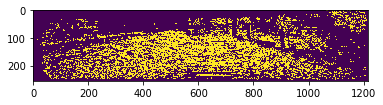

856
187.70595177052542


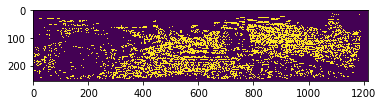

857
351.9945371240602


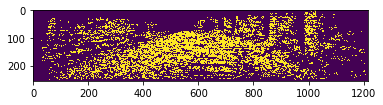

858
157.13596905209008


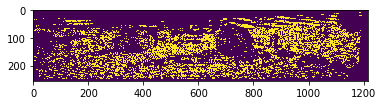

859
323.00941211276677


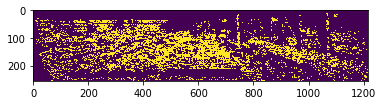

860
239.55680458792904


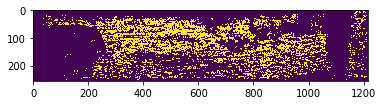

861
169.10526440485216


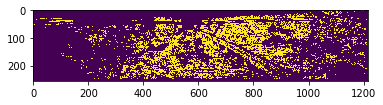

862
261.75843900234315


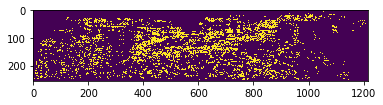

863
158.69024167496906


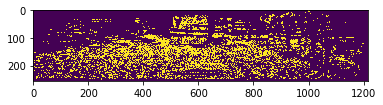

864
168.03421743107077


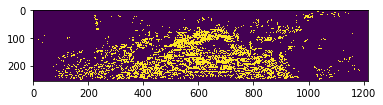

865
236.30830998254433


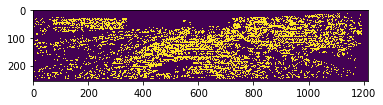

866
180.1218661798874


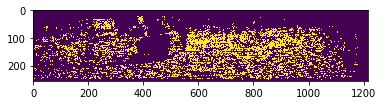

867
261.1804059982452


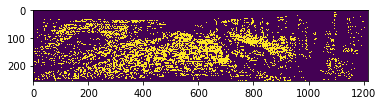

868
176.53741202547073


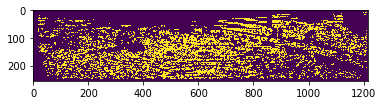

869
204.92133344131744


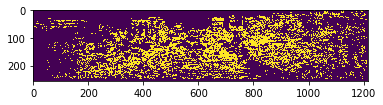

870
109.02264654190802


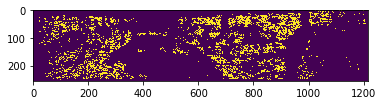

871
181.0746525345057


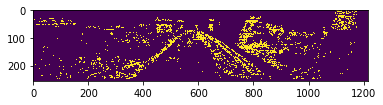

872
230.16582837442147


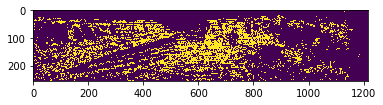

873
280.73357607239075


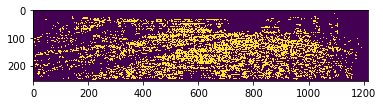

874
250.94192677955374


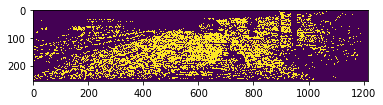

875
318.4096756298704


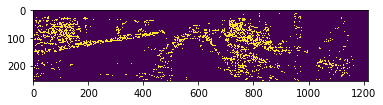

876
223.3261438186994


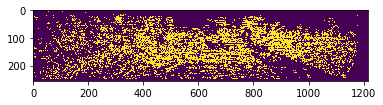

877
207.6984405980658


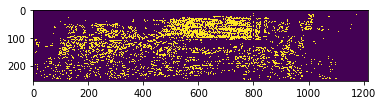

878
120.3111066093876


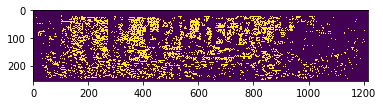

879
207.82998394601245


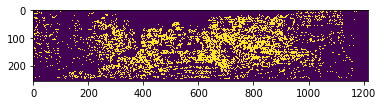

880
170.55440807493153


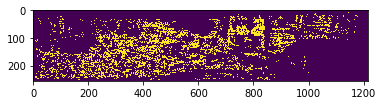

881
101.61527533215944


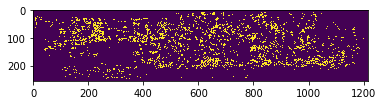

882
155.75877768546667


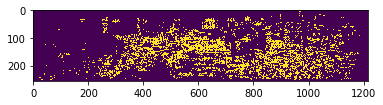

883
234.22891745867017


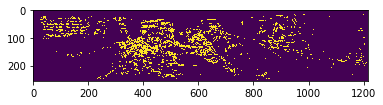

884
172.77682616607248


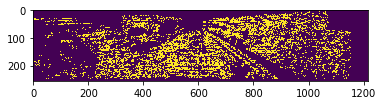

885
179.56143777535013


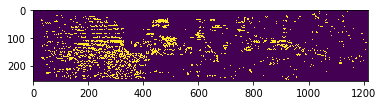

886
156.22364469111392


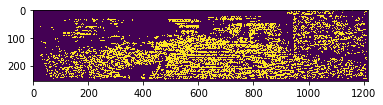

887
223.8702112247818


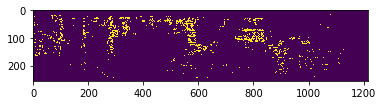

888
159.50727420949406


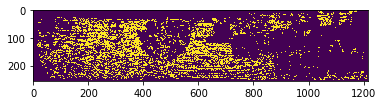

889
195.44141715606045


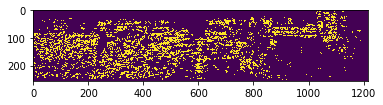

890
164.3137589027376


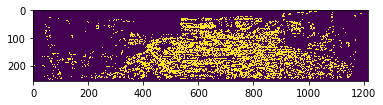

891
207.7201626594869


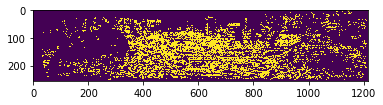

892
90.00806210019913


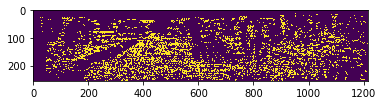

893
324.2928841028268


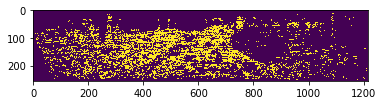

894
156.9841524761567


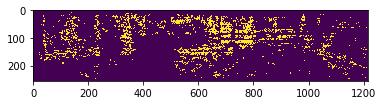

895
183.91100041323082


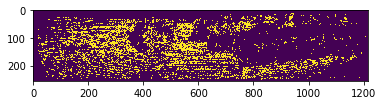

896
217.63954145328768


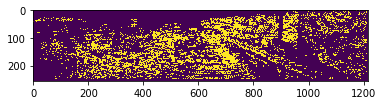

897
169.78733141191134


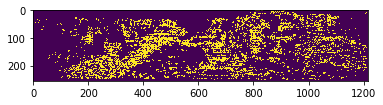

898
157.4602053472988


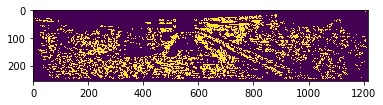

899
162.04513251867382


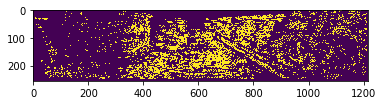

900
208.17634970244467


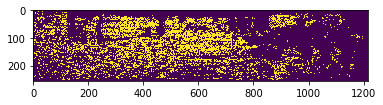

901
353.5180258749949


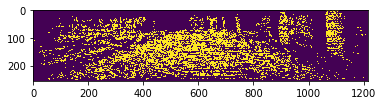

902
299.49869121814226


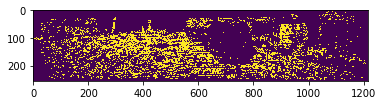

903
219.68459852579724


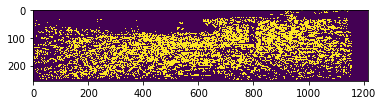

904
181.40340311211693


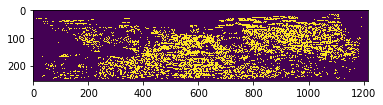

905
339.0637062884916


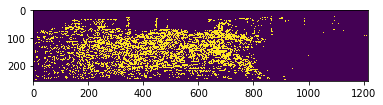

906
239.24874992794975


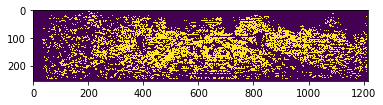

907
229.59577005526648


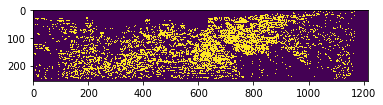

908
232.108575705317


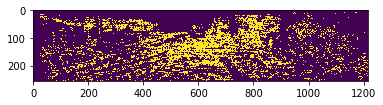

909
173.25428512464168


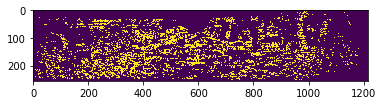

910
188.28731691590002


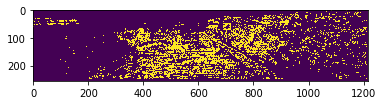

911
190.29913066218322


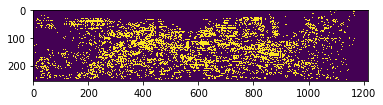

912
153.07440150988378


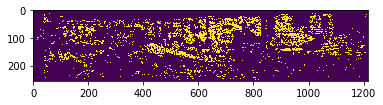

913
213.35836042032452


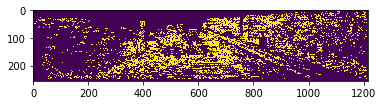

914
185.726681058966


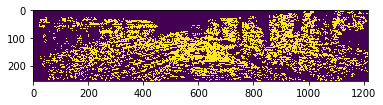

915
187.4105421590407


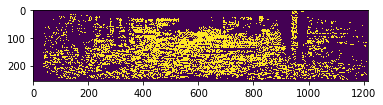

916
126.68750354494279


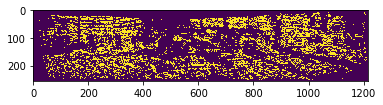

917
182.84853281260106


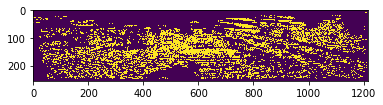

918
226.46135446974245


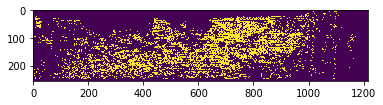

919
256.86241646447877


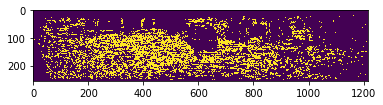

920
218.6633442788712


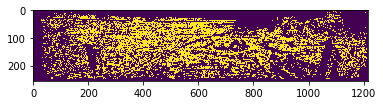

921
209.5818648770246


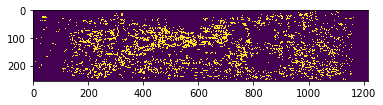

922
217.36874708002404


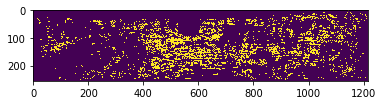

923
223.63071358174548


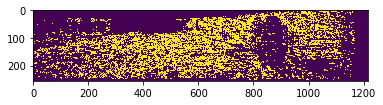

924
228.03884867599788


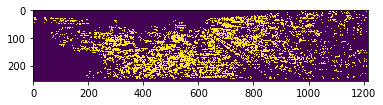

925
220.47307327661485


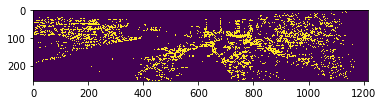

926
105.12737062537283


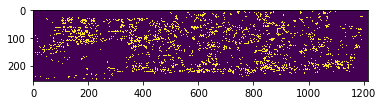

927
218.1507768222929


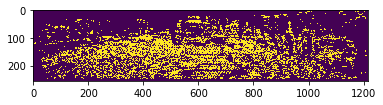

928
165.92424485861181


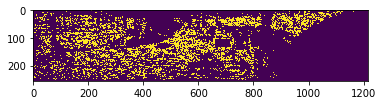

929
249.06844219262413


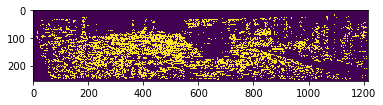

930
217.17524018720255


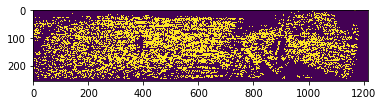

931
187.14639601651143


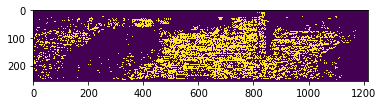

932
239.3599475821685


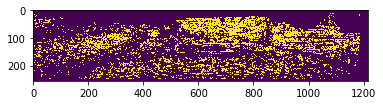

933
208.81061492803977


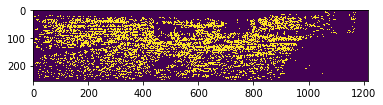

934
267.63686492446715


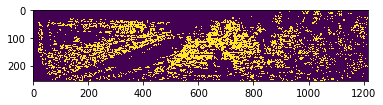

935
116.04876536110929


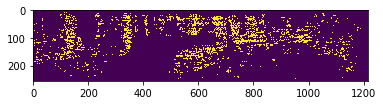

936
227.79666594469552


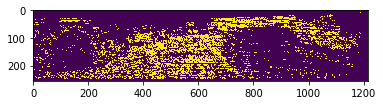

937
154.62303474017625


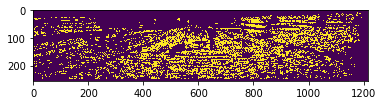

938
206.83167487101923


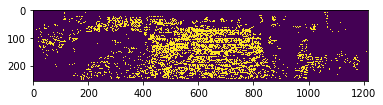

939
266.68836046982744


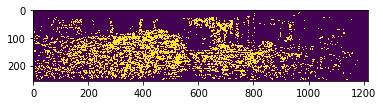

940
191.74506770294727


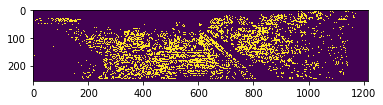

941
317.7418036644686


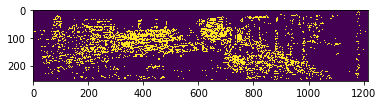

942
197.6969015323751


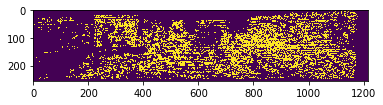

943
218.09742083269438


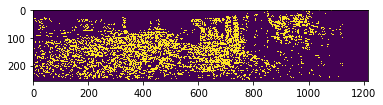

944
234.44795046611043


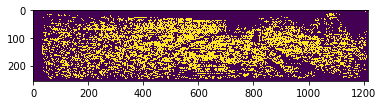

945
176.2258946892381


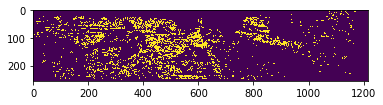

946
574.4534303608734


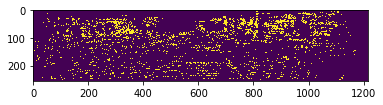

947
266.20788333895825


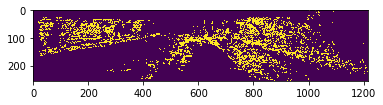

948
176.09885738337712


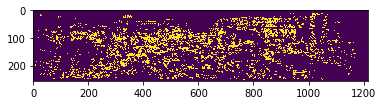

949
202.35493289564772


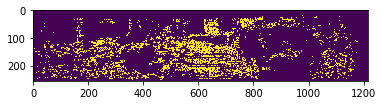

950
214.89278039056904


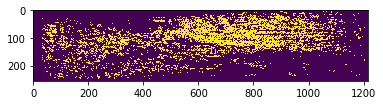

951
266.2491981264719


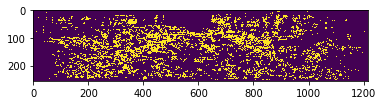

952
213.5631827559023


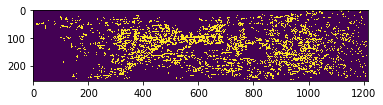

953
113.33694539115753


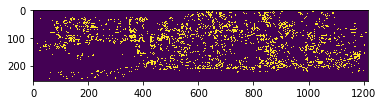

954
174.45874684573306


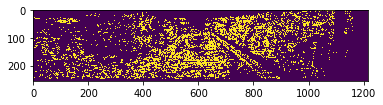

955
200.14431138815982


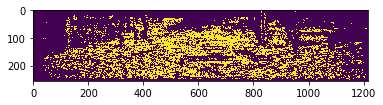

956
166.4351931519212


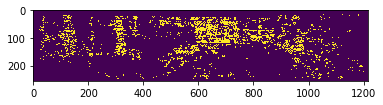

957
355.37882829652324


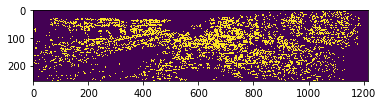

958
149.91279832864902


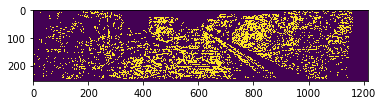

959
170.7733008086503


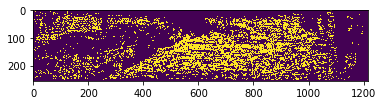

960
225.7994360762012


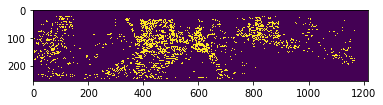

961
154.42713172592502


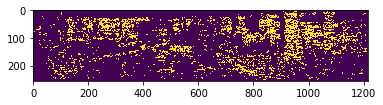

962
205.07027513104208


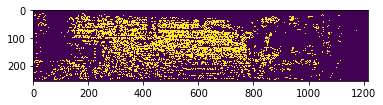

963
251.24129850568735


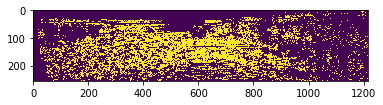

964
419.3757149127474


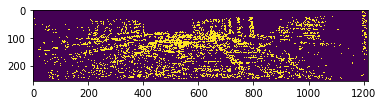

965
181.8311386992033


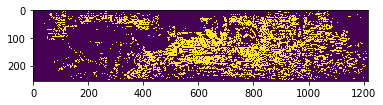

966
235.73873033922294


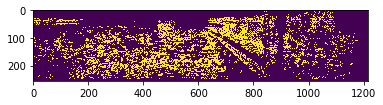

967
175.56449298469389


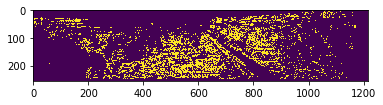

968
241.72779066593887


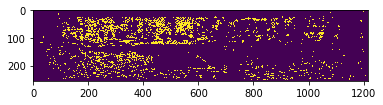

969
149.93231967455162


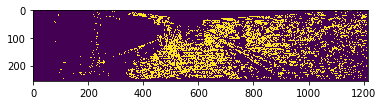

970
358.44522624749595


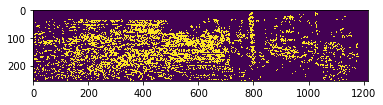

971
302.9156040233334


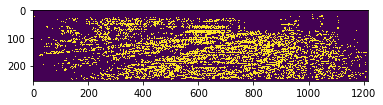

972
170.39063762660274


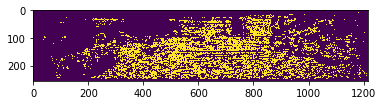

973
193.44745259823804


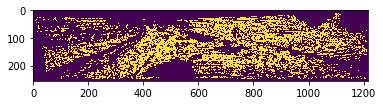

974
157.2726817072669


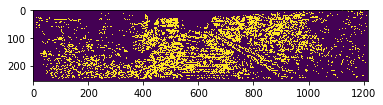

975
158.16720713245505


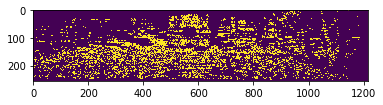

976
233.2587432607974


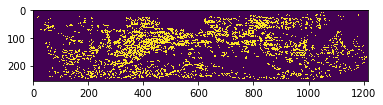

977
270.34191376997467


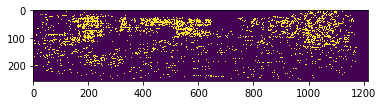

978
217.99344782534197


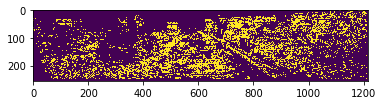

979
272.36016584939694


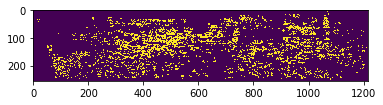

980
166.18299768912854


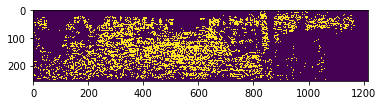

981
146.80861125122394


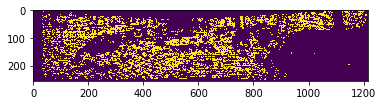

982
203.942417919382


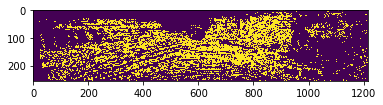

983
183.30210714533112


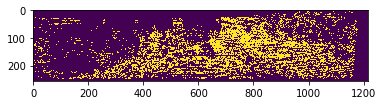

984
153.01846090678583


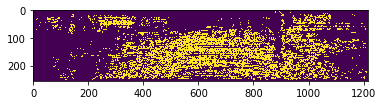

985
225.01640765288482


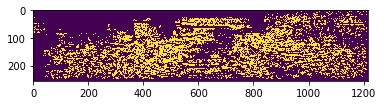

986
168.0635553463422


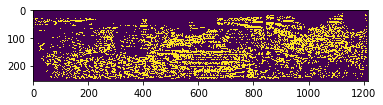

987
175.63434676990815


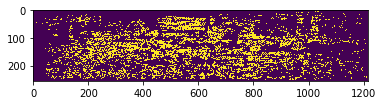

988
168.47971881901904


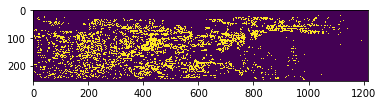

989
265.8369106366551


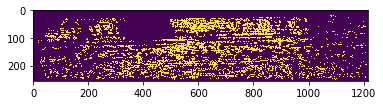

990
155.92994149842684


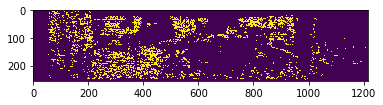

991
348.26542325568767


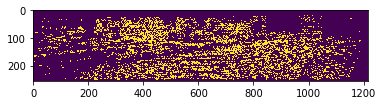

992
149.64225705156457


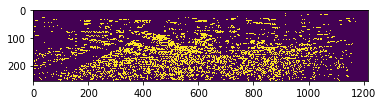

993
171.4278886262514


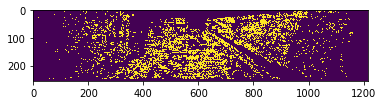

994
158.5752938583277


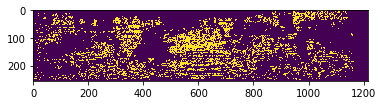

995
252.62793174465844


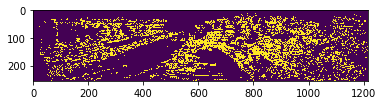

996
261.9441137015931


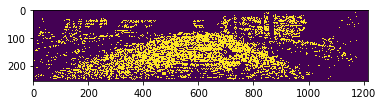

997
224.18851141235433


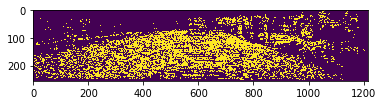

998
147.11845978032096


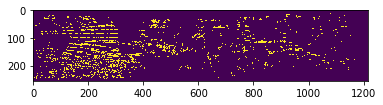

999
152.59457246881027


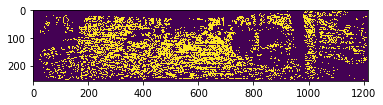

210.18908147819232


'\n    #mask_map=gt>0.1\n    \n    \n\n\n\n    distace_map=np.abs(height_list_offset)+np.abs(width_list_offset)\n\n    for j in range(25):\n\n        if j==29:\n            if np.sum(np.logical_and(mask_map,distace_map>(distace[j])))==0:\n                distance_count[24]+=0\n            else:\n                distance_count[24]+=1\n                distace_error[24]+=np.sqrt(np.mean(mae[np.logical_and(mask_map,distace_map>(distace[j]))]**2))\n        else:\n            if np.sum(np.logical_and(mask_map,np.logical_and(distace_map>distace[j]-1,distace_map<distace[j]+1)))==0:\n                distance_count[j]+=0\n            else:\n                distance_count[j]+=1\n                distace_error[j]+=np.sqrt(np.mean(mae[np.logical_and(mask_map,np.logical_and(distace_map>distace[j]-1,distace_map<distace[j]+1))]**2))\n'

In [4]:
distace=[i for i in range(0,25)]
distace_error=[0 for i in range(0,25)]
distance_count=[0 for i in range(0,25)]



evaluate=Result()
rmse_total=0
mae_total=0
irmse_total=0
imae_total=0
ratio_total=0.0
indi_ratio=0.0
for i in range(1000):
    print (i)
    img_batch,lidar_batch,ground_truth,semantic= read_one_val(i)
    
    lidar_mask=np.logical_and(np.squeeze(lidar_batch)>0.1,np.squeeze(ground_truth)>0.1)
    
    lidar_batch=np.squeeze(lidar_batch)*(1-lidar_mask)+np.squeeze(ground_truth)*lidar_mask

    depth_map,mask_map,height_list_offset,width_list_offset=outlier_removal_batch(lidar_batch, lidar_mask)
    depth_map=depth_map[96:,:]
    mask_map=mask_map[96:,:]
    height_list_offset= height_list_offset[96:,:]
    width_list_offset=width_list_offset[96:,:]
    gt=np.squeeze(ground_truth)[96:,:]
    mae=np.abs(gt-depth_map)
    

    mask_map=np.logical_and(mask_map,gt>0.1)

    ground_truth=np.squeeze(ground_truth)[96:,:]

    rmse_ind=np.sum(np.abs((depth_map*1000.-ground_truth*1000.)*mask_map))/np.sum(mask_map)
    print (rmse_ind)
    irmse_total+=rmse_ind
    plt.imshow(mask_map)
    plt.show()
print (irmse_total/1000.0)
'''
    #mask_map=gt>0.1
    
    



    distace_map=np.abs(height_list_offset)+np.abs(width_list_offset)

    for j in range(25):

        if j==29:
            if np.sum(np.logical_and(mask_map,distace_map>(distace[j])))==0:
                distance_count[24]+=0
            else:
                distance_count[24]+=1
                distace_error[24]+=np.sqrt(np.mean(mae[np.logical_and(mask_map,distace_map>(distace[j]))]**2))
        else:
            if np.sum(np.logical_and(mask_map,np.logical_and(distace_map>distace[j]-1,distace_map<distace[j]+1)))==0:
                distance_count[j]+=0
            else:
                distance_count[j]+=1
                distace_error[j]+=np.sqrt(np.mean(mae[np.logical_and(mask_map,np.logical_and(distace_map>distace[j]-1,distace_map<distace[j]+1))]**2))
'''


In [17]:
 np.mean(mask_map)

0.6472681949013158

In [10]:
distace_error_mean=[distace_error[i]/distance_count[i] for i in range(25)]
print (distace_error_mean)

[0.0, 0.578096732125621, 0.6865209420828002, 0.6953574887760113, 0.80916316850246, 1.3474431761892465, 2.630756572109316, 3.7351571492456745, 4.690649534533139, 5.115169841615955, 5.6966028956053885, 5.4615058163476915, 6.187130302198504, 6.391167705607225, 5.94442121556406, 6.316710028556934, 6.192659406558326, 7.2098838788582, 7.326577600729471, 7.315840824698555, 7.247725259873362, 7.365955426533762, 6.874415720794067, 7.316133962945089, 8.72463008566862]


(-1, 25)

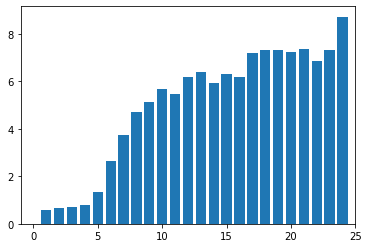

In [11]:
distace_error_mean=[distace_error[i]/distance_count[i] for i in range(25)]
x_axis=[]
for i in range(len(distace_error_mean)):
    x_axis.append(i)
    
plt.bar(x_axis,distace_error_mean)


plt.xlim(-1, 25)

In [20]:
np.sum(np.asarray(distace_ratio/np.sum(distace_ratio))*np.asarray(distace_error_mean))

1.1570765591547632

In [19]:
distace_ratio/np.sum(distace_ratio)

array([0.06249091, 0.21634586, 0.29342073, 0.2027347 , 0.08971572,
       0.03155583, 0.01474208, 0.00987821, 0.00786589, 0.00678866,
       0.00612061, 0.00565008, 0.00528773, 0.00498774, 0.00473315,
       0.00451457, 0.00431944, 0.00413975, 0.00397145, 0.00381545,
       0.00366833, 0.00352285, 0.00338243, 0.00324335, 0.00310449])

In [21]:
distace=[i for i in range(0,25)]
distace_error=[0 for i in range(0,25)]
distance_count=[0 for i in range(0,25)]



evaluate=Result()
rmse_total=0
mae_total=0
irmse_total=0
imae_total=0
ratio_total=0.0
indi_ratio=0.0
for i in range(1000):
    print (i)
    img_batch,lidar_batch,ground_truth,semantic= read_one_val(i)
    
    lidar_mask=np.logical_and(np.squeeze(lidar_batch)>0.1,np.squeeze(ground_truth)>0.1)
    

    depth_map,mask_map,height_list_offset,width_list_offset=outlier_removal_batch(lidar_batch, lidar_mask)
    depth_map=depth_map[96:,:]
    mask_map=mask_map[96:,:]
    height_list_offset= height_list_offset[96:,:]
    width_list_offset=width_list_offset[96:,:]
    gt=np.squeeze(ground_truth)[96:,:]
    mae=np.abs(gt-depth_map)
    mask_map=np.logical_and(mask_map,gt>0.1)
    #mask_map=gt>0.1
    
    



    distace_map=np.abs(height_list_offset)+np.abs(width_list_offset)

    for j in range(25):

        if j==29:
            if np.sum(np.logical_and(mask_map,distace_map>(distace[j])))==0:
                distance_count[15]+=0
            else:
                distance_count[15]+=1
                distace_error[15]+=np.sqrt(np.mean(mae[np.logical_and(mask_map,distace_map>(distace[j]))]**2))
        else:
            if np.sum(np.logical_and(mask_map,np.logical_and(distace_map>distace[j]-1,distace_map<distace[j]+1)))==0:
                distance_count[j]+=0
            else:
                distance_count[j]+=1
                distace_error[j]+=np.sqrt(np.mean(mae[np.logical_and(mask_map,np.logical_and(distace_map>distace[j]-1,distace_map<distace[j]+1))]**2))



0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

(-1, 16)

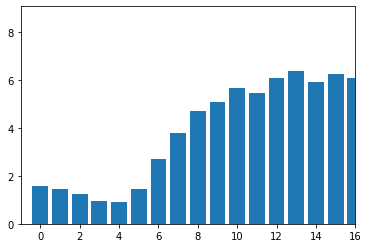

In [22]:
distace_error_mean_2=[distace_error[i]/distance_count[i] for i in range(25)]
x_axis=[]
for i in range(len(distace_error_mean_2)):
    x_axis.append(i)
    
plt.bar(x_axis,distace_error_mean_2)


plt.xlim(-1, 16)

In [23]:
np.sum(np.asarray(distace_ratio/np.sum(distace_ratio))*np.asarray(distace_error_mean_2))

1.674121646527811

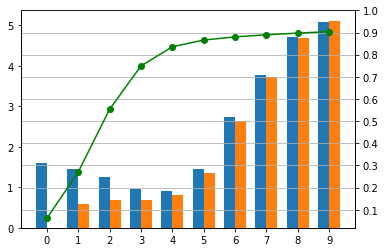

In [23]:

from matplotlib.lines import Line2D

labels = x_axis
men_means = distace_error_mean_2
women_means = distace_error_mean

x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars

fig, ax2 = plt.subplots()



rects1 = ax2.bar(x[:10] - width/2, men_means[:10], width, label='Sparse input NN')
rects2 = ax2.bar(x[:10] + width/2, women_means[:10], width, label='Sparse GT NN')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax2.add_line (Line2D([0], [0], color='green', linewidth=3,label='Accumulate Probability') )
#labels = ['black data', 'red data', 'green data']
#plt.legend(lines, labels)
#plt.show()



ax2.set_xticks(x[:10])
ax2.set_xticklabels(labels)
#ax2.legend(prop={'size': 10})



ax=ax2.twinx()
# make a plot with different y-axis using second axis object


ax.plot(x_axis[:10],y_axis[:10],color="green",marker="o",label='ss')
#ax.set_ylabel("gdpPercap",color="green",fontsize=14)
yticks=[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0]
ax.set_yticks(yticks)
ax.grid()


fig.savefig('third.eps')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


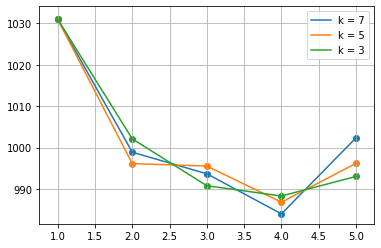

In [5]:
repeat_time=[1,2,3,4,5]

k_size_7_rmse=[1031,998.89,993.68,984,1002.37]

k_size_5_rmse=[1031,996.14,995.54,986.83,996.2]

k_size_3_rmse=[1031,1002.12,990.79,988.31,993.04]





#plt.plot([1,2,3,4],[1048,1048,1048,1048],label='NN_refine',linestyle='--',color='y')
#plt.plot([1,3,5,7],[1033,1033,1033,1033],label='baseline',linestyle='--',color='c')
plt.scatter(repeat_time,k_size_7_rmse)
plt.plot(repeat_time,k_size_7_rmse,label='k = 7')
plt.scatter(repeat_time,k_size_5_rmse)
plt.plot(repeat_time,k_size_5_rmse,label='k = 5')
plt.scatter(repeat_time,k_size_3_rmse)
plt.plot(repeat_time,k_size_3_rmse,label='k = 3')
plt.grid()
plt.legend()
plt.savefig('./ii.eps', format='eps')
plt.show()

In [14]:


RMSE=[758.38,1019.64,917.64,777.05,814.73,832.94,841.78,829.98,762.16,752.88,741.68,743.69,965.87]
Parameters=[144*10**6, 17.4*10**6,5.3*10**6,28.99*10**6,26*10**6,28.99*10**6,2*10**6,355*10**3,1.2*10**6,1.9*10**6,22*10**6,27*10**6,26.5*10**6]
label=['DeepLidar','CSPN','Spade-RGBsD','PwP','Sparse2Dense','DDP','HMS-Net','NConv-CNN-l2','MSG-CHN','FuseNet','NLSPN','CSPN++','DepthCoeff']


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


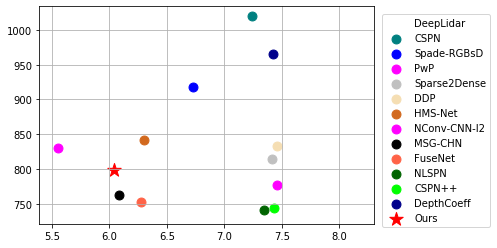

In [15]:
import matplotlib._color_data as mcd

overlap = {name for name in mcd.CSS4_COLORS
           if "xkcd:" + name in mcd.XKCD_COLORS}
overlap=list(overlap)
for i in range(len(RMSE)):
    cn = mcd.CSS4_COLORS[overlap[(i+4)*2+1]]
    plt.scatter(np.log10(Parameters[i]),RMSE[i],label=label[i],c=cn,s=80)
plt.scatter(np.log10(1.1*10**6),798,marker='*',label='Ours',s=200,c='r')

#plt.xlim(5, 10)


plt.grid()
plt.legend(bbox_to_anchor=(1., 1.0), loc='upper left',borderaxespad=0.8)
plt.savefig('./ii.eps', format='eps',bbox_inches='tight')
plt.show()

In [116]:
overlap

{'aqua',
 'aquamarine',
 'azure',
 'beige',
 'black',
 'blue',
 'brown',
 'chartreuse',
 'chocolate',
 'coral',
 'crimson',
 'cyan',
 'darkblue',
 'darkgreen',
 'fuchsia',
 'gold',
 'goldenrod',
 'green',
 'grey',
 'indigo',
 'ivory',
 'khaki',
 'lavender',
 'lightblue',
 'lightgreen',
 'lime',
 'magenta',
 'maroon',
 'navy',
 'olive',
 'orange',
 'orangered',
 'orchid',
 'pink',
 'plum',
 'purple',
 'red',
 'salmon',
 'sienna',
 'silver',
 'tan',
 'teal',
 'tomato',
 'turquoise',
 'violet',
 'wheat',
 'white',
 'yellow',
 'yellowgreen'}